<font size=6>Automatic tagging of questions  
Part 3 : Machine learning approach - Multi-label classification</font>

---

**Checking environment**

In [ ]:
import sys
IN_COLAB = "google.colab" in sys.modules
# PATH_DRIVE : to change according to your Google Drive folders
PATH_DRIVE = "/content/drive/My Drive/MachineLearning/ML05"

In [ ]:
if IN_COLAB:
    print("Le notebook est exécuté sur Google Colab")
else:
    print("Le notebook est exécuté en local")

Le notebook est exécuté sur Google Colab


In [ ]:
if IN_COLAB:
    from google.colab import drive, files
    drive.mount("/content/drive")

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
4/3wFtRD9j4DXqAbncCG4evAvB0weso7CnqEbHkNGYXtVVOysiZEKUk4Y
Mounted at /content/drive


---

<font size=5>**Table of contents**</font>

[1. Notebook preparation](#1_0)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[1.1. Custom classes and methods](#1_0)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[1.2. Data loading](#1_2)  
  
[2. Baseline performance](#2_0)   
  
[3. Semi-supervised learning - Exploring the multi-labelling options](#3_0)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[3.1. Binary Relevance](#3_0)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[3.2. Classifier chains](#3_2)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[3.3. Label Powerset](#3_3)  
  
[4. Semi-supervised learning models - hyperparameter optimization](#4_0)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[4.1. Models based on Binary Relevance or Classifier Chains](#4_0)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[4.2. Analysis of the most promising hyperparameters for Random Forest](#4_2)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[4.3. Model based on ML-kNN](#4_3)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[4.4 Fine tuning of the Random Forest model](#4_4)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[4.5. Performance analysis of the best model](#4_5)  
  
[5. Supervised learning models - hyperparameter optimization](#5_0)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[5.1. Models based on Binary Relevance or Classifier Chains](#5_0)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[5.2. Model based on ML-kNN](#5_2)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[5.3. Fine tuning of the Logistic Regression model](#5_3)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[5.4. Performance analysis of the best model](#5_4)  
  
[6. Final evaluation : generalization performance](#6_0)  
  
[7. Saving the final model to use within an API](#7_0)  
  
[8. Annex : Graphs for presentation](#8_0)  

---
## <font color=blue>Notebook set-up</font>

**Libraries importation**

In [ ]:
if IN_COLAB:
    !pip install scikit-multilearn

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
import nltk
import csv
import tensorflow_hub as hub
import joblib
if IN_COLAB:
  nltk.download('stopwords')
  nltk.download('wordnet')
  nltk.download('punkt')
  import os

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.feature_extraction import stop_words
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.decomposition import NMF, LatentDirichletAllocation
from sklearn.preprocessing import StandardScaler
from skmultilearn.model_selection import iterative_train_test_split
from skmultilearn.model_selection import IterativeStratification
from hyperopt import hp, STATUS_OK, tpe, fmin, Trials, space_eval
from timeit import default_timer as timer

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.feature_extraction.stop_words module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_extraction.text. Anything that cannot be imported from sklearn.feature_extraction.text is now part of the private API.
  warnings.warn(message, FutureWarning)


In [ ]:
from skmultilearn.problem_transform import BinaryRelevance, ClassifierChain
from skmultilearn.problem_transform import LabelPowerset
from skmultilearn.adapt import MLkNN
from sklearn.metrics import hamming_loss, accuracy_score, f1_score, make_scorer
from sklearn.metrics import jaccard_score
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.model_selection import cross_validate, KFold
from sklearn.multiclass import OneVsRestClassifier

In [ ]:
if IN_COLAB:
    sys.path.append(PATH_DRIVE)
    os.chdir(PATH_DRIVE)
    import sf_graphiques as sfg
else:
    import modules_perso.sf_graphiques as sfg

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


**Notebook set-up**

In [ ]:
def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = fig_id + "." + fig_extension
    if IN_COLAB:
        path = PATH_DRIVE + "/" + path
    #print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, dpi=resolution)

---
<a id='1_0'></a>

## <font color=blue>1. Notebook preparation</font>

### 1.1. Custom classes and methods

In [ ]:
def get_semi_results(filename):
    df = pd.read_csv(filename)
    df["data"] = [param[param.find("data")+8: -2]
                  for param in df.params_data]
    df["bow_maxdf"] = [np.around(np.float(
        param[param.find("max_df")+9: param.find("min_df")-3]), 3)
        for param in df.params_vectorizer]
    df["bow_mindf"] = [np.around(np.float(
        param[param.find("min_df")+9: param.find("ngram_range")-3]), 3)
        for param in df.params_vectorizer]
    df["bow_ngrams"] = [param[param.find("ngram_range")+14: -1]
                        for param in df.params_vectorizer]
    df["factorizer_ntopics"] = [np.int(
        param[param.find("n_components")+15: param.find("topic_word_prior")-3])
        for param in df.params_factorizer]
    df["factorizer_alpha"] = [np.float(
        param[param.find("doc_topic_prior")+18: param.find("n_components")-3])
        for param in df.params_factorizer]
    df["factorizer_beta"] = [np.float(param[param.find("topic_word_prior")+19:
        -1]) for param in df.params_factorizer]
    return df.drop(columns=["params_data", "params_vectorizer",
                            "params_factorizer"])

In [ ]:
def get_semi_logistic(filename):
    df = get_semi_results(filename)
    df["clf"] = "LogisticRegression"
    df["clf_C"] = [np.float(param[param.find("'C'")+5: -1])
        for param in df.params_classifier]
    return df.drop(columns="params_classifier")

In [ ]:
def graph_analysis(df, column_analysis, column_name, algo_name,
                   isbar=False, tick_step=1, rotation=0,
                   ymin=None, ymax=None, show_time=False):
    values_train = []
    values_valid = []
    labels = []
    for cl in np.unique(df[column_analysis]):
        if show_time:
            values_train.append(df[df[column_analysis]==cl].fit_time.max())
            values_valid.append(df[df[column_analysis]==cl].test_time.max())
            subtitle = "Longest Processing Time"
        else:
            values_train.append(df[df[column_analysis]==cl]\
                                .training_hamming_loss.min())
            values_valid.append(df[df[column_analysis]==cl]\
                                .validation_hamming_loss.min())
            subtitle = "Best Hamming Loss"
        labels.append(cl)
    graph = sfg.MyGraph("{} : {}".format(algo_name, column_name))
    if isbar:
        graph.add_barv(np.arange(len(labels))-0.17, values_train,
                       bar_width=0.34, label="Training")
        graph.add_barv(np.arange(len(labels))+0.17, values_valid,
                       bar_width=0.34, label="Validation",
                       legend=True, subtitle=subtitle)
    else:
        graph.add_plot(np.arange(len(labels)), values_train, label="Training")
        graph.add_plot(np.arange(len(labels)), values_valid,
                       label="Validation", with_grid="both", grid_style=":",
                       legend=True, subtitle=subtitle)
    graph.ax[0].set_xticks(np.arange(0, len(labels), tick_step))
    graph.set_axe_x(label=column_name, tick_labels=labels[::tick_step],
                    rotation=rotation, tick_dash=True)
    if show_time:
        graph.set_axe_y(label="Maximum time (seconds)",
                        tick_min=ymin, tick_max=ymax)
    else:
        graph.set_axe_y(label="Best hamming loss (lower is better)",
                        tick_min=ymin, tick_max=ymax)
    ymin, ymax = graph.ax[0].get_ylim()
    idx_ref = np.argmin(values_valid)
    x_ref = idx_ref
    if isbar:
        x_ref += 0.17
    graph.add_fleches(x_ref, ymax, 0, values_valid[idx_ref]-ymax,
                      units='xy', color="dimgrey")
    return graph.fig, graph.ax

In [ ]:
def get_semifull_summary(filename, is_mlknn=False):
    df = pd.read_csv(filename)
    df["data"] = df.params_data
    df["vectorizer"] = [param[param.find("vectorizer")+14: -2]
                        for param in df.params_vectorizer]
    df["vectorizer_maxdf"] = [np.around(np.float(
        param[param.find("max_df")+9: param.find("min_df")-3]), 3)
        for param in df.params_vectorizer]
    df["vectorizer_mindf"] = [np.around(np.float(
        param[param.find("min_df")+9: param.find("ngram_range")-3]), 3)
        for param in df.params_vectorizer]
    df["vectorizer_ngrams"] = [param[param.find("ngram_range")+14:
        param.find("vectorizer")-3] for param in df.params_vectorizer]
    df["factorizer"] = [param[param.find("factorizer")+14: -2]
                        for param in df.params_factorizer]
    df["factorizer_ntopics"] = [np.int(param[param.find("n_components")+15:
        param.find("n_components")+17]) for param in df.params_factorizer]
    if is_mlknn:
        df["multi"] = "ML-kNN"
        df["classifier"] = "ML-kNN"
    else:
        df["multi"] = [param[param.find("multi")+9: param.find("classifier")-4]
                      for param in df.params_classifier]
        df["classifier"] = [param[param.find("classifier")+14: -2]
                            for param in df.params_classifier]
    return df.drop(columns=["params_data","params_vectorizer"])

In [ ]:
def get_semirf_summary(filename):
    df = pd.read_csv(filename)
    df["vectorizer"] = [param[param.find("vectorizer")+14: -2]
                        for param in df.params_vectorizer]
    df["vectorizer_maxdf"] = [np.around(np.float(
        param[param.find("max_df")+9: param.find("min_df")-3]), 3)
        for param in df.params_vectorizer]
    df["vectorizer_mindf"] = [np.around(np.float(
        param[param.find("min_df")+9: param.find("ngram_range")-3]), 3)
        for param in df.params_vectorizer]
    df["vectorizer_ngrams"] = [param[param.find("ngram_range")+14:
        param.find("vectorizer")-3] for param in df.params_vectorizer]
    df["factorizer"] = [param[param.find("factorizer")+14: -2]
                        for param in df.params_factorizer]
    df["factorizer_ntopics"] = [np.int(param[param.find("n_components")+15:
        param.find("n_components")+17]) for param in df.params_factorizer]
    df["multi"] = [param[param.find("multi")+9: param.find("classifier")-4]
                   for param in df.params_classifier]
    df["classifier"] = [param[param.find("classifier")+14: -2]
                        for param in df.params_classifier]
    df["rf_n_estimators"] = \
        [np.int(param[param.find("n_estimators")+15: param.find("multi")-3])
         for param in df.params_classifier]
    df["rf_max_depth"] = \
        [np.int(param[param.find("max_depth")+12: param.find("max_features")-3])
         for param in df.params_classifier]
    df["rf_min_samples_leaf"] = \
        [np.int(param[param.find("min_samples_leaf")+19:
                      param.find("min_samples_split")-3])
         for param in df.params_classifier]
    df["rf_min_samples_split"] = \
        [np.int(param[param.find("min_samples_split")+20:
                      param.find("n_estimators")-3])
         for param in df.params_classifier]
    df["rf_max_features"] = \
        [np.around(np.float(param[param.find("max_features")+15:
                                  param.find("min_samples_leaf")-3]), 3)
         for param in df.params_classifier]
    return df.drop(columns=["params_data", "params_vectorizer",
                            "params_factorizer", "params_classifier"])

In [ ]:
def get_supervised_summary(filename):
    df = pd.read_csv(filename)
    df["data"] = df.params_data
    df["vectorizer"] = [param[param.find("vectorizer")+14: -2]
                        for param in df.params_vectorizer]
    df["vectorizer_maxdf"] = [np.around(np.float(
        param[param.find("max_df")+9: param.find("min_df")-3]), 3)
        if param[param.find("vectorizer")+14: -2] != "use"
        else np.nan for param in df.params_vectorizer]
    df["vectorizer_mindf"] = [np.around(np.float(
        param[param.find("min_df")+9: param.find("ngram_range")-3]), 3)
        if param[param.find("vectorizer")+14: -2] != "use"
        else np.nan for param in df.params_vectorizer]
    df["vectorizer_ngrams"] = [param[param.find("ngram_range")+14:
        param.find("vectorizer")-3] 
        if param[param.find("vectorizer")+14: -2] != "use"
        else np.nan for param in df.params_vectorizer]
    df["multi"] = [param[param.find("multi")+9: param.find("classifier")-4]
                   for param in df.params_classifier]
    df["classifier"] = [param[param.find("classifier")+14: -2]
                        for param in df.params_classifier]
    df["clf_parameter"] = [np.around(np.float(param[param.find("alpha")+8:
        param.find("multi")-3]), 3)
        if param[param.find("classifier")+14: -2] == "naive_bayes"
        else np.around(np.float(param[param.find("C")+4:
        param.find("multi")-3]), 3) for param in df.params_classifier]
    return df.drop(columns=["params_data", "params_vectorizer",
                            "params_classifier"])

In [ ]:
def get_mlknn_summary(filename):
    df = pd.read_csv(filename)
    df["data"] = df.params_data
    df["vectorizer"] = [param[param.find("vectorizer")+14: -2]
                        for param in df.params_vectorizer]
    df["vectorizer_maxdf"] = [np.around(np.float(
        param[param.find("max_df")+9: param.find("min_df")-3]), 3)
        if param[param.find("vectorizer")+14: -2] != "use"
        else np.nan for param in df.params_vectorizer]
    df["vectorizer_mindf"] = [np.around(np.float(
        param[param.find("min_df")+9: param.find("ngram_range")-3]), 3)
        if param[param.find("vectorizer")+14: -2] != "use"
        else np.nan for param in df.params_vectorizer]
    df["vectorizer_ngrams"] = [param[param.find("ngram_range")+14:
        param.find("vectorizer")-3] 
        if param[param.find("vectorizer")+14: -2] != "use"
        else np.nan for param in df.params_vectorizer]
    df["mlknn_k"] = [np.int(param[param.find("k")+4:
        param.find("s")-3]) for param in df.params_classifier]
    df["mlknn_s"] = [np.around(np.float(param[param.find("s")+4: -1]), 3)
        for param in df.params_classifier]
    return df.drop(columns=["params_data", "params_vectorizer",
                            "params_classifier"])

<a id="1_2"></a>

### 1.2. Data loading

In [ ]:
X_fulltrain = pd.read_csv("X_train.csv", index_col=0, lineterminator='\n')
y_fulltrain = pd.read_csv("y_train.csv", index_col=0)

In [ ]:
X_train = pd.read_csv("X_subtrain.csv", index_col=0, lineterminator='\n')
y_train = pd.read_csv("y_subtrain.csv", index_col=0)
X_valid = pd.read_csv("X_subvalid.csv", index_col=0, lineterminator='\n')
y_valid = pd.read_csv("y_subvalid.csv", index_col=0)
X_mini = pd.read_csv("X_mini.csv", index_col=0, lineterminator='\n')
y_mini = pd.read_csv("y_mini.csv", index_col=0)

I add a column named "both" to the dataframe X_mini to aggregate the body and the title.

In [ ]:
X_mini["both"] = X_mini["title"].fillna(" ") + " " + X_mini["body"].fillna(" ")
X_train["both"] = X_train["title"].fillna(" ") + " "\
    + X_train["body"].fillna(" ")
X_valid["both"] = X_valid["title"].fillna(" ") + " "\
    + X_valid["body"].fillna(" ")

I create a Pipeline to be able to easily test several options :
- the use of words, bigrams and trigrams.
- the use of a bag of words, a TF-IDF matrix or word embedding.
  
I use the same stopwords (union of sklearn and nltk stopwords) and the same regex for token_pattern that I used in the data exploration. To limit the number of analysed words, I put min_df at 1%.

In [ ]:
full_stop_words = nltk.corpus.stopwords.words("english") + list(set(stop_words.ENGLISH_STOP_WORDS) - set(nltk.corpus.stopwords.words("english")))
my_regex = "(?!\d+)\w+[\w\+\#]*"
my_mindf = 0.01

---
<a id='2_0'></a>

## <font color=blue>2. Baseline performance</font>

First, I define a pipeline for my multi-label learning based on a LDA topic modeling.  
I look at a baseline performance. I use a Logistic Regression based on the vectorization and the LDA topic modeling I achieved in the previous section to get this baseline performance.

In [ ]:
bow = CountVectorizer(token_pattern=my_regex,
                      stop_words=full_stop_words,
                      ngram_range=(1, 3),
                      min_df=0.02,
                      max_df=0.955)
tfidf = TfidfVectorizer(token_pattern=my_regex,
                        stop_words=full_stop_words,
                        ngram_range=(1, 1),
                        min_df=my_mindf)

In [ ]:
lda = LatentDirichletAllocation(n_components=17,
                                doc_topic_prior=1.5,
                                topic_word_prior=50,
                                n_jobs=-1,
                                random_state=42)

In [ ]:
clf = BinaryRelevance(classifier=LogisticRegression(n_jobs=-1, max_iter=1000))

In [ ]:
clf_pipeline = Pipeline([("vectorizer", bow),
                         ("factorizer", lda),
                         ("scaler", StandardScaler()),
                         ("classifier", clf)])

In [ ]:
clf_pipeline.fit(X_mini.body, y_mini)
predict_train = clf_pipeline.predict(X_mini.body)
predict_valid = clf_pipeline.predict(X_valid.body)
base_train_score = hamming_loss(y_mini, predict_train)
base_valid_score = hamming_loss(y_valid, predict_valid)
print("Base train score = {}".format(base_train_score))
print("Base validation score = {}".format(base_valid_score))

Base train score = 0.02807166430928807
Base validation score = 0.027995247995247996


In [ ]:
train_accuracy = accuracy_score(y_mini, predict_train)
valid_accuracy = accuracy_score(y_valid, predict_valid)
train_f1_micro = f1_score(y_mini, predict_train, average="micro")
valid_f1_micro = f1_score(y_valid, predict_valid, average="micro")
train_f1_macro = f1_score(y_mini, predict_train, average="macro")
valid_f1_macro = f1_score(y_valid, predict_valid, average="macro")
train_f1_macroweighted = f1_score(y_mini, predict_train, average="weighted")
valid_f1_macroweighted = f1_score(y_valid, predict_valid, average="weighted")

In [ ]:
print("Training scores :")
print("Hamming loss = {:.4f}".format(base_train_score))
print("Accuracy score = {:.2%}".format(train_accuracy))
print("F1 micro score (overall calculation) = {:.2%}".format(train_f1_micro))
print("F1 macro score (average of f1 score for each label) = {:.2%}".format(train_f1_macro))
print("F1 macro weighted score (weighted average of f1 score for each label) = {:.2%}".format(train_f1_macroweighted))

Training scores :
Hamming loss = 0.0281
Accuracy score = 1.68%
F1 micro score (overall calculation) = 3.60%
F1 macro score (average of f1 score for each label) = 1.10%
F1 macro weighted score (weighted average of f1 score for each label) = 3.30%


In [ ]:
print("Validation scores :")
print("Hamming loss = {:.4f}".format(base_valid_score))
print("Accuracy score = {:.2%}".format(valid_accuracy))
print("F1 micro score (overall calculation) = {:.2%}".format(valid_f1_micro))
print("F1 macro score (average of f1 score for each label) = {:.2%}".format(valid_f1_macro))
print("F1 macro weighted score (weighted average of f1 score for each label) = {:.2%}".format(valid_f1_macroweighted))

Validation scores :
Hamming loss = 0.0280
Accuracy score = 1.63%
F1 micro score (overall calculation) = 3.82%
F1 macro score (average of f1 score for each label) = 1.15%
F1 macro weighted score (weighted average of f1 score for each label) = 3.46%


Hamming loss and F1 scores are better on validation data than on train data.  
Accuracy is close to 0% : the model almost never guesses all labels for a question.  
This is really a poor baseline performance. Let's see if we can improve it.


---
<a id='3_0'></a>

## <font color=blue>3. Semi-supervised learning - Exploring the multi-labelling options</font>

I want to test several approaches :
- Binary Relevance is the simplest approach. It doesn't take into account the relationships between the labels, as each label is evaluated on its own ;
- Classifier Chains is a chain of binary classifiers where the predictions of the previous classifiers is used for the followings. As our labels are ranked according to their frequency, it can be a good option. This method takes into account the correlation between labels ;
- Label Powerset explores all possible labels combinations. The relationships between labels is fully taken into account. It is the more time and computing consuming method ;
- Specific multi-label algorithms : I will test the ML-kNN algorithm, instead of testing a traditionnal kNN algorithm together with binary relevance, classifier chains and/or label powerset.

I need to do a linked optimization of hyperparameters for the bag of words, the Latent Ditrichlet Allocation model and the multi-label classification algorithm. I use hyperopt to run this optimization because a cross validation would be too time-consuming.

Binary Relevance, Classifier Chains and Label Powerset are run on top of a classic sklearn classifier. I will test Logistic Regression, Random Forest, SVM, Multinomial Naïve Bayes and XGBoost.  
I begin with testing Binary Relevance, Classifier Chains and Label Powerset on top of Logistic Regression. The analysis of the results may bring me to give up one of thoses approaches. I will then test other classification algorithms.

### 3.1. Binary Relevance

In [ ]:
ITERATION = 0
OUT_FILE = ""

In [ ]:
def objective_semisupervised(params):
    global ITERATION, OUT_FILE
    ITERATION += 1

    params_data = {k:v for (k,v) in params.items() if k=="data"}
    params_pip = {k:v for (k,v) in params.items() if k!="data"}
    clf_pipeline.set_params(**params_pip)

    start_time = timer()
    clf_pipeline.fit(X_mini[params_data["data"]], y_mini)
    fit_time = timer() - start_time
    train_predict = clf_pipeline.predict(X_mini[params_data["data"]])
    train_score = hamming_loss(y_mini, train_predict)
    
    start_time = timer()
    valid_predict = clf_pipeline.predict(X_valid[params_data["data"]])
    test_time = timer() - start_time
    valid_score = hamming_loss(y_valid, valid_predict)

    params_vectorizer = {k.replace("vectorizer__",""):v 
                         for (k,v) in params.items()
                         if k.startswith("vectorizer")}
    params_factorizer = {k.replace("factorizer__",""):v 
                         for (k,v) in params.items()
                         if k.startswith("factorizer")}
    params_classifier = {k.replace("classifier__",""):v 
                         for (k,v) in params.items()
                         if k.startswith("classifier__")}
    of_connection = open(OUT_FILE, 'a')
    writer = csv.writer(of_connection)
    writer.writerow([valid_score, train_score, fit_time, test_time,
                     params_data, params_vectorizer, params_factorizer,
                     params_classifier, ITERATION])
    of_connection.close()
    
    return {"loss": valid_score, "train_score": train_score,
            "fit_time": fit_time, "test_time": test_time,
            "params": params, "iteration": ITERATION, "status": STATUS_OK}

In [ ]:
def run_semisupervised(fact_file, max_evals=100):
    global OUT_FILE
    OUT_FILE = fact_file
    of_connection = open(OUT_FILE, "w")  # Write the headers to the file
    writer = csv.writer(of_connection)
    writer.writerow(["validation_hamming_loss", "training_hamming_loss",
                     "fit_time", "test_time", "params_data",
                     "params_vectorizer", "params_factorizer",
                     "params_classifier", "iteration"])
    of_connection.close()
    
    global ITERATION
    ITERATION = 0

    trials = Trials()
    
    best_param = fmin(objective_semisupervised, space_semisupervised,
                      algo=tpe.suggest, trials=trials,
                      max_evals=max_evals, rstate=np.random.RandomState(42))
    
    list_losses = [t["result"]["loss"] for t in trials.trials]
    idx_min = np.argmin(list_losses)

    print("Hyperparameters optimization done")
    print("Best hamming loss = {}"\
          .format(trials.trials[idx_min]["result"]["loss"]))
    print("Fit time = {}"\
          .format(trials.trials[idx_min]["result"]["fit_time"]))
    print("Test time = {}"\
          .format(trials.trials[idx_min]["result"]["test_time"]))
    print("Best hamming loss obtained after {} iterations"\
          .format(trials.trials[idx_min]["result"]["iteration"]))
    print("")

In [ ]:
space_semisupervised = {
    "data" : hp.choice("data", ["body", "title", "both"]),
    "vectorizer__ngram_range": hp.choice("ngram_range",
                                         [(1, 1), (1, 2), (1, 3)]),
    "vectorizer__min_df": hp.uniform("min_df", 0.01, 0.05),
    "vectorizer__max_df": hp.uniform("max_df", 0.95, 0.99),
    "factorizer__n_components" : hp.choice("n_components",
                                           np.arange(10, 21, 1, dtype=int)),
    "factorizer__doc_topic_prior": hp.choice("alpha",
                                             [0.05, 0.1, 0.5, 1, 5, 10]),
    "factorizer__topic_word_prior": hp.choice("beta",
                                              [0.05, 0.1, 0.5, 1, 5, 10]),
    "classifier": BinaryRelevance(),
    "classifier__classifier": LogisticRegression(n_jobs=-1),
    "classifier__classifier__C": hp.choice("C", [0.01, 0.1, 1, 10, 100])}

In [ ]:
semi_file = "hyperopt_semi_binary_logistic.csv"
run_semisupervised(semi_file, max_evals=200)

100%|██████████| 200/200 [1:49:29<00:00, 32.85s/it, best loss: 0.023226673752989542]
Hyperparameters optimization done
Best coherence score = 0.023226673752989542
Fit time = 18.504268879999927
Test time = 3.062754133999988
Best coherence score obtained after 105 iterations



In [ ]:
semi_binary_logistic = get_semi_logistic("hyperopt_semi_binary_logistic.csv")
semi_binary_logistic.head()

,validation_hamming_loss,training_hamming_loss,fit_time,test_time,iteration,data,bow_maxdf,bow_mindf,bow_ngrams,factorizer_ntopics,factorizer_alpha,factorizer_beta,clf,clf_C
0,0.028061,0.028235,29.458940,15.069750,1,body,0.953,0.035,"(1, 2)",20,1.00,0.05,LogisticRegression,1.00
1,0.025535,0.025615,26.595489,3.439918,2,title,0.987,0.039,"(1, 3)",17,0.50,10.00,LogisticRegression,10.00
2,0.027985,0.028138,17.596261,11.533072,3,body,0.974,0.036,"(1, 3)",10,10.00,5.00,LogisticRegression,0.01
3,0.027825,0.027880,27.065969,12.863687,4,body,0.954,0.047,"(1, 1)",15,1.00,0.10,LogisticRegression,1.00
4,0.028168,0.028317,45.861578,25.629656,5,body,0.989,0.029,"(1, 2)",16,0.05,1.00,LogisticRegression,1.00


In [ ]:
semi_binary_logistic.sort_values(by=["validation_hamming_loss",
                                     "test_time"]).head()

,validation_hamming_loss,training_hamming_loss,fit_time,test_time,iteration,data,bow_maxdf,bow_mindf,bow_ngrams,factorizer_ntopics,factorizer_alpha,factorizer_beta,clf,clf_C
104,0.023227,0.023244,18.504269,3.062754,105,title,0.976,0.017,"(1, 3)",18,10.0,0.05,LogisticRegression,1.0
153,0.023260,0.023228,18.164101,3.092443,154,title,0.976,0.016,"(1, 3)",18,10.0,0.10,LogisticRegression,0.1
98,0.023264,0.023259,18.194163,3.096399,99,title,0.983,0.015,"(1, 3)",18,10.0,0.10,LogisticRegression,1.0
123,0.023285,0.023278,18.356893,3.078733,124,title,0.970,0.015,"(1, 3)",18,10.0,0.05,LogisticRegression,100.0
148,0.023299,0.023286,18.487653,3.098164,149,title,0.972,0.018,"(1, 3)",18,10.0,0.10,LogisticRegression,10.0


I analyse the results for the different hyperparameters.

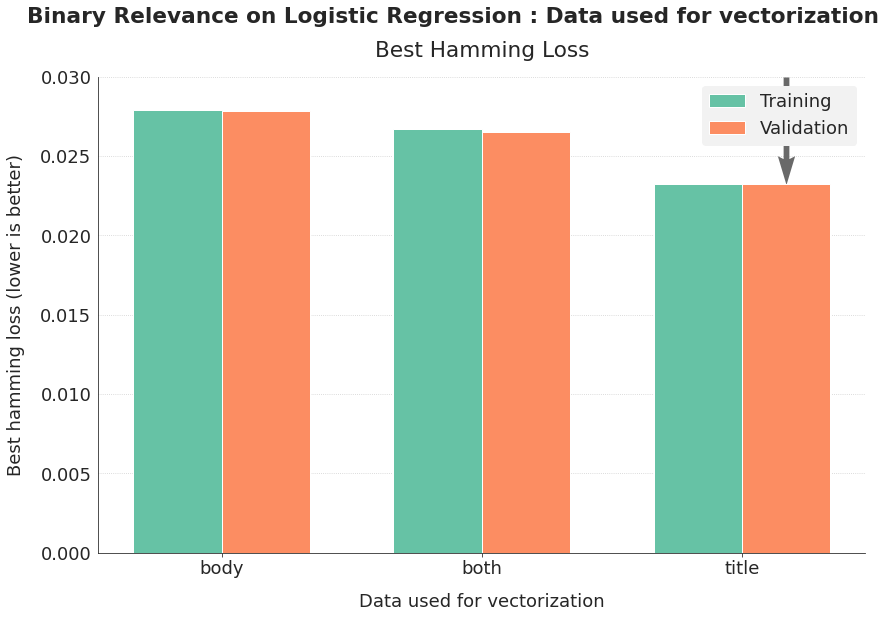

In [ ]:
fig, ax = graph_analysis(semi_binary_logistic,
                         "data", "Data used for vectorization",
                         "Binary Relevance on Logistic Regression",
                         isbar=True, ymax=0.03, show_time=False)

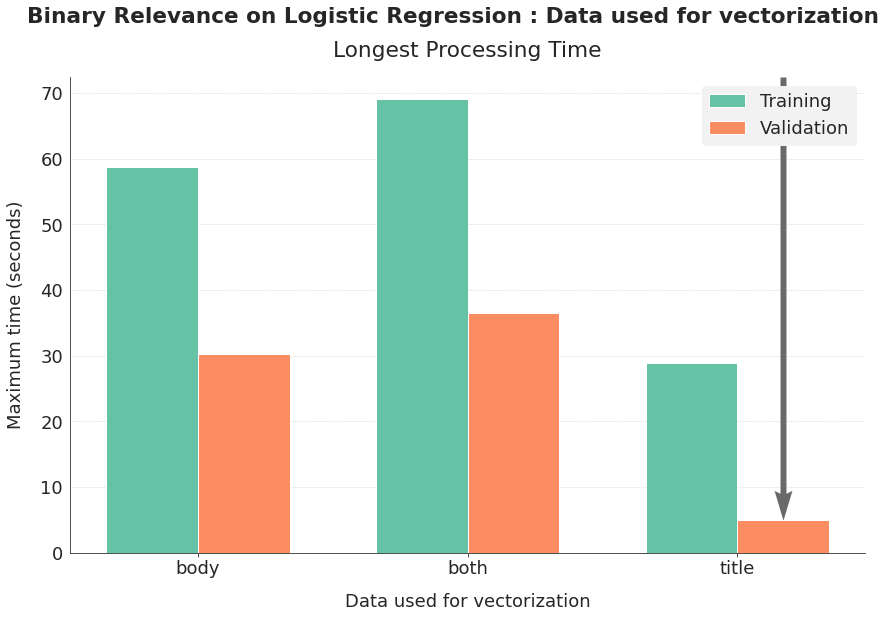

In [ ]:
fig, ax = graph_analysis(semi_binary_logistic,
                         "data", "Data used for vectorization",
                         "Binary Relevance on Logistic Regression",
                         isbar=True, show_time=True)

Best and quickest results are based on the title analysis.

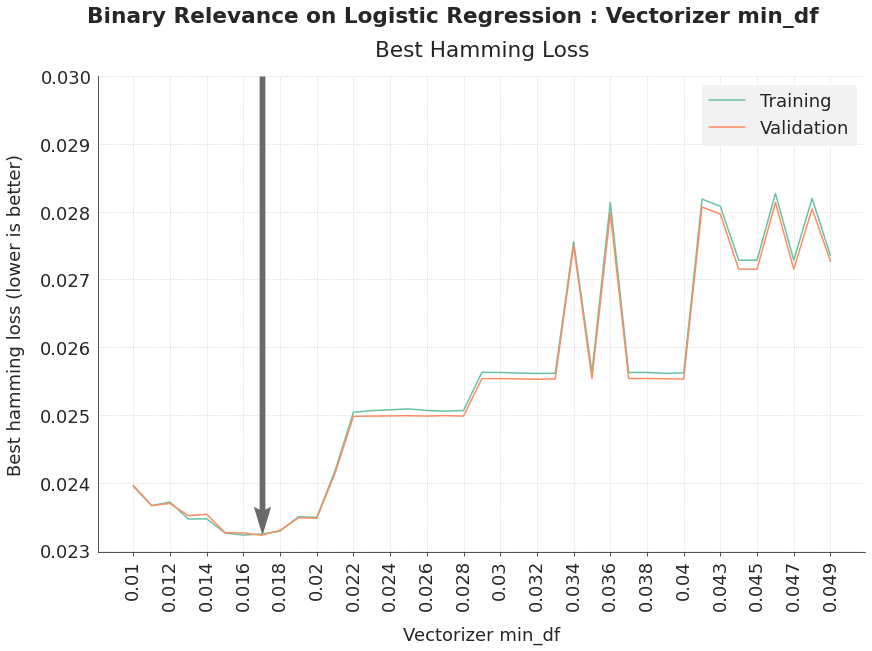

In [ ]:
fig, ax = graph_analysis(semi_binary_logistic,
                         "bow_mindf", "Vectorizer min_df",
                         "Binary Relevance on Logistic Regression",
                         ymax=0.03, tick_step=2, rotation=90, show_time=False)

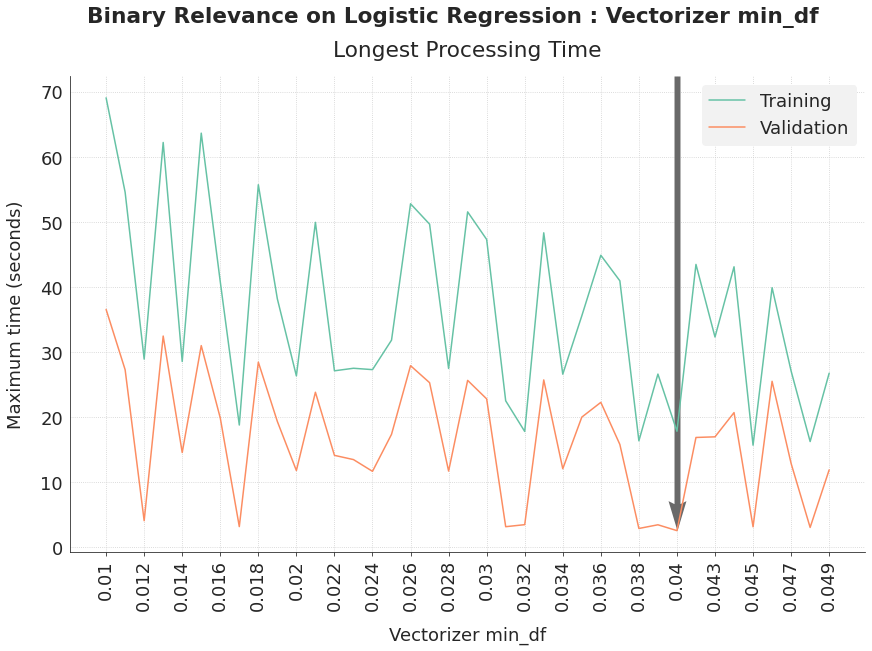

In [ ]:
fig, ax = graph_analysis(semi_binary_logistic,
                         "bow_mindf", "Vectorizer min_df",
                         "Binary Relevance on Logistic Regression",
                         ymax=0.03, tick_step=2, rotation=90, show_time=True)

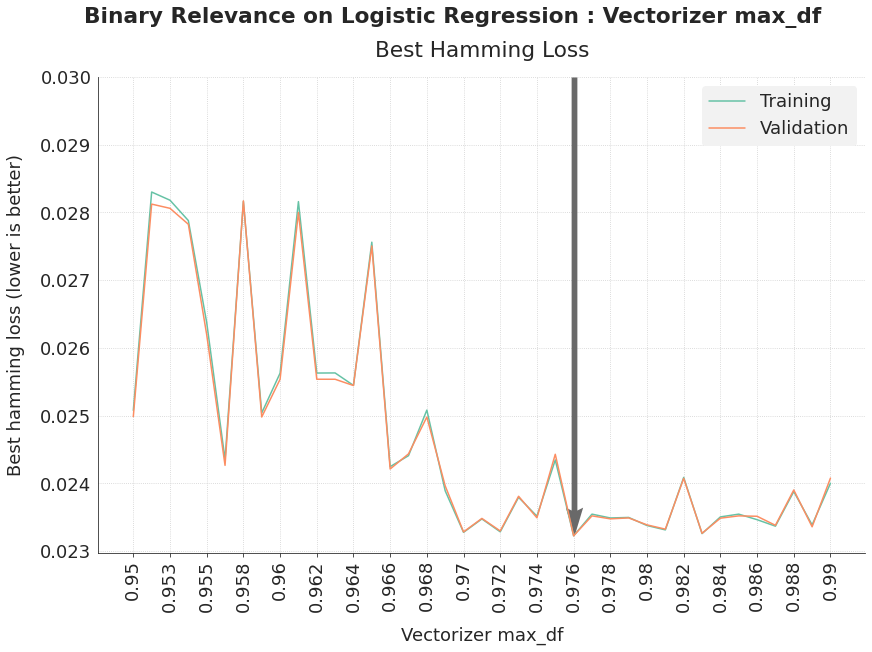

In [ ]:
fig, ax = graph_analysis(semi_binary_logistic,
                         "bow_maxdf", "Vectorizer max_df",
                         "Binary Relevance on Logistic Regression",
                         ymax=0.03, tick_step=2, rotation=90, show_time=False)

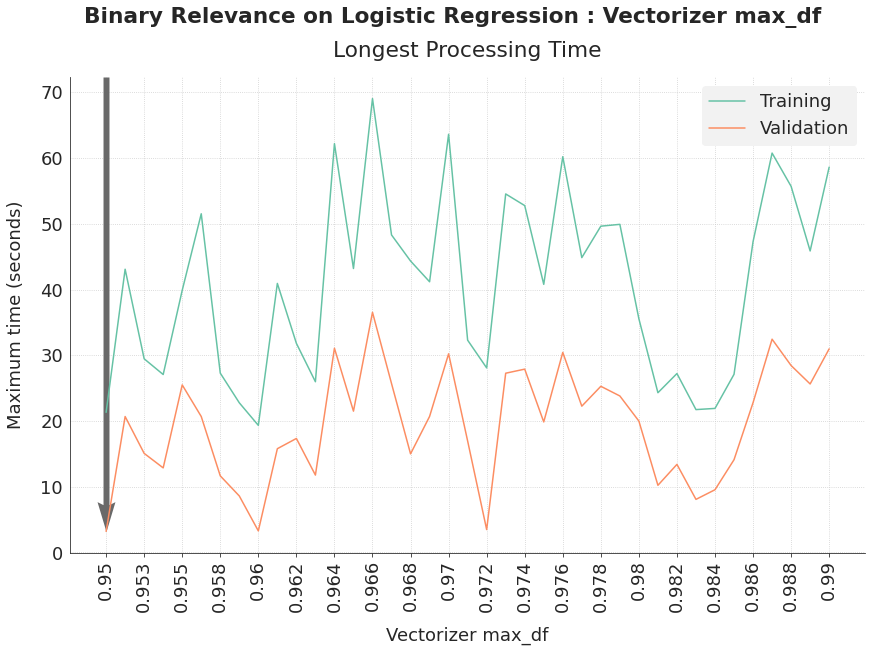

In [ ]:
fig, ax = graph_analysis(semi_binary_logistic,
                         "bow_maxdf", "Vectorizer max_df",
                         "Binary Relevance on Logistic Regression",
                         ymax=0.03, tick_step=2, rotation=90, show_time=True)

Processing time doesn't depend on min_df and max_df.  
Best results are get with a min_df around 0.017, and a large max_df (over 0.97 with a maximum reached at 0.976).

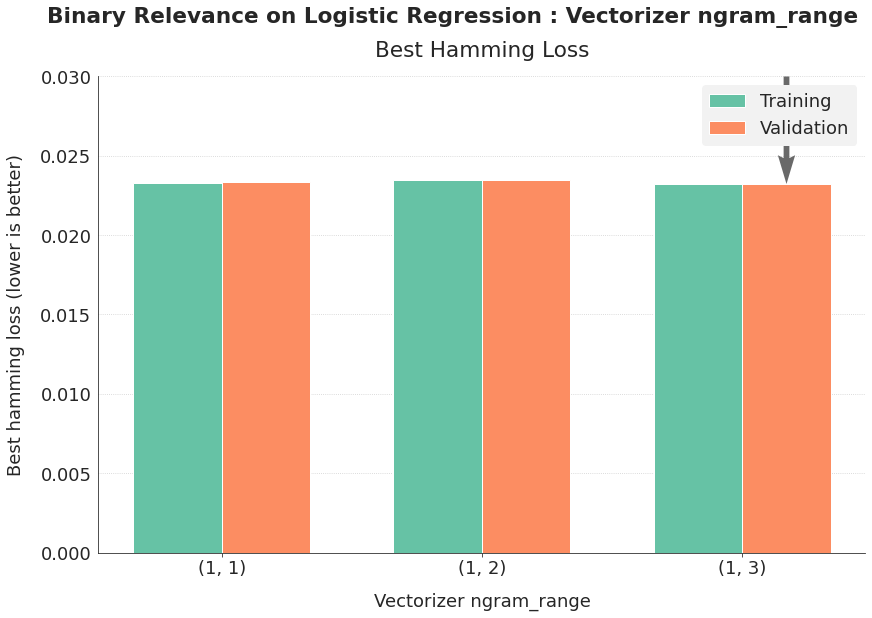

In [ ]:
fig, ax = graph_analysis(semi_binary_logistic,
                         "bow_ngrams", "Vectorizer ngram_range",
                         "Binary Relevance on Logistic Regression",
                         ymax=0.03, isbar=True, show_time=False)

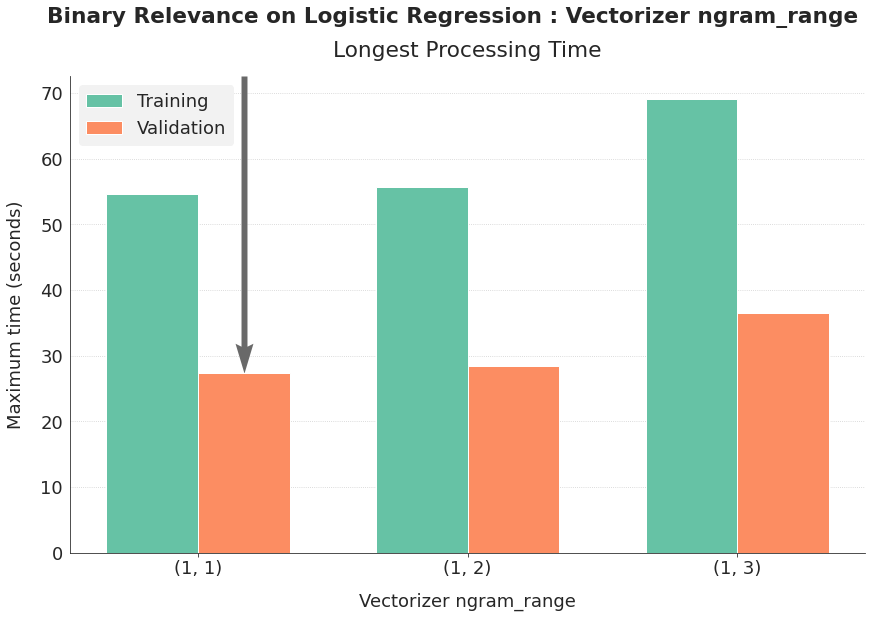

In [ ]:
fig, ax = graph_analysis(semi_binary_logistic,
                         "bow_ngrams", "Vectorizer ngram_range",
                         "Binary Relevance on Logistic Regression",
                         ymax=0.03, isbar=True, show_time=True)

Performance is almost the same with the different tested ngrams strategies. The processing time is longer when adding bigrams and trigrams, but nothing dramatic.

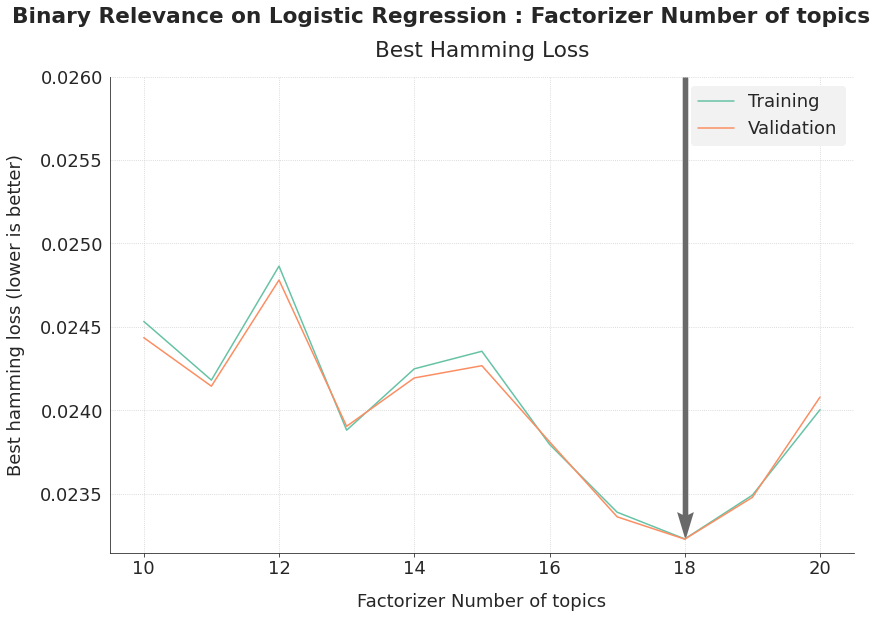

In [ ]:
fig, ax = graph_analysis(semi_binary_logistic,
                         "factorizer_ntopics", "Factorizer Number of topics",
                         "Binary Relevance on Logistic Regression",
                         ymax=0.026, tick_step=2, show_time=False)

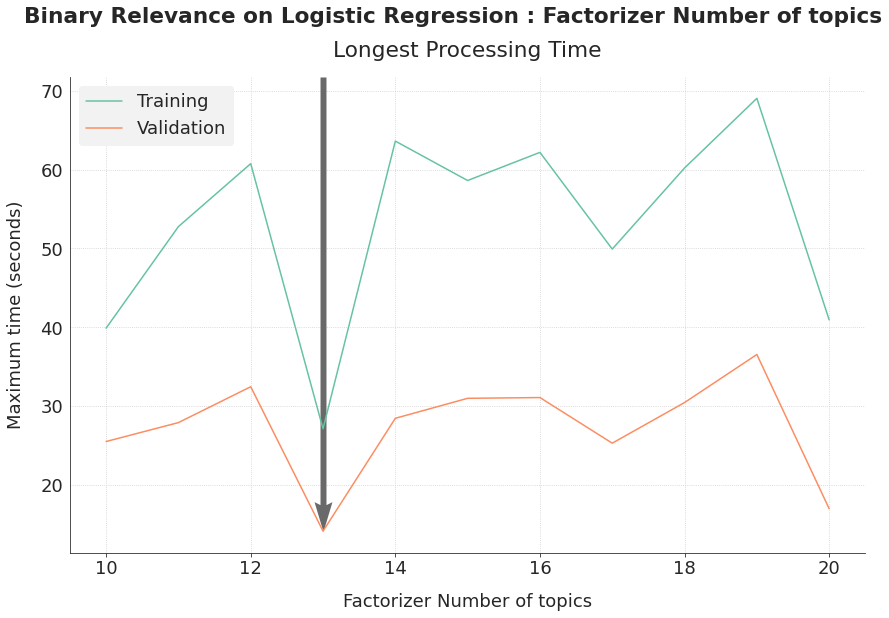

In [ ]:
fig, ax = graph_analysis(semi_binary_logistic,
                         "factorizer_ntopics", "Factorizer Number of topics",
                         "Binary Relevance on Logistic Regression",
                         ymax=0.03, tick_step=2, show_time=True)

18 topics get the best performance. We should test more topics if we opt for this model.  
Time processing may increase with the number of topics.

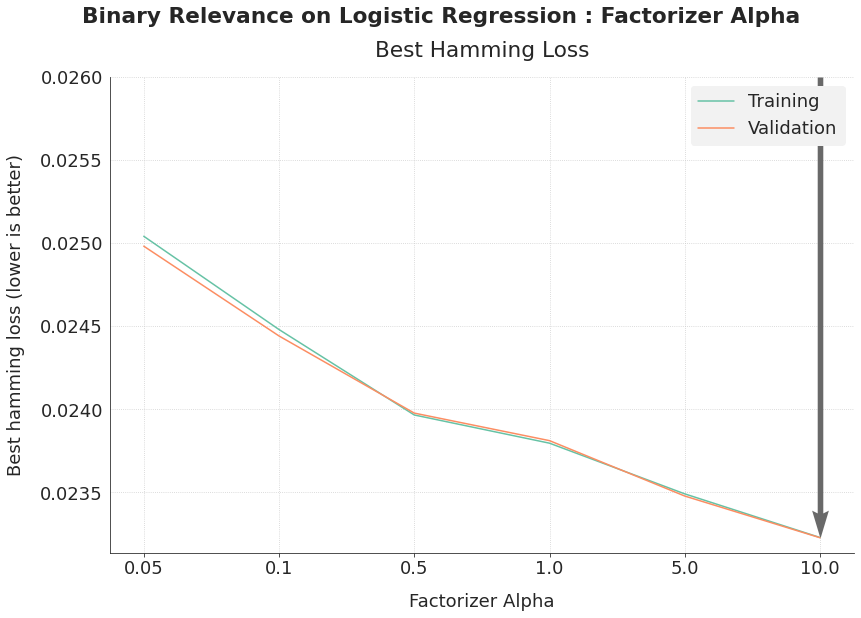

In [ ]:
fig, ax = graph_analysis(semi_binary_logistic,
                         "factorizer_alpha", "Factorizer Alpha",
                         "Binary Relevance on Logistic Regression",
                         ymax=0.026, show_time=False)

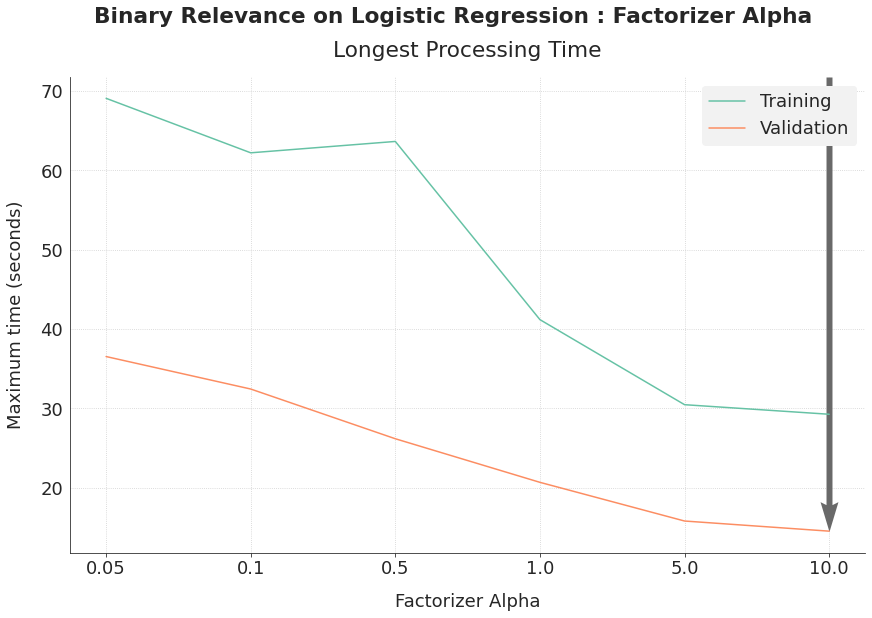

In [ ]:
fig, ax = graph_analysis(semi_binary_logistic,
                         "factorizer_alpha", "Factorizer Alpha",
                         "Binary Relevance on Logistic Regression",
                         ymax=0.03, show_time=True)

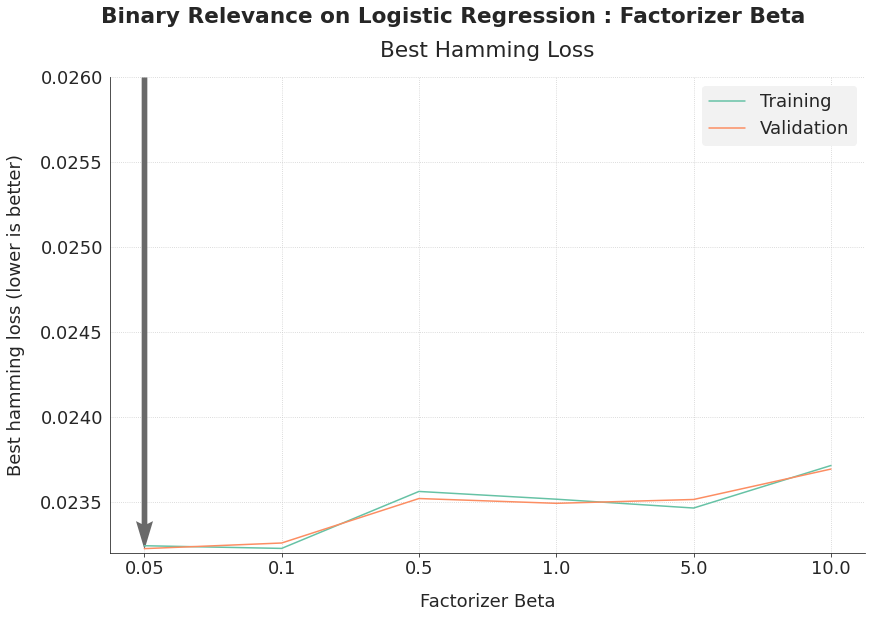

In [ ]:
fig, ax = graph_analysis(semi_binary_logistic,
                         "factorizer_beta", "Factorizer Beta",
                         "Binary Relevance on Logistic Regression",
                         ymax=0.026, show_time=False)

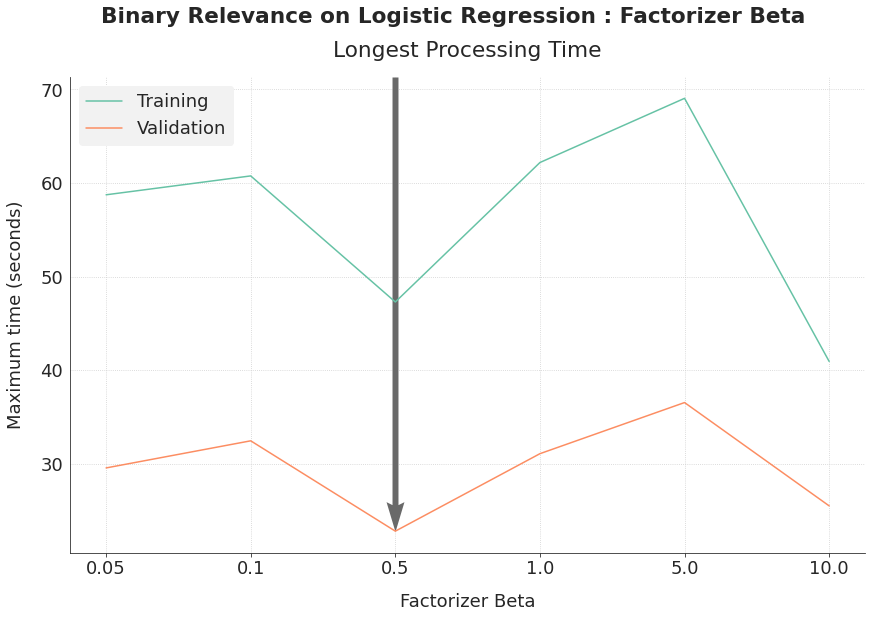

In [ ]:
fig, ax = graph_analysis(semi_binary_logistic,
                         "factorizer_beta", "Factorizer Beta",
                         "Binary Relevance on Logistic Regression",
                         ymax=0.03, show_time=True)

Large alpha and small beta get the best performance. We should check the results for larger and smaller alpha and beta settings.  
Time processing decreases wile alpha increases and seems uncorrelated to beta.

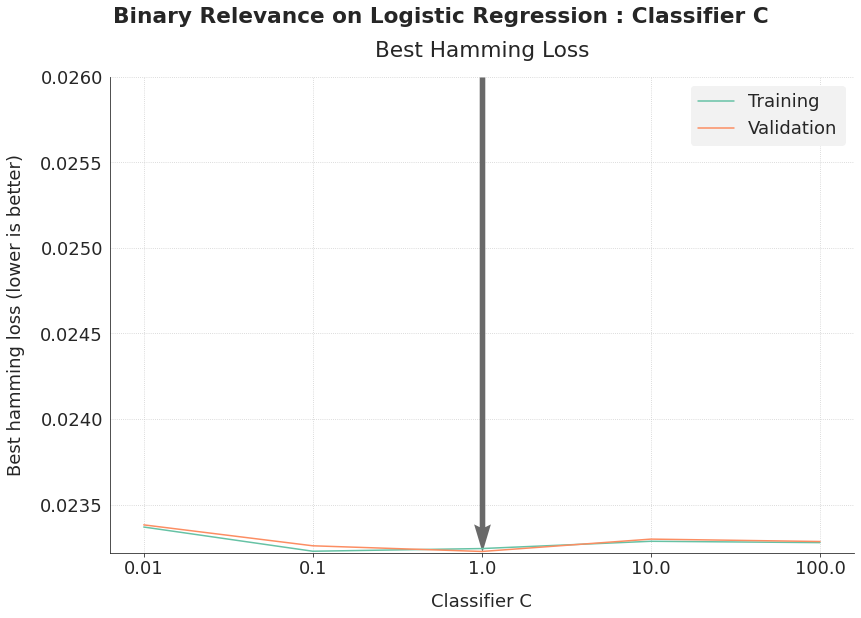

In [ ]:
fig, ax = graph_analysis(semi_binary_logistic,
                         "clf_C", "Classifier C",
                         "Binary Relevance on Logistic Regression",
                         ymax=0.026, show_time=False)

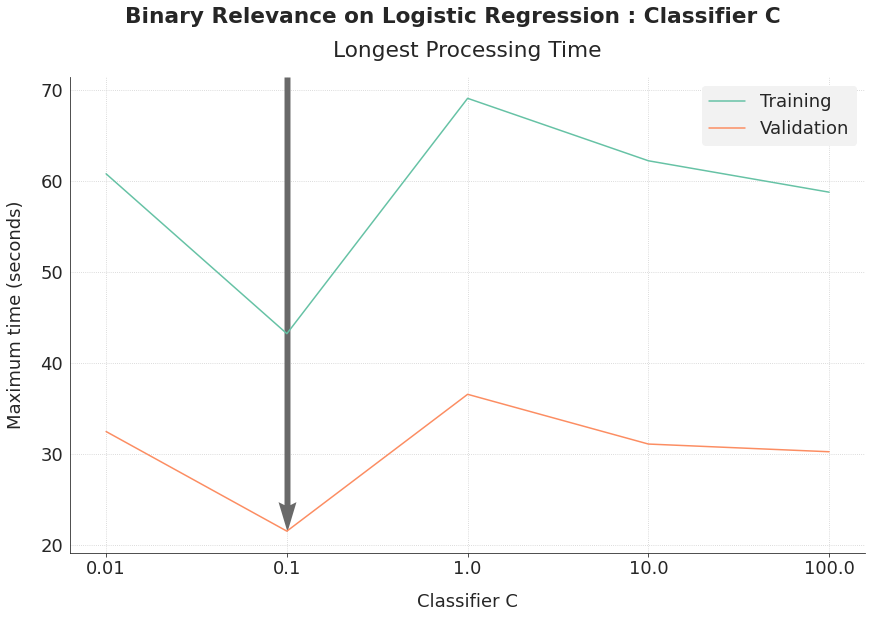

In [ ]:
fig, ax = graph_analysis(semi_binary_logistic,
                         "clf_C", "Classifier C",
                         "Binary Relevance on Logistic Regression",
                         ymax=0.03, show_time=True)

A value of 1 for C gets the best results.

In conclusion, the more impacting hyperparameter on time processing is the used data. It is better for performance and time processing to use the title.  
I look at the performance measures of the optimal settings for the Binary Relevance on Logistic Regression.

In [ ]:
clf_pipeline.set_params(**{
    "vectorizer__ngram_range": (1, 3),
    "vectorizer__min_df": 0.017,
    "vectorizer__max_df": 0.976,
    "factorizer__n_components" : 18,
    "factorizer__doc_topic_prior": 10,
    "factorizer__topic_word_prior": 0.05,
    "classifier": BinaryRelevance(),
    "classifier__classifier": LogisticRegression(n_jobs=-1),
    "classifier__classifier__C": 1})

Pipeline(memory=None,
         steps=[('vectorizer',
                 CountVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.int64'>, encoding='utf-8',
                                 input='content', lowercase=True, max_df=0.976,
                                 max_features=None, min_df=0.017,
                                 ngram_range=(1, 3), preprocessor=None,
                                 stop_words=['i', 'me', 'my', 'myself', 'we',
                                             'our', 'ours', 'ourselves', 'you',
                                             "you're", "you'v...
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('classifier',
                 BinaryRelevance(classifier=LogisticRegression(C=1,
                                                               class_weight=None,
                                                 

In [ ]:
clf_pipeline.fit(X_mini.title, y_mini)
predict_train = clf_pipeline.predict(X_mini.title)
predict_valid = clf_pipeline.predict(X_valid.title)

In [ ]:
train_hamming = hamming_loss(y_mini, predict_train)
valid_hamming = hamming_loss(y_valid, predict_valid)
train_accuracy = accuracy_score(y_mini, predict_train)
valid_accuracy = accuracy_score(y_valid, predict_valid)
train_f1_micro = f1_score(y_mini, predict_train, average="micro")
valid_f1_micro = f1_score(y_valid, predict_valid, average="micro")
train_f1_macro = f1_score(y_mini, predict_train, average="macro")
valid_f1_macro = f1_score(y_valid, predict_valid, average="macro")
train_f1_macroweighted = f1_score(y_mini, predict_train, average="weighted")
valid_f1_macroweighted = f1_score(y_valid, predict_valid, average="weighted")

In [ ]:
print("Training scores :")
print("Hamming loss = {:.4f}".format(train_hamming))
print("Accuracy score = {:.2%}".format(train_accuracy))
print("F1 micro score (overall calculation) = {:.2%}".format(train_f1_micro))
print("F1 macro score (average of f1 score for each label) = {:.2%}".format(train_f1_macro))
print("F1 macro weighted score (weighted average of f1 score for each label) = {:.2%}".format(train_f1_macroweighted))


Training scores :
Hamming loss = 0.0234
Accuracy score = 17.48%
F1 micro score (overall calculation) = 30.96%
F1 macro score (average of f1 score for each label) = 11.49%
F1 macro weighted score (weighted average of f1 score for each label) = 26.23%


In [ ]:
print("Validation scores :")
print("Hamming loss = {:.4f}".format(valid_hamming))
print("Accuracy score = {:.2%}".format(valid_accuracy))
print("F1 micro score (overall calculation) = {:.2%}".format(valid_f1_micro))
print("F1 macro score (average of f1 score for each label) = {:.2%}".format(valid_f1_macro))
print("F1 macro weighted score (weighted average of f1 score for each label) = {:.2%}".format(valid_f1_macroweighted))

Validation scores :
Hamming loss = 0.0234
Accuracy score = 16.96%
F1 micro score (overall calculation) = 30.36%
F1 macro score (average of f1 score for each label) = 11.20%
F1 macro weighted score (weighted average of f1 score for each label) = 25.79%


<a id="3_2"></a>

### 3.2. Classifier chains

In [ ]:
space_semisupervised = {
    "data" : hp.choice("data", ["body", "title", "both"]),
    "vectorizer__ngram_range": hp.choice("ngram_range",
                                         [(1, 1), (1, 2), (1, 3)]),
    "vectorizer__min_df": hp.uniform("min_df", 0.01, 0.05),
    "vectorizer__max_df": hp.uniform("max_df", 0.95, 0.99),
    "factorizer__n_components" : hp.choice("n_components",
                                           np.arange(10, 21, 1, dtype=int)),
    "factorizer__doc_topic_prior": hp.choice("alpha",
                                             [0.05, 0.1, 0.5, 1, 5, 10]),
    "factorizer__topic_word_prior": hp.choice("beta",
                                              [0.05, 0.1, 0.5, 1, 5, 10]),
    "classifier": ClassifierChain(),
    "classifier__classifier": LogisticRegression(n_jobs=-1),
    "classifier__classifier__C": hp.choice("C", [0.01, 0.1, 1, 10, 100])}

In [ ]:
semi_file = "hyperopt_semi_chain_logistic.csv"
run_semisupervised(semi_file, max_evals=200)

100%|██████████| 200/200 [2:30:02<00:00, 45.01s/it, best loss: 0.022423835055414003]
Hyperparameters optimization done
Best coherence score = 0.022423835055414003
Fit time = 36.961547174998486
Test time = 3.24311422899882
Best coherence score obtained after 175 iterations



In [ ]:
semi_chain_logistic = get_semi_logistic("hyperopt_semi_chain_logistic.csv")
semi_chain_logistic.head()

,validation_hamming_loss,training_hamming_loss,fit_time,test_time,iteration,data,bow_maxdf,bow_mindf,bow_ngrams,factorizer_ntopics,factorizer_alpha,factorizer_beta,clf,clf_C
0,0.028392,0.028553,46.698590,15.433184,1,body,0.953,0.035,"(1, 2)",20,1.00,0.05,LogisticRegression,1.00
1,0.025553,0.025628,41.386089,3.975470,2,title,0.987,0.039,"(1, 3)",17,0.50,10.00,LogisticRegression,10.00
2,0.027986,0.028144,25.403671,12.251201,3,body,0.974,0.036,"(1, 3)",10,10.00,5.00,LogisticRegression,0.01
3,0.028051,0.028105,41.277287,13.349149,4,body,0.954,0.047,"(1, 1)",15,1.00,0.10,LogisticRegression,1.00
4,0.028564,0.028754,59.944276,23.901649,5,body,0.989,0.029,"(1, 2)",16,0.05,1.00,LogisticRegression,1.00


In [ ]:
semi_chain_logistic.sort_values(by=["validation_hamming_loss",
                                    "test_time"]).head()

,validation_hamming_loss,training_hamming_loss,fit_time,test_time,iteration,data,bow_maxdf,bow_mindf,bow_ngrams,factorizer_ntopics,factorizer_alpha,factorizer_beta,clf,clf_C
174,0.022424,0.022469,36.961547,3.243114,175,title,0.951,0.012,"(1, 1)",20,10.0,1.0,LogisticRegression,1.0
157,0.022637,0.022716,35.094475,3.171858,158,title,0.952,0.012,"(1, 1)",18,10.0,1.0,LogisticRegression,1.0
155,0.022637,0.022716,35.094191,3.188514,156,title,0.952,0.012,"(1, 1)",18,10.0,1.0,LogisticRegression,1.0
154,0.022637,0.022716,34.111475,3.211536,155,title,0.951,0.012,"(1, 1)",18,10.0,1.0,LogisticRegression,1.0
156,0.022637,0.022716,34.415665,3.222689,157,title,0.952,0.012,"(1, 1)",18,10.0,1.0,LogisticRegression,1.0


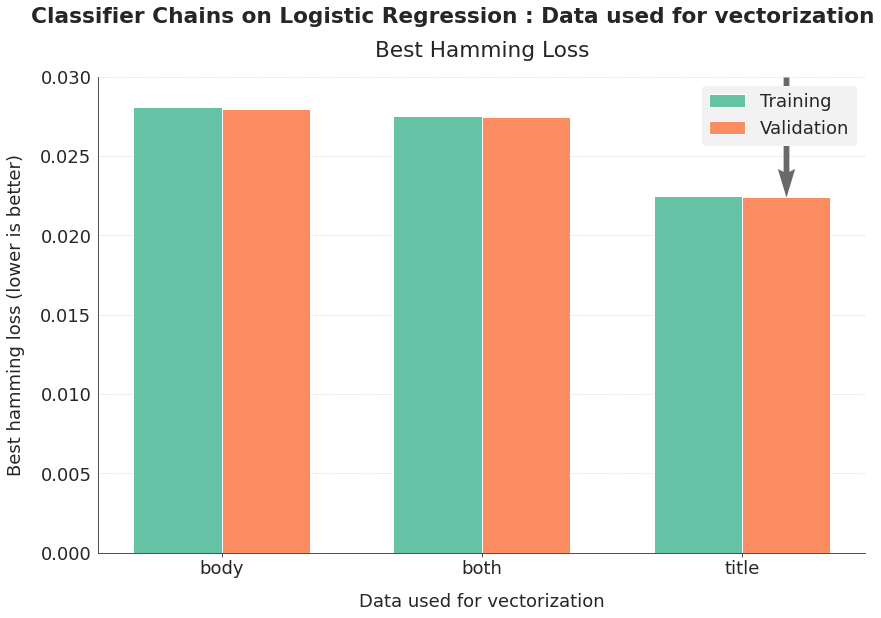

In [ ]:
fig, ax = graph_analysis(semi_chain_logistic,
                         "data", "Data used for vectorization",
                         "Classifier Chains on Logistic Regression",
                         isbar=True, ymax=0.03, show_time=False)

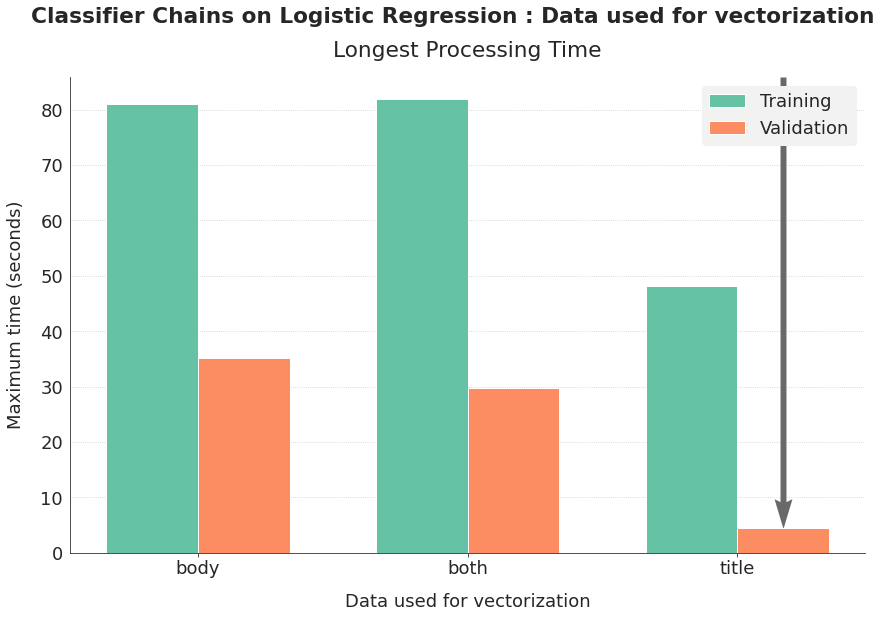

In [ ]:
fig, ax = graph_analysis(semi_chain_logistic,
                         "data", "Data used for vectorization",
                         "Classifier Chains on Logistic Regression",
                         isbar=True, show_time=True)

Best and quickest results are based on the title analysis.

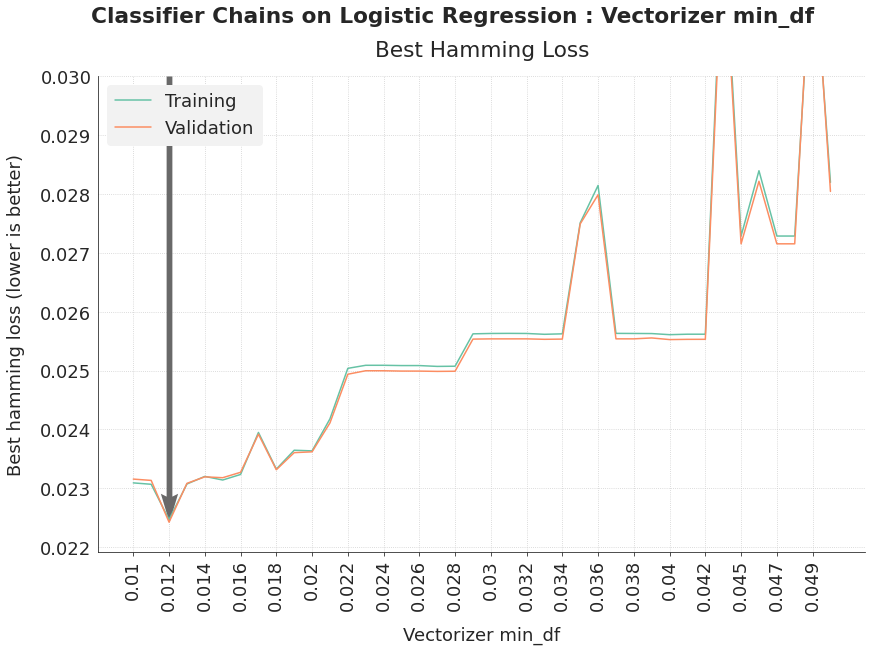

In [ ]:
fig, ax = graph_analysis(semi_chain_logistic,
                         "bow_mindf", "Vectorizer min_df",
                         "Classifier Chains on Logistic Regression",
                         ymax=0.03, tick_step=2, rotation=90, show_time=False)

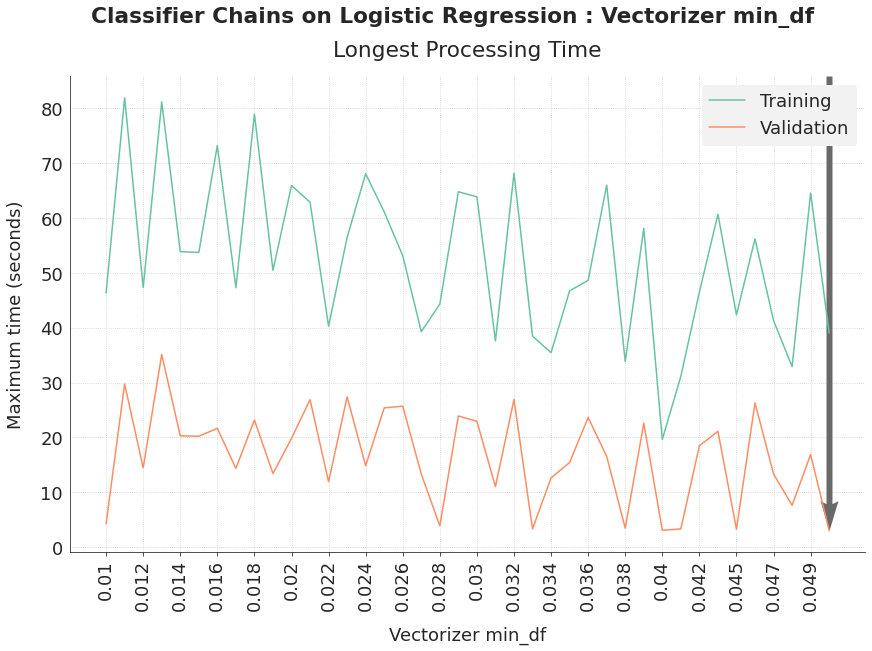

In [ ]:
fig, ax = graph_analysis(semi_chain_logistic,
                         "bow_mindf", "Vectorizer min_df",
                         "Classifier Chains on Logistic Regression",
                         ymax=0.03, tick_step=2, rotation=90, show_time=True)

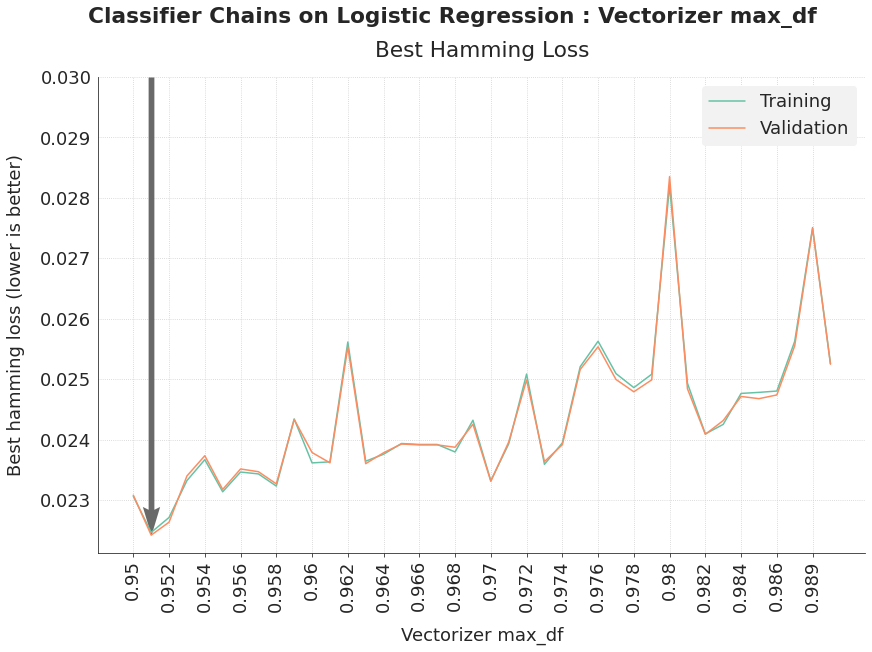

In [ ]:
fig, ax = graph_analysis(semi_chain_logistic,
                         "bow_maxdf", "Vectorizer max_df",
                         "Classifier Chains on Logistic Regression",
                         ymax=0.03, tick_step=2, rotation=90, show_time=False)

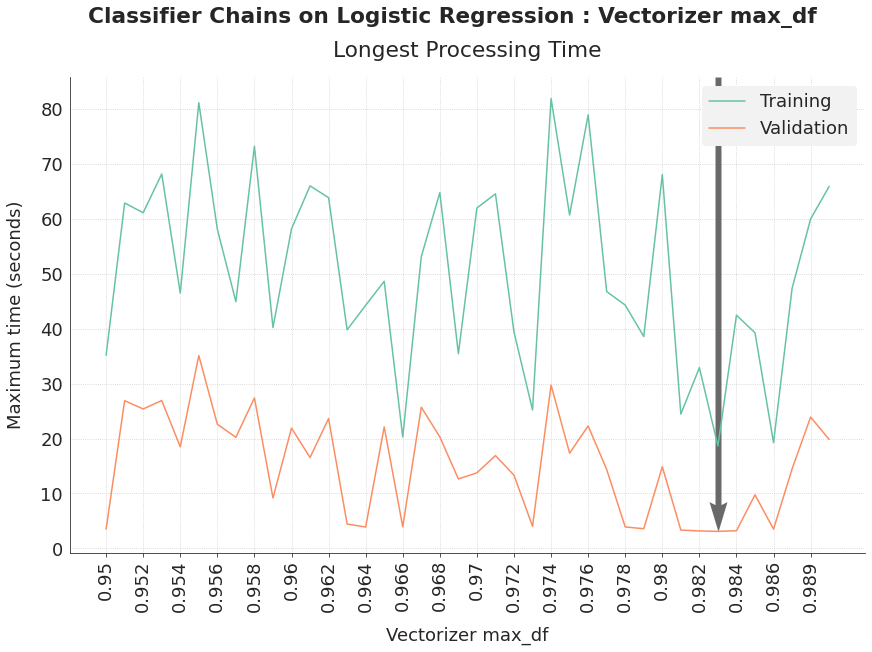

In [ ]:
fig, ax = graph_analysis(semi_chain_logistic,
                         "bow_maxdf", "Vectorizer max_df",
                         "Classifier Chains on Logistic Regression",
                         ymax=0.03, tick_step=2, rotation=90, show_time=True)

Processing time doesn't depend on min_df and max_df.  
Best results are get with a min_df around 0.012 and a max_df around 0.951.

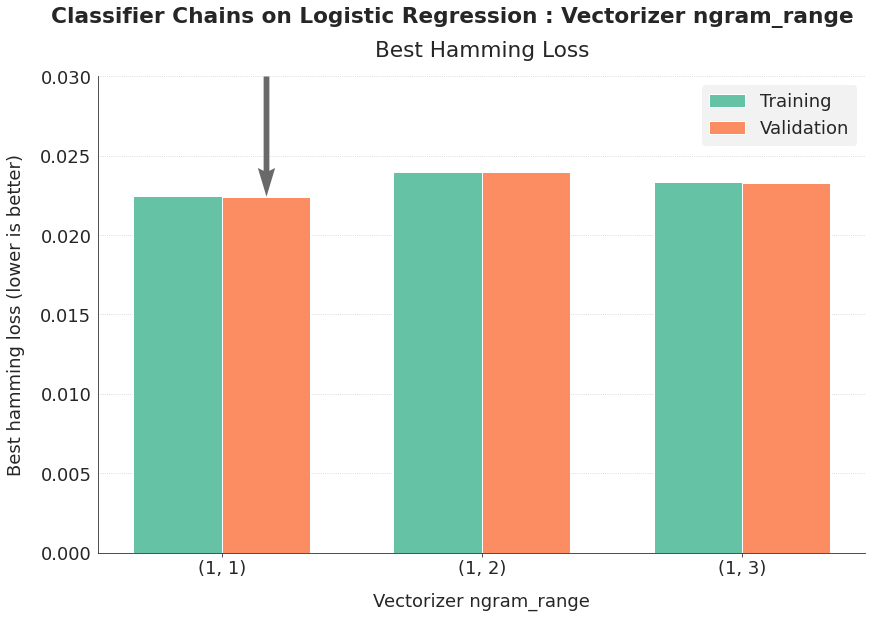

In [ ]:
fig, ax = graph_analysis(semi_chain_logistic,
                         "bow_ngrams", "Vectorizer ngram_range",
                         "Classifier Chains on Logistic Regression",
                         ymax=0.03, isbar=True, show_time=False)

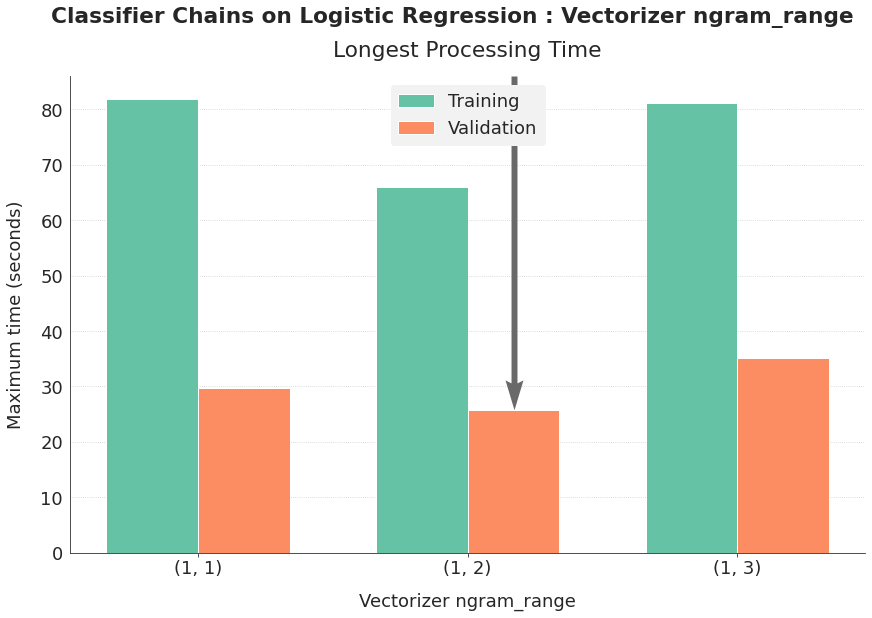

In [ ]:
fig, ax = graph_analysis(semi_chain_logistic,
                         "bow_ngrams", "Vectorizer ngram_range",
                         "Classifier Chains on Logistic Regression",
                         ymax=0.03, isbar=True, show_time=True)

Performance is sligthly better when adding bigrams to the bag of words.

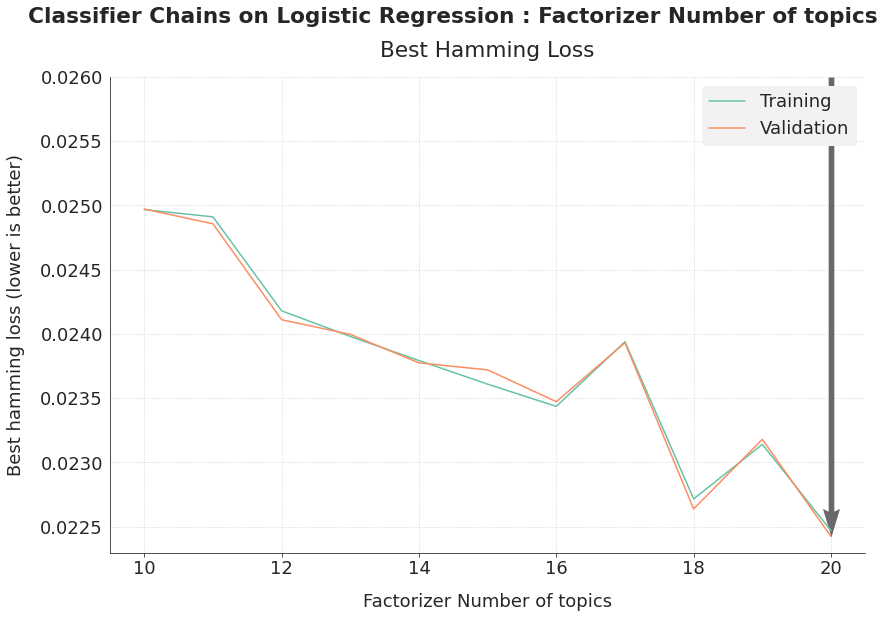

In [ ]:
fig, ax = graph_analysis(semi_chain_logistic,
                         "factorizer_ntopics", "Factorizer Number of topics",
                         "Classifier Chains on Logistic Regression",
                         ymax=0.026, tick_step=2, show_time=False)

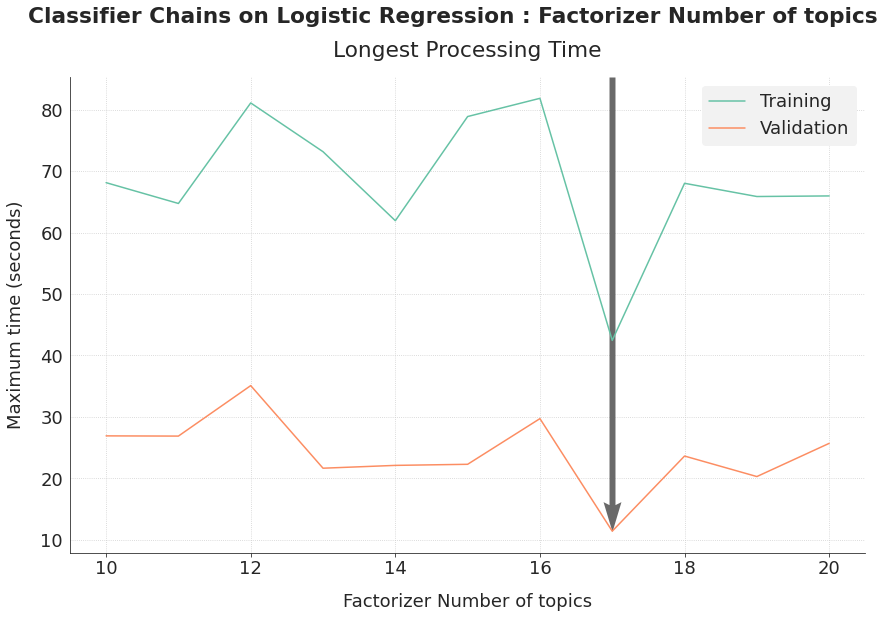

In [ ]:
fig, ax = graph_analysis(semi_chain_logistic,
                         "factorizer_ntopics", "Factorizer Number of topics",
                         "Classifier Chains on Logistic Regression",
                         ymax=0.03, tick_step=2, show_time=True)

A number of 20 topics gets the best performance. We should test more topics if we opt for this model.  
Time processing doesn't seem related to the number of topics.

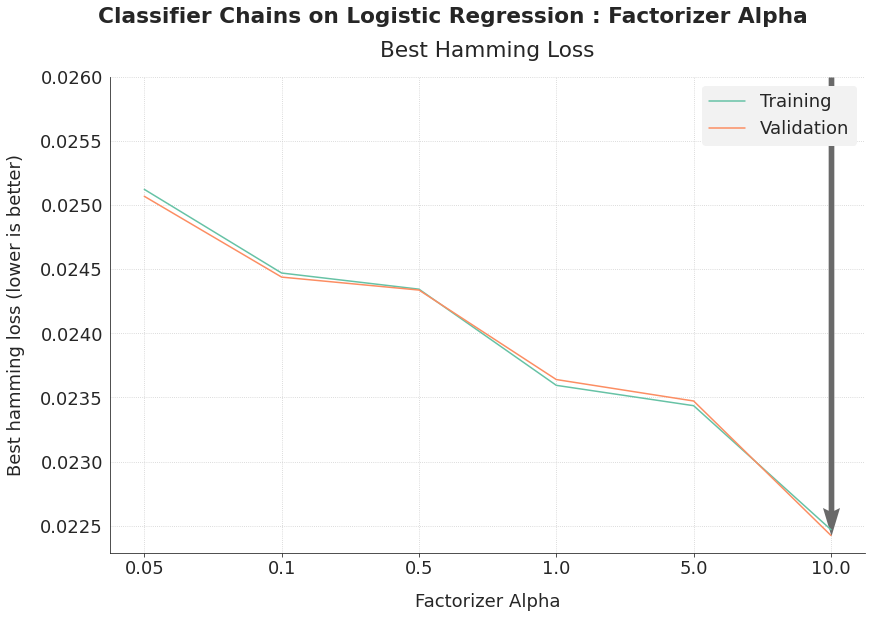

In [ ]:
fig, ax = graph_analysis(semi_chain_logistic,
                         "factorizer_alpha", "Factorizer Alpha",
                         "Classifier Chains on Logistic Regression",
                         ymax=0.026, show_time=False)

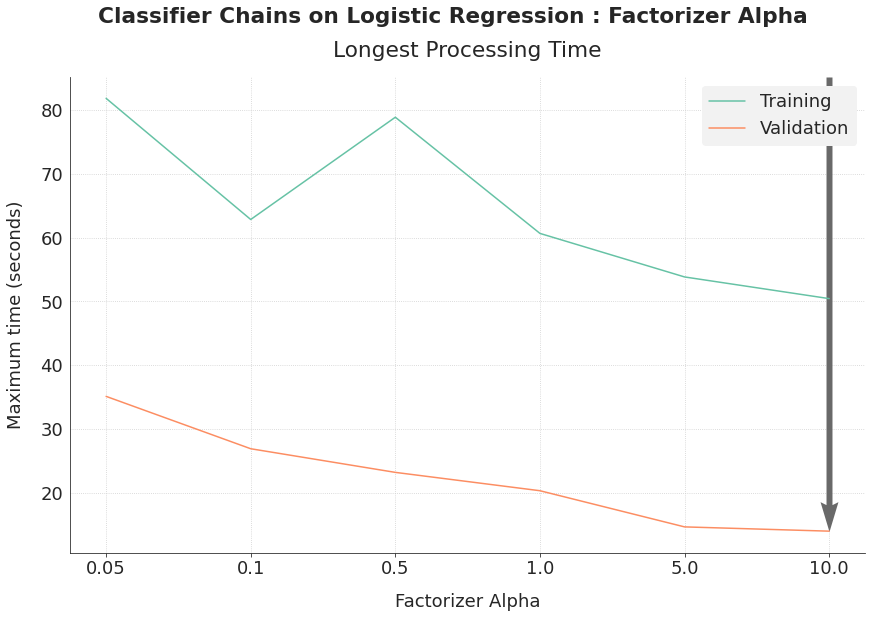

In [ ]:
fig, ax = graph_analysis(semi_chain_logistic,
                         "factorizer_alpha", "Factorizer Alpha",
                         "Classifier Chains on Logistic Regression",
                         ymax=0.03, show_time=True)

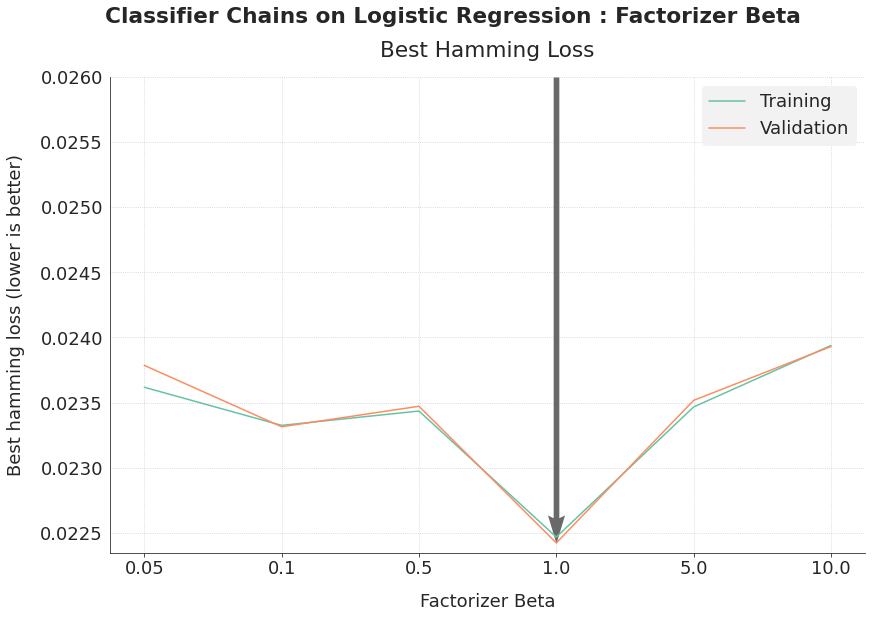

In [ ]:
fig, ax = graph_analysis(semi_chain_logistic,
                         "factorizer_beta", "Factorizer Beta",
                         "Classifier Chains on Logistic Regression",
                         ymax=0.026, show_time=False)

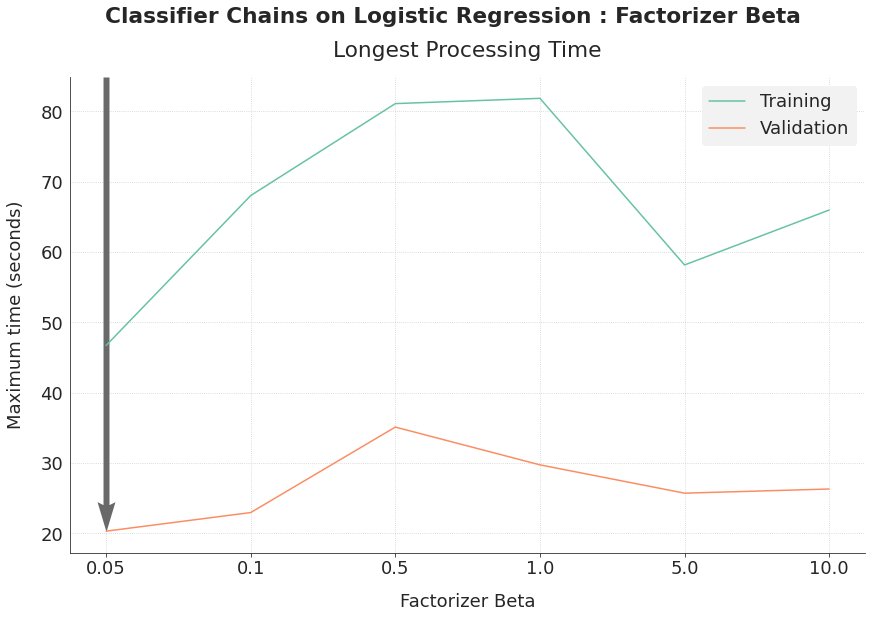

In [ ]:
fig, ax = graph_analysis(semi_chain_logistic,
                         "factorizer_beta", "Factorizer Beta",
                         "Classifier Chains on Logistic Regression",
                         ymax=0.03, show_time=True)

An alpha of 10 and a beta of 1 get the best performance.  
Time processing decreases wile alpha increases and seems uncorrelated to beta.

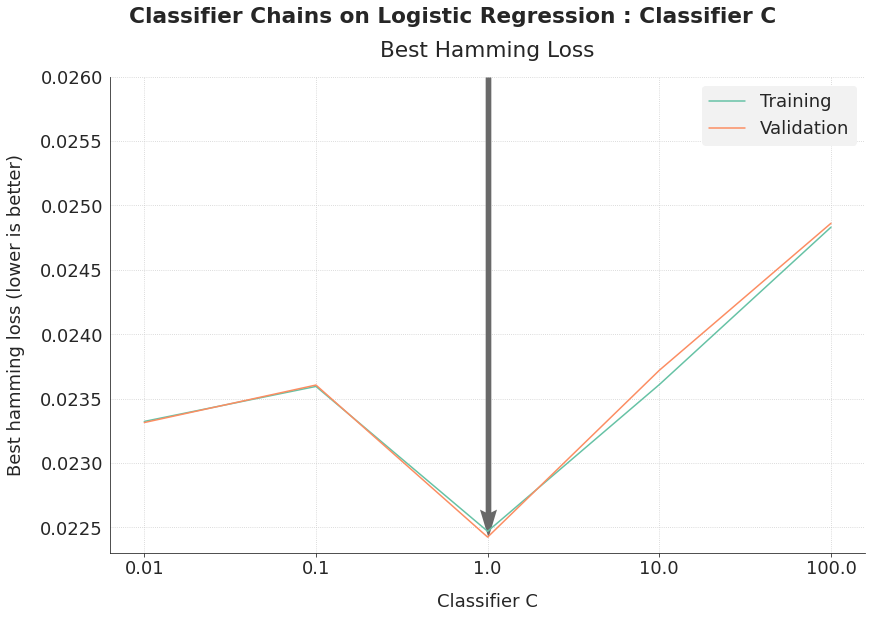

In [ ]:
fig, ax = graph_analysis(semi_chain_logistic,
                         "clf_C", "Classifier C",
                         "Classifier Chains on Logistic Regression",
                         ymax=0.026, show_time=False)

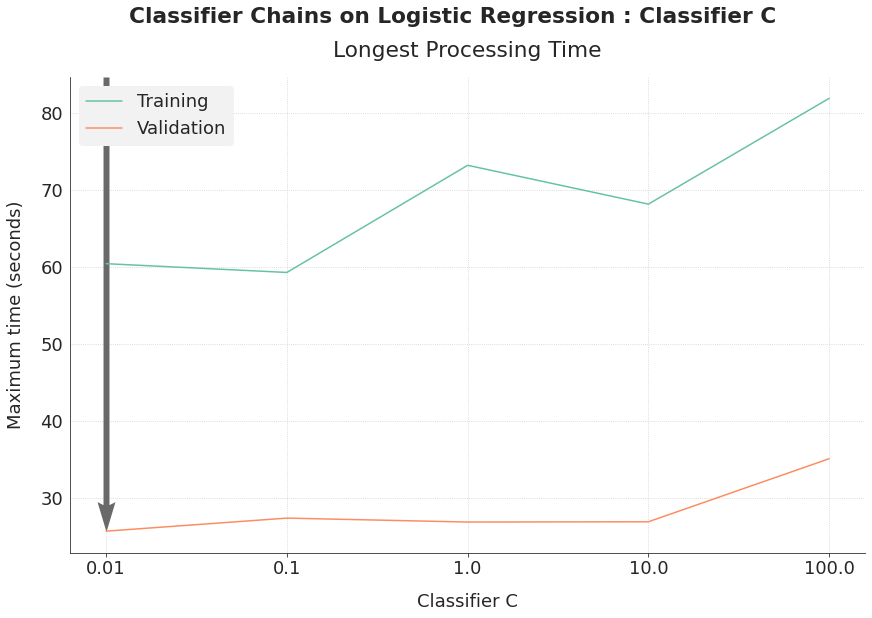

In [ ]:
fig, ax = graph_analysis(semi_chain_logistic,
                         "clf_C", "Classifier C",
                         "Classifier Chains on Logistic Regression",
                         ymax=0.03, show_time=True)

I choose a value of 1 for C to get the best performance.

In conclusion, the more impacting hyperparameter on time processing is the used data. It is better for performance and time processing to use the title. Using only the bag of words leads to a better performance.  
I look at the performance measures of the best settings of Classifier Chains on Logistic Regression.

In [ ]:
clf_pipeline.set_params(**{
    "vectorizer__ngram_range": (1, 1),
    "vectorizer__min_df": 0.012,
    "vectorizer__max_df": 0.951,
    "factorizer__n_components" : 20,
    "factorizer__doc_topic_prior": 10,
    "factorizer__topic_word_prior": 1,
    "classifier": ClassifierChain(),
    "classifier__classifier": LogisticRegression(n_jobs=-1),
    "classifier__classifier__C": 1})

Pipeline(memory=None,
         steps=[('vectorizer',
                 CountVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.int64'>, encoding='utf-8',
                                 input='content', lowercase=True, max_df=0.951,
                                 max_features=None, min_df=0.012,
                                 ngram_range=(1, 1), preprocessor=None,
                                 stop_words=['i', 'me', 'my', 'myself', 'we',
                                             'our', 'ours', 'ourselves', 'you',
                                             "you're", "you'v...
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('classifier',
                 ClassifierChain(classifier=LogisticRegression(C=1,
                                                               class_weight=None,
                                                 

In [ ]:
clf_pipeline.fit(X_mini.title, y_mini)
predict_train = clf_pipeline.predict(X_mini.title)
predict_valid = clf_pipeline.predict(X_valid.title)

In [ ]:
train_hamming = hamming_loss(y_mini, predict_train)
valid_hamming = hamming_loss(y_valid, predict_valid)
train_accuracy = accuracy_score(y_mini, predict_train)
valid_accuracy = accuracy_score(y_valid, predict_valid)
train_f1_micro = f1_score(y_mini, predict_train, average="micro")
valid_f1_micro = f1_score(y_valid, predict_valid, average="micro")
train_f1_macro = f1_score(y_mini, predict_train, average="macro")
valid_f1_macro = f1_score(y_valid, predict_valid, average="macro")
train_f1_macroweighted = f1_score(y_mini, predict_train, average="weighted")
valid_f1_macroweighted = f1_score(y_valid, predict_valid, average="weighted")

In [ ]:
print("Training scores :")
print("Hamming loss = {:.4f}".format(train_hamming))
print("Accuracy score = {:.2%}".format(train_accuracy))
print("F1 micro score (overall calculation) = {:.2%}".format(train_f1_micro))
print("F1 macro score (average of f1 score for each label) = {:.2%}".format(train_f1_macro))
print("F1 macro weighted score (weighted average of f1 score for each label) = {:.2%}".format(train_f1_macroweighted))


Training scores :
Hamming loss = 0.0225
Accuracy score = 21.22%
F1 micro score (overall calculation) = 37.80%
F1 macro score (average of f1 score for each label) = 21.10%
F1 macro weighted score (weighted average of f1 score for each label) = 33.55%


In [ ]:
print("Validation scores :")
print("Hamming loss = {:.4f}".format(valid_hamming))
print("Accuracy score = {:.2%}".format(valid_accuracy))
print("F1 micro score (overall calculation) = {:.2%}".format(valid_f1_micro))
print("F1 macro score (average of f1 score for each label) = {:.2%}".format(valid_f1_macro))
print("F1 macro weighted score (weighted average of f1 score for each label) = {:.2%}".format(valid_f1_macroweighted))

Validation scores :
Hamming loss = 0.0224
Accuracy score = 20.89%
F1 micro score (overall calculation) = 37.28%
F1 macro score (average of f1 score for each label) = 21.03%
F1 macro weighted score (weighted average of f1 score for each label) = 33.17%


Results are better with the Classifier Chain multi-label approach.

<a id="3_3"></a>

### 3.3. Label Powerset

In [ ]:
space_semisupervised = {
    "data" : hp.choice("data", ["body", "title", "both"]),
    "vectorizer__ngram_range": hp.choice("ngram_range",
                                         [(1, 1), (1, 2), (1, 3)]),
    "vectorizer__min_df": hp.uniform("min_df", 0.01, 0.05),
    "vectorizer__max_df": hp.uniform("max_df", 0.95, 0.99),
    "factorizer__n_components" : hp.choice("n_components",
                                           np.arange(10, 21, 1, dtype=int)),
    "factorizer__doc_topic_prior": hp.choice("alpha",
                                             [0.05, 0.1, 0.5, 1, 5, 10]),
    "factorizer__topic_word_prior": hp.choice("beta",
                                              [0.05, 0.1, 0.5, 1, 5, 10]),
    "classifier": LabelPowerset(),
    "classifier__classifier": LogisticRegression(n_jobs=-1),
    "classifier__classifier__C": hp.choice("C", [0.01, 0.1, 1, 10, 100])}

In [ ]:
semi_file = "hyperopt_semi_powerset_logistic.csv"
run_semisupervised(semi_file, max_evals=200)

100%|██████████| 200/200 [5:04:52<00:00, 91.46s/it, best loss: 0.032210463789411156]
Hyperparameters optimization done
Best coherence score = 0.032210463789411156
Fit time = 71.49376455700258
Test time = 9.552422158001718
Best coherence score obtained after 82 iterations



In [ ]:
semi_powerset_logistic = get_semi_logistic("hyperopt_semi_powerset_logistic.csv")
semi_powerset_logistic.head()

,validation_hamming_loss,training_hamming_loss,fit_time,test_time,iteration,data,bow_maxdf,bow_mindf,bow_ngrams,factorizer_ntopics,factorizer_alpha,factorizer_beta,clf,clf_C
0,0.039217,0.038358,81.279862,20.764577,1,body,0.953,0.035,"(1, 2)",20,1.00,0.05,LogisticRegression,1.00
1,0.038915,0.038873,73.927202,9.141012,2,title,0.987,0.039,"(1, 3)",17,0.50,10.00,LogisticRegression,10.00
2,0.040903,0.041127,76.120964,17.578320,3,body,0.974,0.036,"(1, 3)",10,10.00,5.00,LogisticRegression,0.01
3,0.040351,0.039945,81.531884,18.847290,4,body,0.954,0.047,"(1, 1)",15,1.00,0.10,LogisticRegression,1.00
4,0.038945,0.038829,96.287331,29.694761,5,body,0.989,0.029,"(1, 2)",16,0.05,1.00,LogisticRegression,1.00


In [ ]:
semi_powerset_logistic.sort_values(by=["validation_hamming_loss", "test_time"]).head()

,validation_hamming_loss,training_hamming_loss,fit_time,test_time,iteration,data,bow_maxdf,bow_mindf,bow_ngrams,factorizer_ntopics,factorizer_alpha,factorizer_beta,clf,clf_C
81,0.032210,0.031427,71.493765,9.552422,82,title,0.978,0.010,"(1, 3)",16,5.0,0.10,LogisticRegression,1.0
145,0.032247,0.030888,70.041787,9.320418,146,title,0.961,0.011,"(1, 2)",20,1.0,0.05,LogisticRegression,100.0
150,0.032428,0.031260,69.961842,9.402917,151,title,0.962,0.011,"(1, 2)",20,1.0,0.05,LogisticRegression,100.0
109,0.032650,0.030781,68.733394,9.045757,110,title,0.977,0.010,"(1, 2)",18,10.0,0.05,LogisticRegression,100.0
152,0.032824,0.031451,69.835260,9.548142,153,title,0.963,0.010,"(1, 2)",19,1.0,0.05,LogisticRegression,100.0


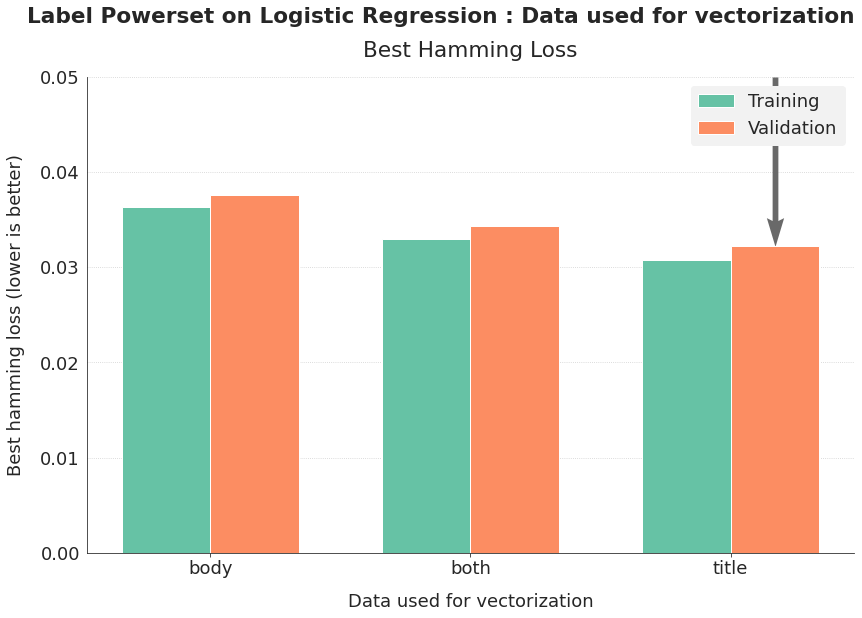

In [ ]:
fig, ax = graph_analysis(semi_powerset_logistic,
                         "data", "Data used for vectorization",
                         "Label Powerset on Logistic Regression",
                         isbar=True, ymax=0.05, show_time=False)

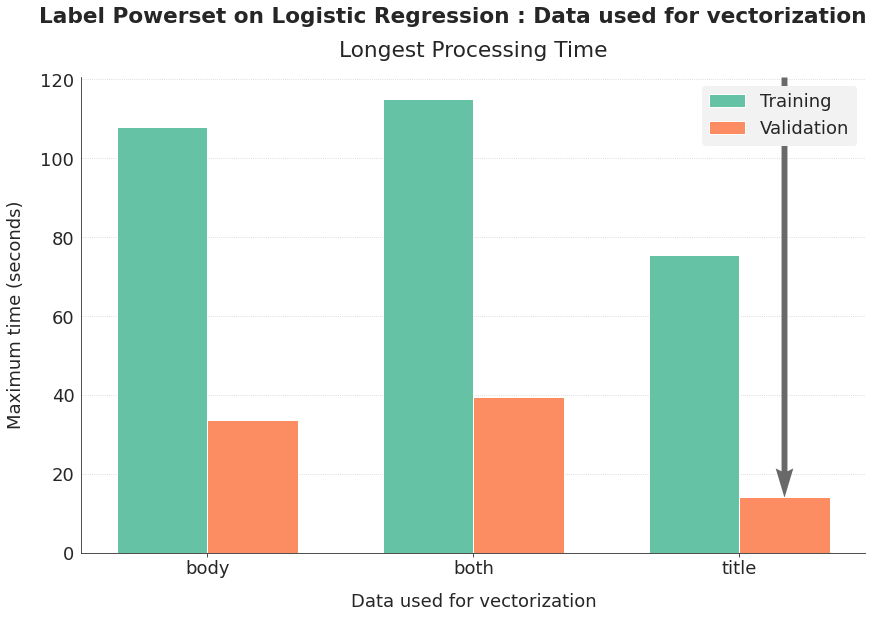

In [ ]:
fig, ax = graph_analysis(semi_powerset_logistic,
                         "data", "Data used for vectorization",
                         "Label Powerset on Logistic Regression",
                         isbar=True, show_time=True)

Results are slightly better when using both body and title. But using only title is really faster.

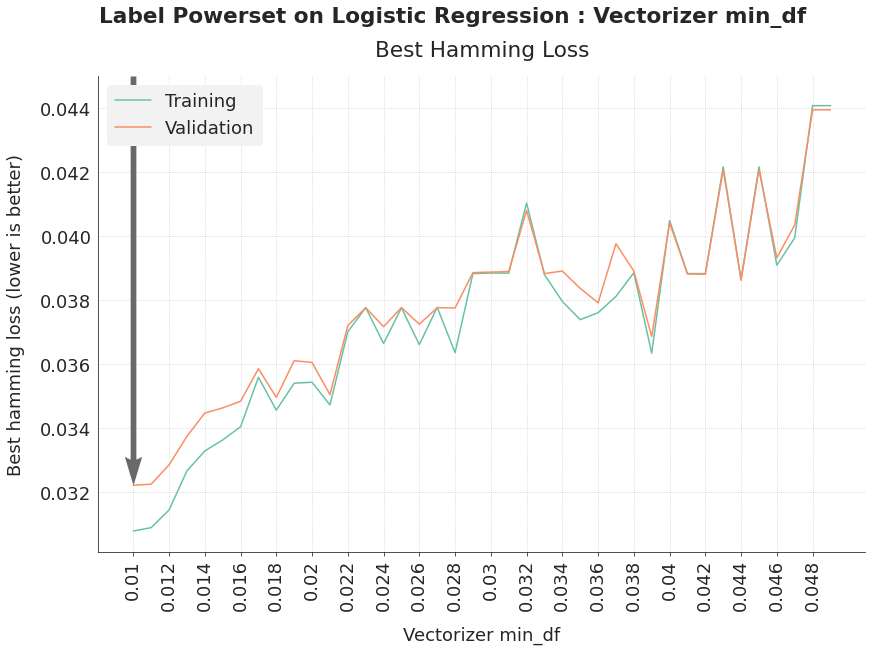

In [ ]:
fig, ax = graph_analysis(semi_powerset_logistic,
                         "bow_mindf", "Vectorizer min_df",
                         "Label Powerset on Logistic Regression",
                         ymax=0.045, tick_step=2, rotation=90, show_time=False)

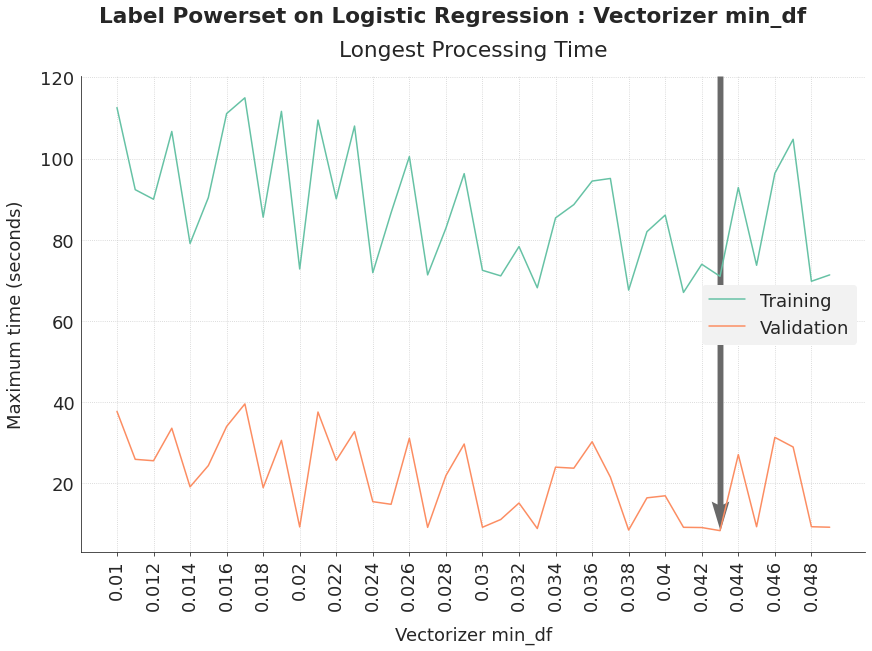

In [ ]:
fig, ax = graph_analysis(semi_powerset_logistic,
                         "bow_mindf", "Vectorizer min_df",
                         "Label Powerset on Logistic Regression",
                         tick_step=2, rotation=90, show_time=True)

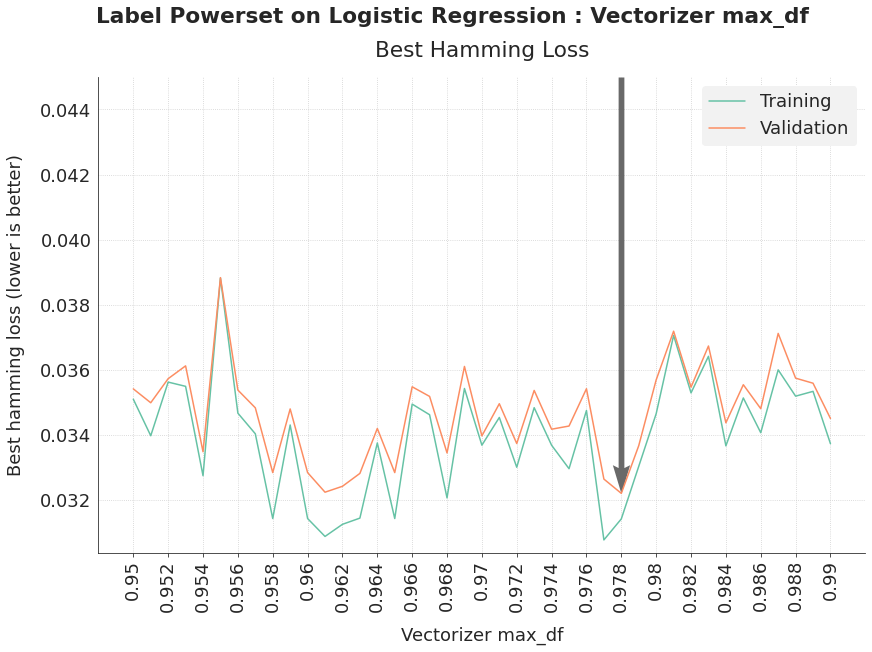

In [ ]:
fig, ax = graph_analysis(semi_powerset_logistic,
                         "bow_maxdf", "Vectorizer max_df",
                         "Label Powerset on Logistic Regression",
                         ymax=0.045, tick_step=2, rotation=90, show_time=False)

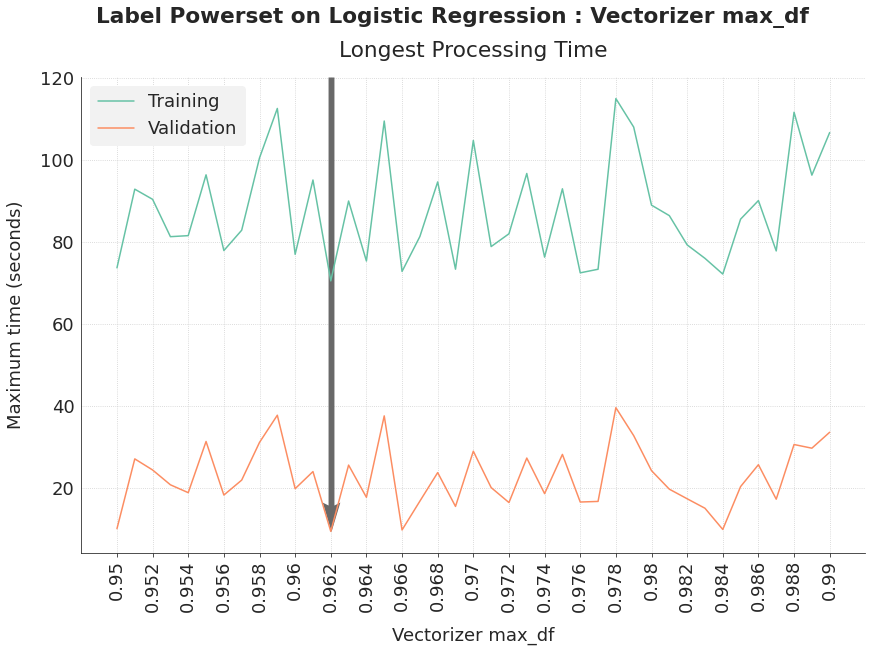

In [ ]:
fig, ax = graph_analysis(semi_powerset_logistic,
                         "bow_maxdf", "Vectorizer max_df",
                         "Label Powerset on Logistic Regression",
                         tick_step=2, rotation=90, show_time=True)

Processing time doesn't depend on min_df and max_df.  
Best results are get with a min_df of 0.01 and a max_df around 0.978.

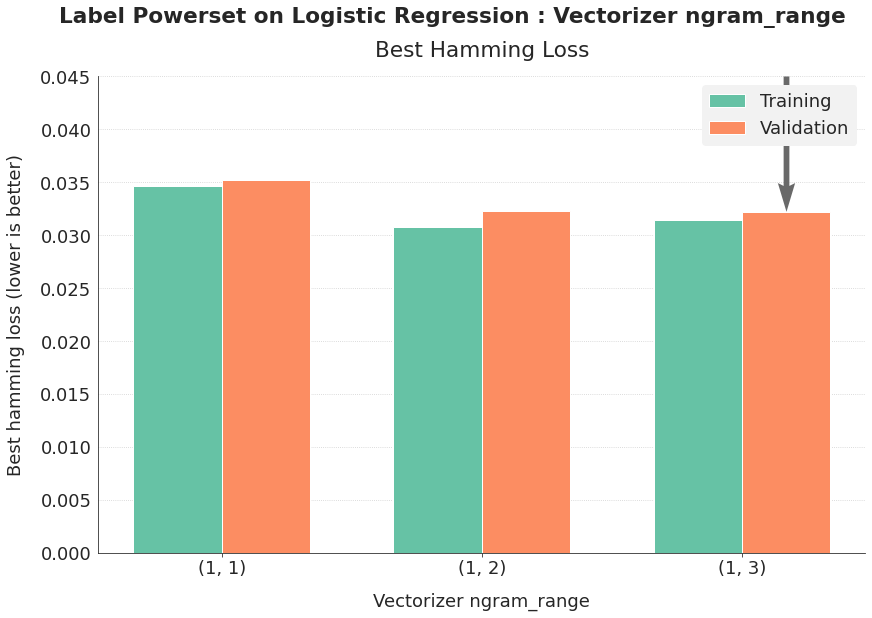

In [ ]:
fig, ax = graph_analysis(semi_powerset_logistic,
                         "bow_ngrams", "Vectorizer ngram_range",
                         "Label Powerset on Logistic Regression",
                         ymax=0.045, isbar=True, show_time=False)

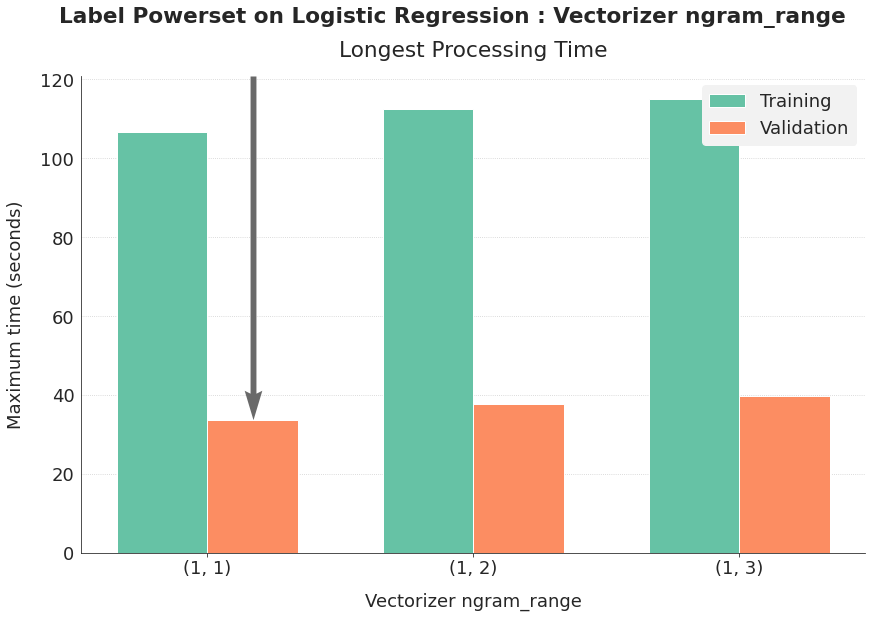

In [ ]:
fig, ax = graph_analysis(semi_powerset_logistic,
                         "bow_ngrams", "Vectorizer ngram_range",
                         "Label Powerset on Logistic Regression",
                         isbar=True, show_time=True)

Performance is sligthly better when adding trigrams and bigrams to the bag of words, at the price of a moderate increase in the processing time.

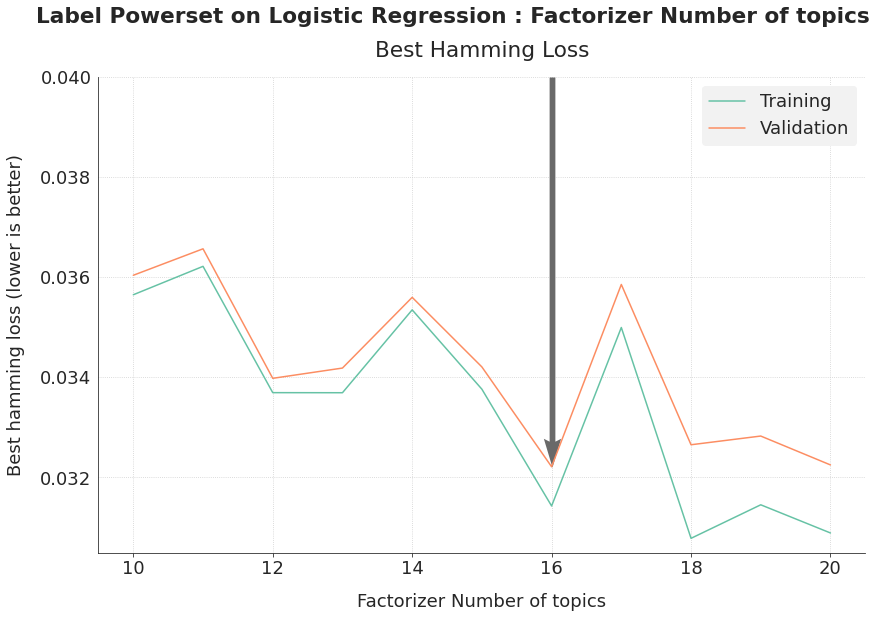

In [ ]:
fig, ax = graph_analysis(semi_powerset_logistic,
                         "factorizer_ntopics", "Factorizer Number of topics",
                         "Label Powerset on Logistic Regression",
                         ymax=0.04, tick_step=2, show_time=False)

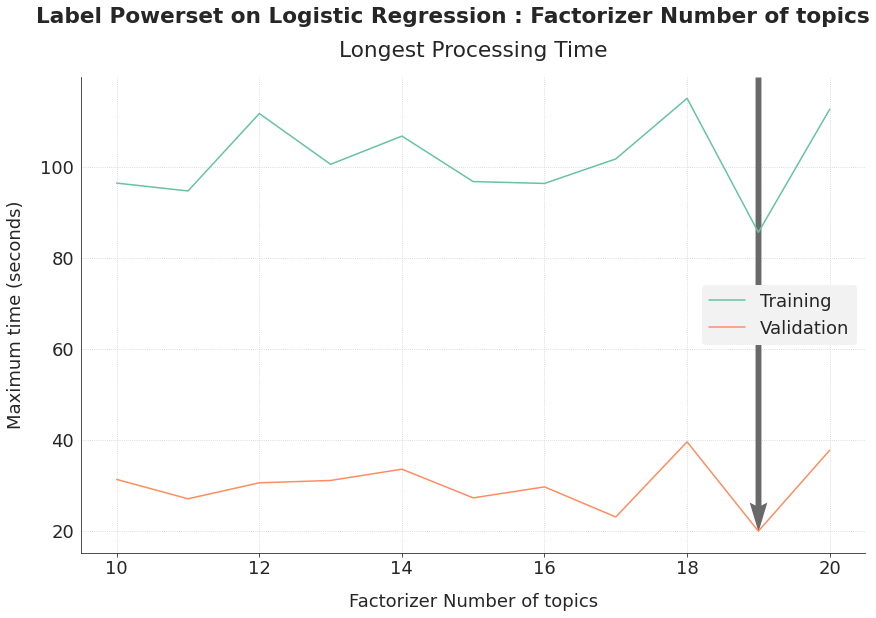

In [ ]:
fig, ax = graph_analysis(semi_powerset_logistic,
                         "factorizer_ntopics", "Factorizer Number of topics",
                         "Label Powerset on Logistic Regression",
                         tick_step=2, show_time=True)

A number of 16 topics gets the best performance. We should test more topics if we opt for this model, as the hamming loss tends to decrease when the number of topics increases.  
Time processing doesn't seem related to the number of topics.

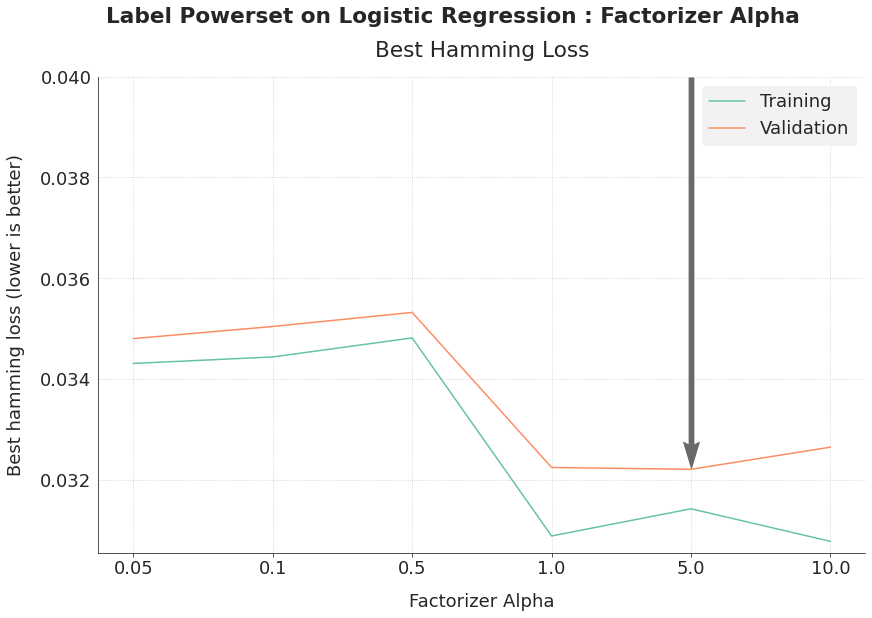

In [ ]:
fig, ax = graph_analysis(semi_powerset_logistic,
                         "factorizer_alpha", "Factorizer Alpha",
                         "Label Powerset on Logistic Regression",
                         ymax=0.04, show_time=False)

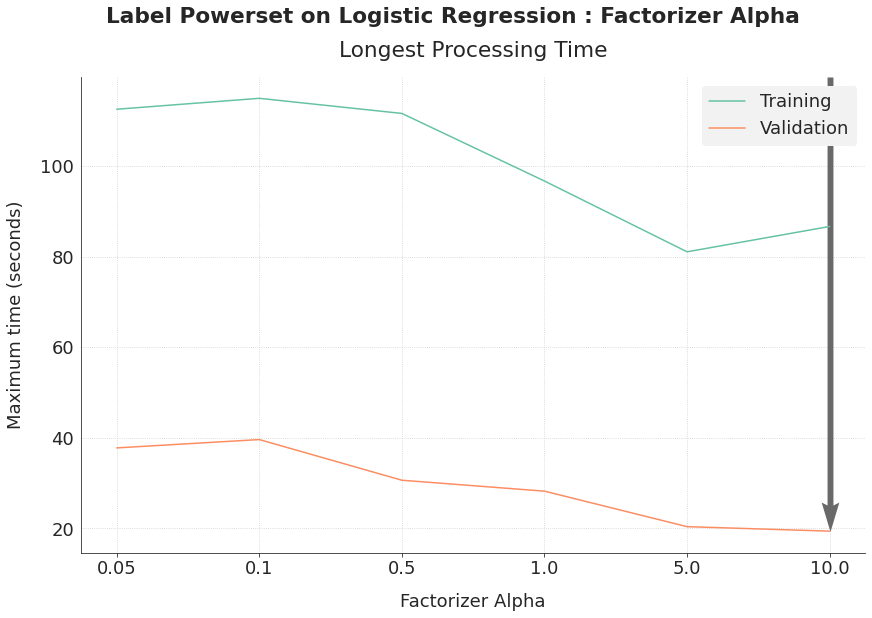

In [ ]:
fig, ax = graph_analysis(semi_powerset_logistic,
                         "factorizer_alpha", "Factorizer Alpha",
                         "Label Powerset on Logistic Regression",
                         show_time=True)

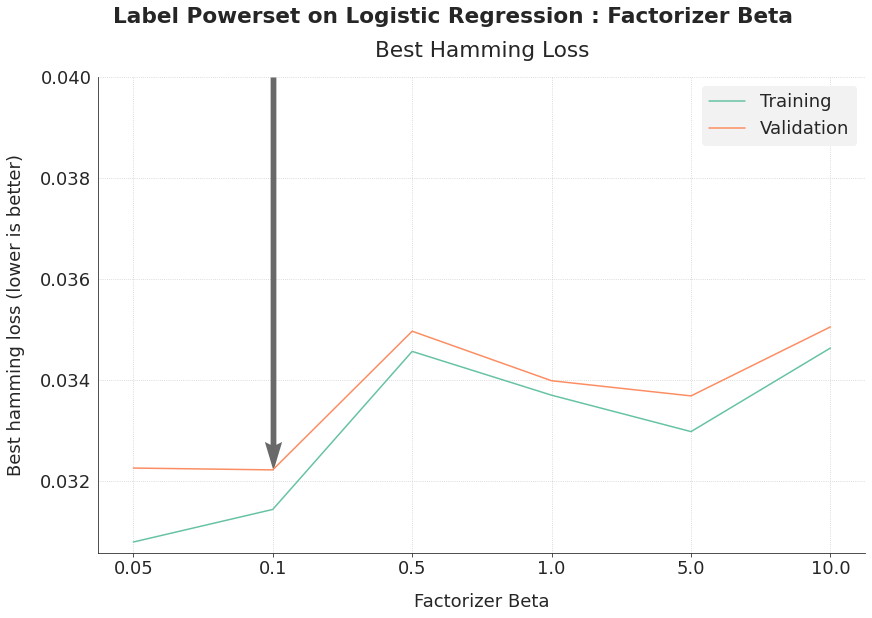

In [ ]:
fig, ax = graph_analysis(semi_powerset_logistic,
                         "factorizer_beta", "Factorizer Beta",
                         "Label Powerset on Logistic Regression",
                         ymax=0.04, show_time=False)

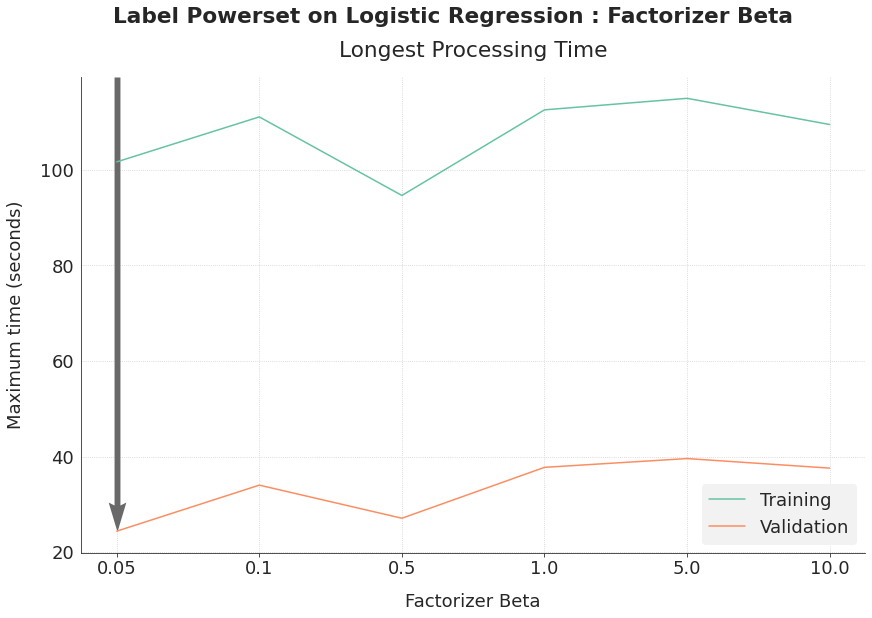

In [ ]:
fig, ax = graph_analysis(semi_powerset_logistic,
                         "factorizer_beta", "Factorizer Beta",
                         "Label Powerset on Logistic Regression",
                         show_time=True)

An alpha of 5 and a beta of 0.1 get the best performance.  
Time processing decreases wile alpha increases and seems uncorrelated to beta.

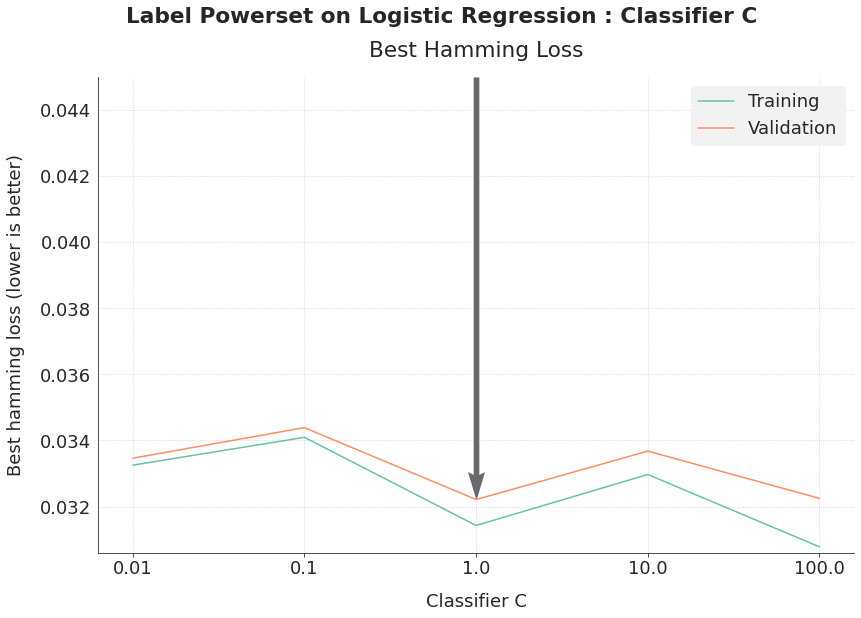

In [ ]:
fig, ax = graph_analysis(semi_powerset_logistic,
                         "clf_C", "Classifier C",
                         "Label Powerset on Logistic Regression",
                         ymax=0.045, show_time=False)

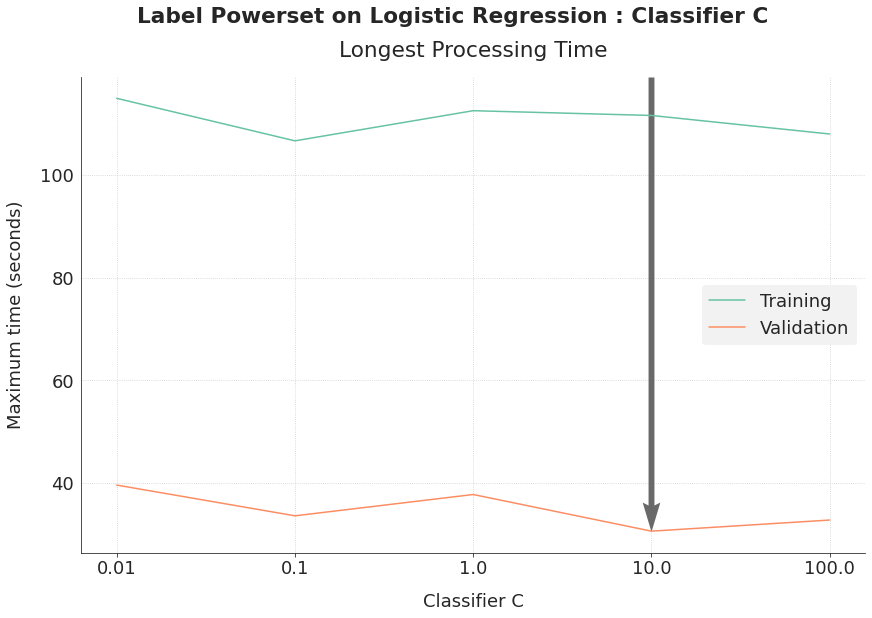

In [ ]:
fig, ax = graph_analysis(semi_powerset_logistic,
                         "clf_C", "Classifier C",
                         "Label Powerset on Logistic Regression",
                         show_time=True)

I choose a C of 1 to get the best performance.

In [ ]:
clf_pipeline.set_params(**{
    "vectorizer__ngram_range": (1, 3),
    "vectorizer__min_df": 0.01,
    "vectorizer__max_df": 0.978,
    "factorizer__n_components" : 16,
    "factorizer__doc_topic_prior": 5,
    "factorizer__topic_word_prior": 0.1,
    "classifier": LabelPowerset(),
    "classifier__classifier": LogisticRegression(n_jobs=-1),
    "classifier__classifier__C": 1.0})

Pipeline(memory=None,
         steps=[('vectorizer',
                 CountVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.int64'>, encoding='utf-8',
                                 input='content', lowercase=True, max_df=0.978,
                                 max_features=None, min_df=0.01,
                                 ngram_range=(1, 3), preprocessor=None,
                                 stop_words=['i', 'me', 'my', 'myself', 'we',
                                             'our', 'ours', 'ourselves', 'you',
                                             "you're", "you've...
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('classifier',
                 LabelPowerset(classifier=LogisticRegression(C=1.0,
                                                             class_weight=None,
                                                   

In [ ]:
clf_pipeline.fit(X_mini.title, y_mini)
predict_train = clf_pipeline.predict(X_mini.title)
predict_valid = clf_pipeline.predict(X_valid.title)

In [ ]:
train_hamming = hamming_loss(y_mini, predict_train)
valid_hamming = hamming_loss(y_valid, predict_valid)
train_accuracy = accuracy_score(y_mini, predict_train)
valid_accuracy = accuracy_score(y_valid, predict_valid)
train_f1_micro = f1_score(y_mini, predict_train, average="micro")
valid_f1_micro = f1_score(y_valid, predict_valid, average="micro")
train_f1_macro = f1_score(y_mini, predict_train, average="macro")
valid_f1_macro = f1_score(y_valid, predict_valid, average="macro")
train_f1_macroweighted = f1_score(y_mini, predict_train, average="weighted")
valid_f1_macroweighted = f1_score(y_valid, predict_valid, average="weighted")

In [ ]:
print("Training scores :")
print("Hamming loss = {:.4f}".format(train_hamming))
print("Accuracy score = {:.2%}".format(train_accuracy))
print("F1 micro score (overall calculation) = {:.2%}".format(train_f1_micro))
print("F1 macro score (average of f1 score for each label) = {:.2%}".format(train_f1_macro))
print("F1 macro weighted score (weighted average of f1 score for each label) = {:.2%}".format(train_f1_macroweighted))


Training scores :
Hamming loss = 0.0315
Accuracy score = 28.16%
F1 micro score (overall calculation) = 36.49%
F1 macro score (average of f1 score for each label) = 27.07%
F1 macro weighted score (weighted average of f1 score for each label) = 33.99%


In [ ]:
print("Validation scores :")
print("Hamming loss = {:.4f}".format(valid_hamming))
print("Accuracy score = {:.2%}".format(valid_accuracy))
print("F1 micro score (overall calculation) = {:.2%}".format(valid_f1_micro))
print("F1 macro score (average of f1 score for each label) = {:.2%}".format(valid_f1_macro))
print("F1 macro weighted score (weighted average of f1 score for each label) = {:.2%}".format(valid_f1_macroweighted))

Validation scores :
Hamming loss = 0.0323
Accuracy score = 25.99%
F1 micro score (overall calculation) = 34.49%
F1 macro score (average of f1 score for each label) = 24.42%
F1 macro weighted score (weighted average of f1 score for each label) = 31.78%


Label Powerset gets a better accuracy score but a worse hamming loss. Label Powerset suffers from a long calculation time. And its generalization may suffer from the large number of possible label combinations.  
I do prefer to get less missing or wrong labellings rather than having all labels right. So I prefer to base my evaluation on the hamming loss rather than on the accuracy score. From now, I give up Label Powerset to focus on Binary Relevance and Classifier Chains.

---
<a id='4_0'></a>

## <font color=blue>4. Semi-supervised learning models - hyperparameter optimization</font>

### 4.1. Models based on Binary Relevance or Classifier Chains

I focus on Binary Relevance and Classifier Chains. I base my tests only on the title, to benefit from the good results and the faster processing times it offers.  
I will test those different options :
- vectorizer : bag of words or TF IDF with :
  - ngram range : (1, 1) or (1, 2) or (1, 3) ;
  - min_df : between 0.005 and 0.05 ;
  - max_df : between 0.90 and 0.99.
- factorization : LDA or NMF :
  - n_components : between 15 and 50, with a step of 5 ;
  - alpha (LDA) : between 0.001 and 100 (log scale) ;
  - beta (LDA) : between 0.001 and 100 (log scale).
- Binary Relevance ou Classifier Chains ;
- models : 
  - Logistic Regression : C in 0.01, 0.1, 1, 10 and 100 ;
  - Random Forest : n_estimators between 50 and 250 (step of 25), max_depth between 2 and 15, min_samples_split between 2 and 20, min_samples_leaf between 1 and 10, max_features in the interval of 0.1 to 1 ;
  - SVM : kernel RBF ; C in 0.01, 0.1, 1, 10 and 100 ; gamma in 0.01, 0.1, 1, 10 and 100 ;
  - Multinomial Naïve Bayes : alpha between 0 and 2.0
  - XGBoost : objective between binary:logistic and binary:hinge, n_estimators between 10 and 200 (step of 10), learning_rate between 0.05 and 0.30, max_depth between 3 and 16, min_child_weight between 0 and 11, colsample_bytree between 0.3 and 1, subsample between 0 and 0.5 and 1, gamma between 0 and 0.5, reg_alpha between 0 and 2, reg_lambda between 0 and 2.0.

In [ ]:
def objective_semisupervised(params):
    global ITERATION, OUT_FILE
    ITERATION += 1

    params_data = params.get("data")
    params_vect = params.get("vectorizer")
    params_fact = params.get("factorizer")
    params_multi = params.get("classifier")
    params_model = params.get("model")
    
    t_vect = params_vect["type"]
    del params_vect["type"]
    if t_vect == "bow":
        vectorizer = CountVectorizer(token_pattern=my_regex,
                                     stop_words=full_stop_words)
    elif t_vect == "tfidf":
        vectorizer = TfidfVectorizer(token_pattern=my_regex,
                                     stop_words=full_stop_words)
    else:
        return 0
    vectorizer.set_params(**params_vect)

    t_fact = params_fact["type"]
    del params_fact["type"]
    if t_fact == "lda":
        factorizer = LatentDirichletAllocation(n_jobs=-1, random_state=42)
    elif t_fact == "nmf":
        factorizer = NMF(random_state=42)
    else:
        return 0
    factorizer.set_params(**params_fact)

    t_model = params_model["type"]
    del params_model["type"]
    if t_model == "logistic_regression":
        model = LogisticRegression(n_jobs=-1)
    elif t_model == "svm":
        model = SVC(random_state=42)
    elif t_model == "random_forest":
        model = RandomForestClassifier(n_jobs=-1, random_state=42)
    elif t_model == "naive_bayes":
        model = MultinomialNB()
    elif t_model == "xgb":
        model = XGBClassifier(n_jobs=-1, random_state=42)
    else:
        return 0
    model.set_params(**params_model)

    t_multi = params_multi
    if t_multi == "BinaryRelevance":
        clf = BinaryRelevance(model)
    elif t_multi == "ClassifierChain":
        clf = ClassifierChain(model)
    else:
        return 0
    
    # no StandardScaler if Multinomial Naive Bayesian as it needs only positive inputs
    if t_model == "naive_bayes":
        my_pipeline = Pipeline([
            ("vectorizer", vectorizer),
            ("factorizer", factorizer),
            ("classifier", clf)])
    else:
        my_pipeline = Pipeline([
            ("vectorizer", vectorizer),
            ("factorizer", factorizer),
            ("scaler", StandardScaler()),
            ("classifier", clf)])

    start_time = timer()
    my_pipeline.fit(X_mini[params_data], y_mini)
    fit_time = timer() - start_time
    train_predict = my_pipeline.predict(X_mini[params_data])
    train_score = hamming_loss(y_mini, train_predict)
    
    start_time = timer()
    valid_predict = my_pipeline.predict(X_valid[params_data])
    test_time = timer() - start_time
    valid_score = hamming_loss(y_valid, valid_predict)

    params_vect["vectorizer"] = t_vect
    params_fact["factorizer"] = t_fact
    params_model["multi"] = t_multi
    params_model["classifier"] = t_model
    of_connection = open(OUT_FILE, 'a')
    writer = csv.writer(of_connection)
    writer.writerow([valid_score, train_score, fit_time, test_time,
                     params_data, params_vect, params_fact,
                     params_model, ITERATION])
    of_connection.close()
    
    return {"loss": valid_score, "train_score": train_score,
            "fit_time": fit_time, "test_time": test_time,
            "params": params, "iteration": ITERATION, "status": STATUS_OK}

In [ ]:
space_semisupervised = {
    "data": "title",
    "vectorizer": hp.choice("vectorizer_type", [
        {"type": "bow",
         "ngram_range": hp.choice("bow_ngrams", [(1, 1), (1, 2), (1, 3)]),
         "min_df": hp.uniform("bow_mindf", 0.005, 0.05),
         "max_df": hp.uniform("bow_maxdf", 0.90, 0.99)},
        {"type": "tfidf",
         "ngram_range": hp.choice("tfidf_ngrams", [(1, 1), (1, 2), (1, 3)]),
         "min_df": hp.uniform("tfidf_mindf", 0.005, 0.05),
         "max_df": hp.uniform("tfidf_maxdf", 0.90, 0.99)}
        ]),
    "factorizer": hp.choice("factorizer_type", [
        {"type": "lda",
         "n_components":
            hp.choice("lda_topics", np.arange(15, 51, 5, dtype=int)),
         "doc_topic_prior":
            hp.loguniform("lda_alpha", np.log(0.001), np.log(100)),
         "topic_word_prior":
            hp.loguniform("lda_beta", np.log(0.001), np.log(100))},
        {"type": "nmf",
         "n_components":
            hp.choice("nmf_topics", np.arange(15, 51, 5, dtype=int))}
        ]),
    "classifier": hp.choice("multi_type",
                            ["BinaryRelevance", "ClassifierChain"]),
    "model": hp.choice("clf_type", [
        {"type": "logistic_regression",
         "C": hp.loguniform("log_C", np.log(0.01), np.log(100))},
        {"type": "svm",
         "kernel": "rbf",
         "C": hp.loguniform("svm_C", np.log(0.01), np.log(100)),
         "gamma": hp.loguniform("svm_gamma", np.log(0.01), np.log(100))},
        {"type": "random_forest",
         "n_estimators":
            hp.choice("rf_n_estimators", np.arange(50, 251, 25, dtype=int)),
         "max_depth": 
            hp.choice("rf_max_depth", np.arange(2, 16, 1, dtype=int)),
         "min_samples_split": 
            hp.choice("rf_min_samples_split", np.arange(2, 21, 2, dtype=int)),
         "min_samples_leaf": 
            hp.choice("rf_min_samples_leaf", np.arange(1, 11, 1, dtype=int)),
         "max_features": hp.uniform("rf_max_features", 0.1, 1)},
        {"type": "naive_bayes",
         "alpha": hp.uniform("nb_alpha", 0.0, 2.0)},
        {"type": "xgb",
         "objective":
            hp.choice("xgb_objective", ["binary:logistic", "binary:hinge"]),
         "n_estimators":
            hp.choice("xgb_n_estimators", np.arange(50, 251, 25, dtype=int)),
         "learning_rate": hp.uniform("xgb_learning_rate", 0.05, 0.3),
         "max_depth":
            hp.choice("xgb_max_depth", np.arange(2, 16, 1, dtype=int)),
         "min_child_weight":
            hp.choice("xgb_min_child_weight", np.arange(0, 11, 1, dtype=int)),
         "colsample_bytree": hp.uniform("xgb_colsample_bytree", 0.3, 1.0),
         "subsample": hp.uniform("xgb_subsample", 0.5, 1.0),
         "gamma": hp.uniform("xgb_gamma", 0.0, 0.5),
         "reg_alpha": hp.uniform("xgb_reg_alpha", 0.0, 2.0),
         "reg_lambda": hp.uniform("xgb_reg_lambda", 0.0, 2.0)}
        ])}

In [ ]:
semi_file = "hyperopt_semi_full.csv"
run_semisupervised(semi_file, max_evals=200)

 21%|██        | 42/200 [3:55:17<16:14:46, 370.17s/it, best loss: 0.0198899535741641]

/usr/local/lib/python3.6/dist-packages/sklearn/decomposition/_nmf.py:109: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(res * 2)



 29%|██▉       | 58/200 [4:35:46<4:41:17, 118.86s/it, best loss: 0.0198899535741641]

/usr/local/lib/python3.6/dist-packages/sklearn/decomposition/_nmf.py:109: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(res * 2)



 84%|████████▍ | 168/200 [11:54:37<1:13:44, 138.25s/it, best loss: 0.01919340971972551]

In [ ]:
semi_full = get_semifull_summary("hyperopt_semi_full.csv")
semi_full.head()

,validation_hamming_loss,training_hamming_loss,fit_time,test_time,params_factorizer,params_classifier,iteration,data,vectorizer,vectorizer_maxdf,vectorizer_mindf,vectorizer_ngrams,factorizer,factorizer_ntopics,multi,classifier
0,0.064131,0.064594,1.792990,2.760651,"{'n_components': 35, 'factorizer': 'nmf'}","{'alpha': 1.391862724695528, 'multi': 'Classif...",1,title,tfidf,0.908,0.034,"(1, 3)",nmf,35,ClassifierChain,naive_bayes
1,0.073741,0.071268,0.604619,1.332465,"{'n_components': 25, 'factorizer': 'nmf'}","{'alpha': 0.9083404353187119, 'multi': 'Binary...",2,title,tfidf,0.904,0.047,"(1, 2)",nmf,25,BinaryRelevance,naive_bayes
2,0.027152,0.027284,20.175155,2.921361,"{'doc_topic_prior': 2.4463232700403648, 'n_com...","{'C': 0.03574655164089068, 'multi': 'BinaryRel...",3,title,tfidf,0.978,0.048,"(1, 2)",lda,35,BinaryRelevance,logistic_regression
3,0.022002,0.021983,32.650456,3.897134,"{'n_components': 45, 'factorizer': 'nmf'}","{'C': 0.04185932455010552, 'multi': 'Classifie...",4,title,tfidf,0.912,0.006,"(1, 3)",nmf,45,ClassifierChain,logistic_regression
4,0.027116,0.027248,31.094842,105.291029,"{'doc_topic_prior': 23.07553434835337, 'n_comp...","{'C': 0.01516591998877679, 'gamma': 83.7280291...",5,title,bow,0.951,0.045,"(1, 1)",lda,30,BinaryRelevance,svm


In [ ]:
semi_full.sort_values(by="validation_hamming_loss").head(5)

,validation_hamming_loss,training_hamming_loss,fit_time,test_time,params_factorizer,params_classifier,iteration,data,vectorizer,vectorizer_maxdf,vectorizer_mindf,vectorizer_ngrams,factorizer,factorizer_ntopics,multi,classifier
72,0.019193,0.017072,115.132309,24.248921,"{'n_components': 50, 'factorizer': 'nmf'}","{'max_depth': 9, 'max_features': 0.32514110016...",73,title,bow,0.964,0.005,"(1, 2)",nmf,50,ClassifierChain,random_forest
70,0.019288,0.016995,155.252771,22.998394,"{'n_components': 50, 'factorizer': 'nmf'}","{'max_depth': 9, 'max_features': 0.47938722410...",71,title,bow,0.966,0.006,"(1, 2)",nmf,50,ClassifierChain,random_forest
147,0.019431,0.018160,80.184654,11.264317,"{'n_components': 50, 'factorizer': 'nmf'}","{'colsample_bytree': 0.3978162113010868, 'gamm...",148,title,bow,0.964,0.007,"(1, 3)",nmf,50,ClassifierChain,xgb
160,0.019432,0.017987,95.083247,23.926293,"{'n_components': 50, 'factorizer': 'nmf'}","{'max_depth': 9, 'max_features': 0.29771683098...",161,title,bow,0.957,0.007,"(1, 2)",nmf,50,ClassifierChain,random_forest
158,0.019442,0.017792,367.499734,48.769576,"{'n_components': 50, 'factorizer': 'nmf'}","{'max_depth': 9, 'max_features': 0.45204025614...",159,title,bow,0.967,0.006,"(1, 2)",nmf,50,ClassifierChain,random_forest


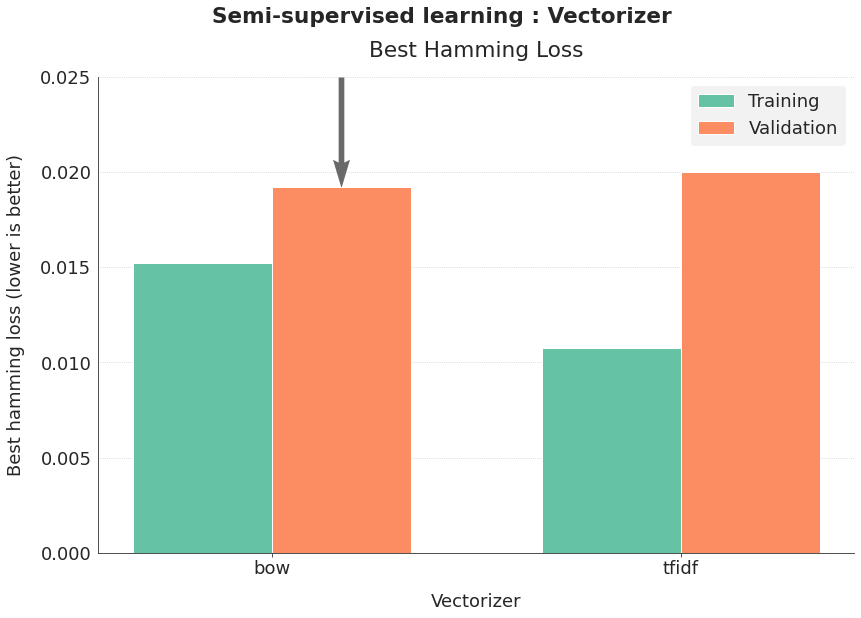

In [ ]:
fig, ax = graph_analysis(semi_full, "vectorizer", "Vectorizer",
                         "Semi-supervised learning", isbar=True, ymax=0.025)

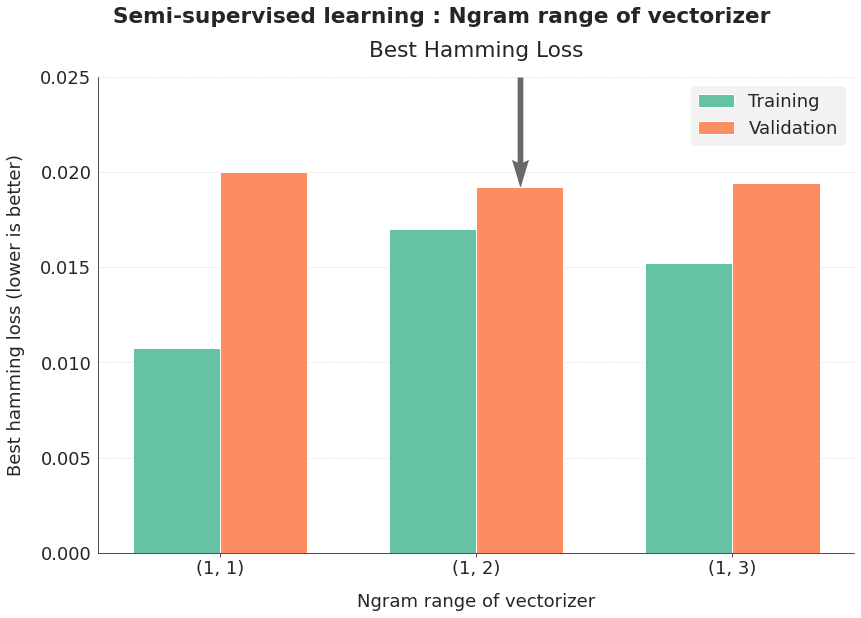

In [ ]:
fig, ax = graph_analysis(semi_full, "vectorizer_ngrams",
                         "Ngram range of vectorizer",
                         "Semi-supervised learning", isbar=True, ymax=0.025)

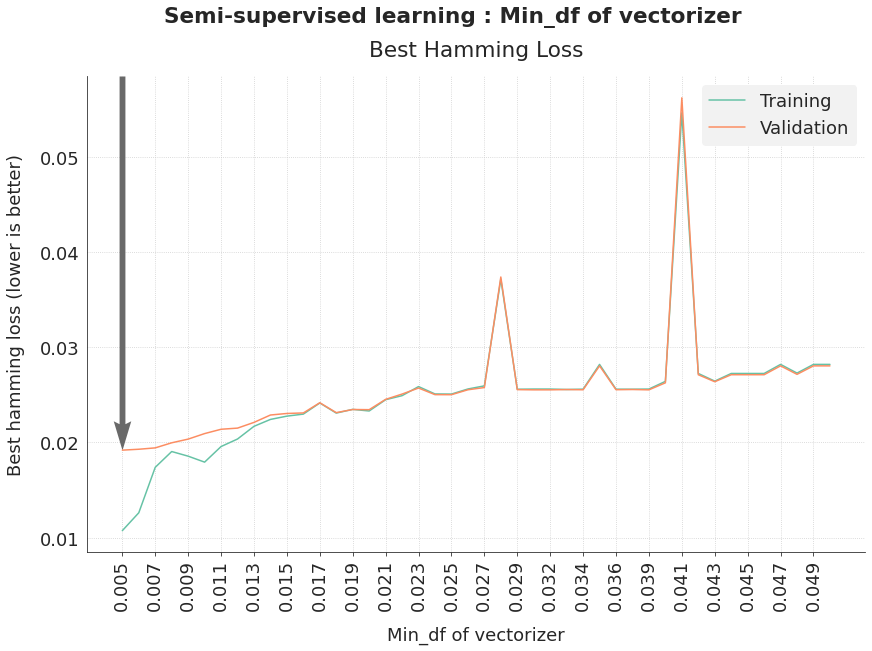

In [ ]:
fig, ax = graph_analysis(semi_full, "vectorizer_mindf", "Min_df of vectorizer",
                         "Semi-supervised learning",
                         isbar=False, tick_step=2, rotation=90)

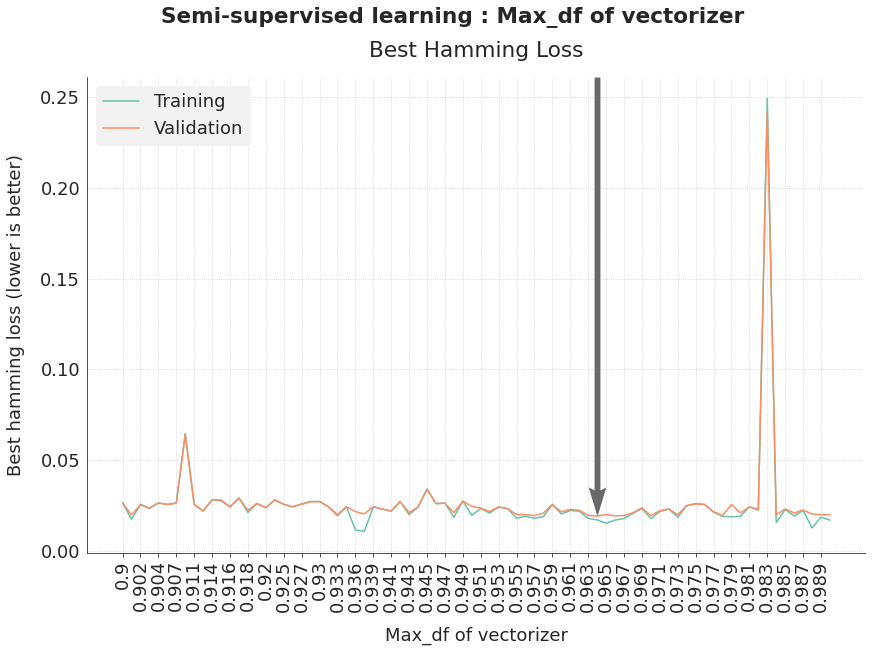

In [ ]:
fig, ax = graph_analysis(semi_full, "vectorizer_maxdf", "Max_df of vectorizer",
                         "Semi-supervised learning",
                         isbar=False, tick_step=2, rotation=90)

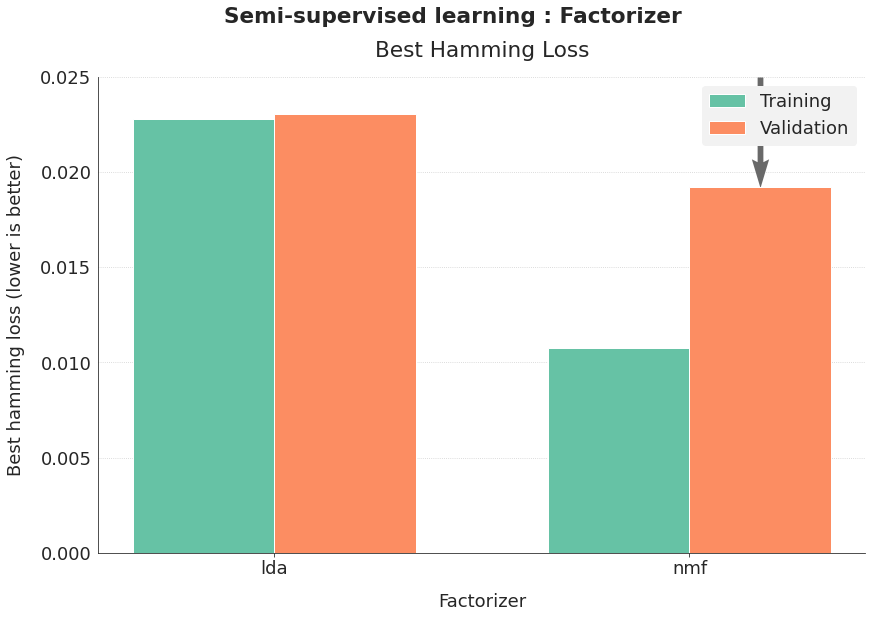

In [ ]:
fig, ax = graph_analysis(semi_full, "factorizer", "Factorizer",
                         "Semi-supervised learning", isbar=True, ymax=0.025)

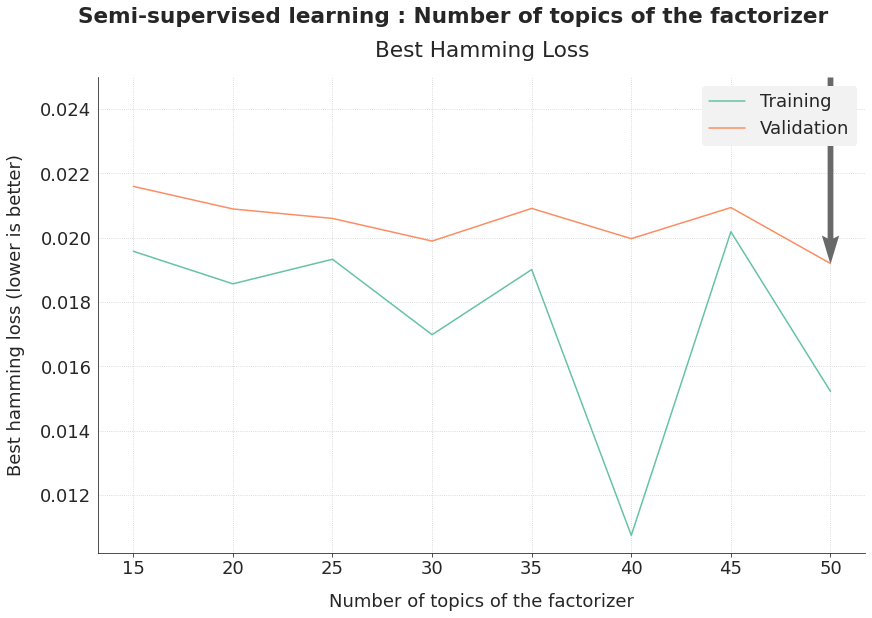

In [ ]:
fig, ax = graph_analysis(semi_full, "factorizer_ntopics",
                         "Number of topics of the factorizer",
                         "Semi-supervised learning", ymax=0.025)

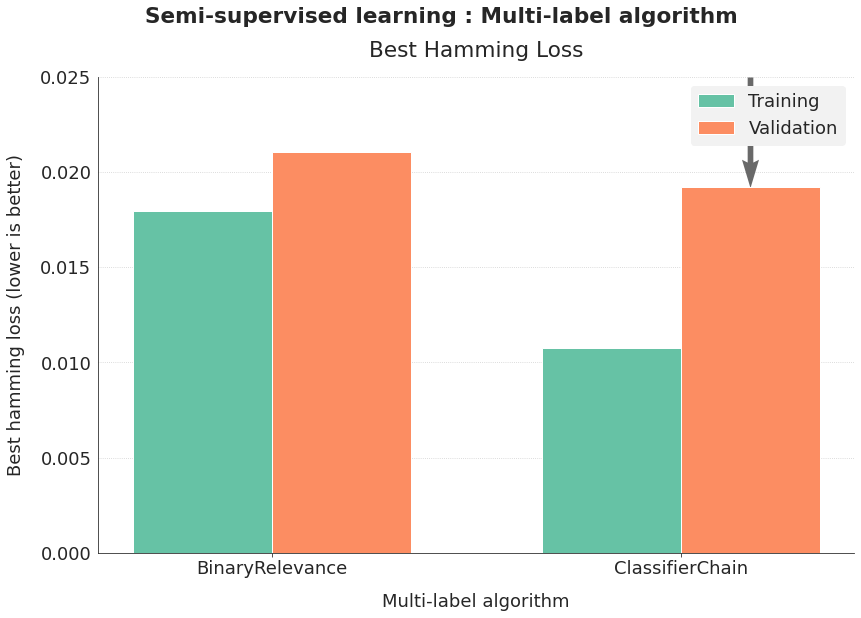

In [ ]:
fig, ax = graph_analysis(semi_full, "multi", "Multi-label algorithm",
                         "Semi-supervised learning", isbar=True, ymax=0.025)

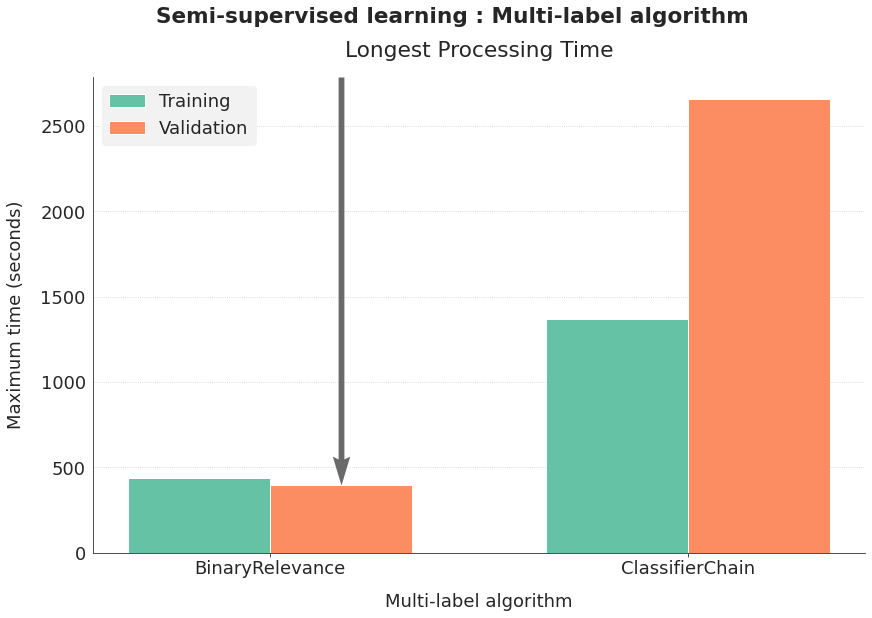

In [ ]:
fig, ax = graph_analysis(semi_full, "multi", "Multi-label algorithm",
                         "Semi-supervised learning", isbar=True, show_time=True)

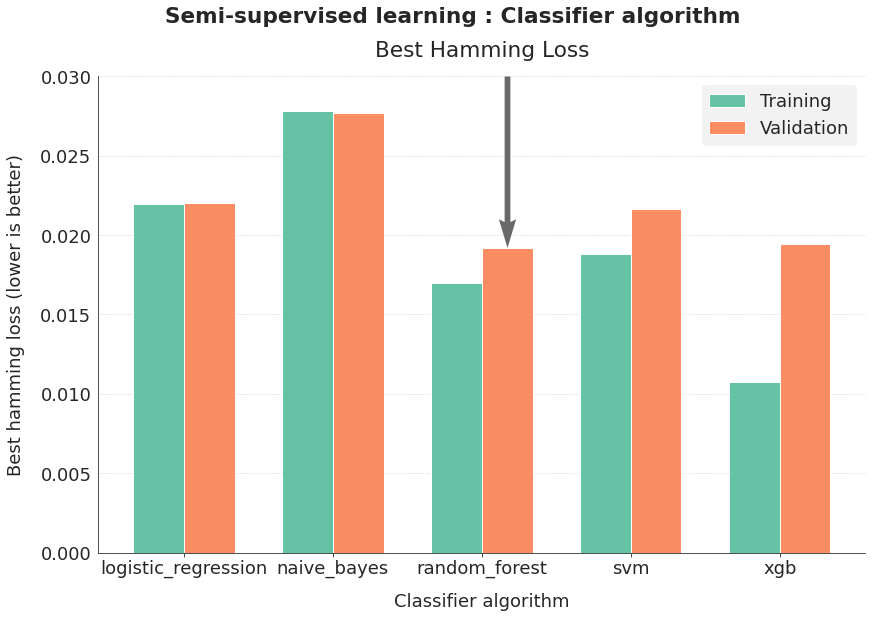

In [ ]:
fig, ax = graph_analysis(semi_full, "classifier", "Classifier algorithm",
                         "Semi-supervised learning", isbar=True, ymax=0.03)

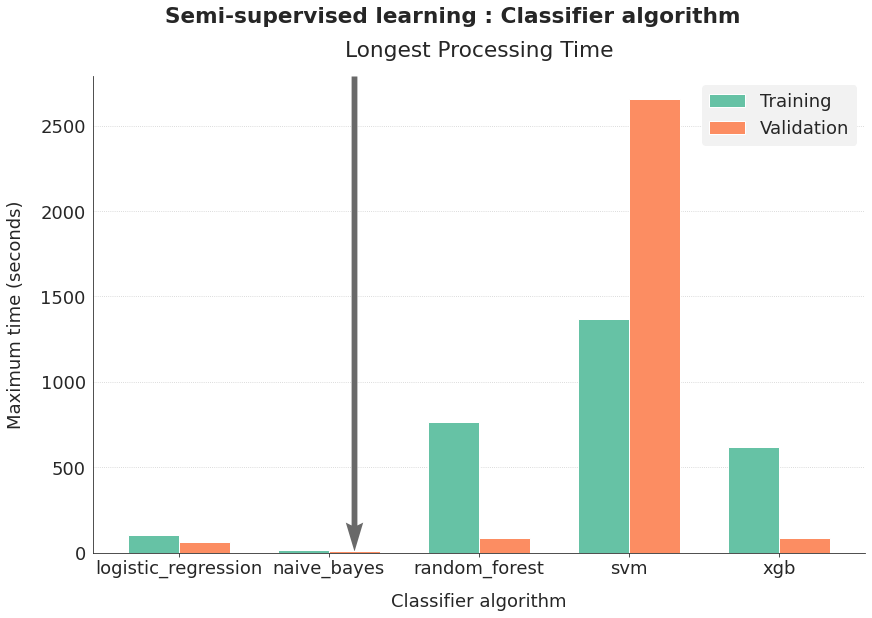

In [ ]:
fig, ax = graph_analysis(semi_full, "classifier", "Classifier algorithm",
                         "Semi-supervised learning", isbar=True, show_time=True)

The more promising algorithm in semi-supervised learning is random forest. Its weakness comes from its processing time. I analyse the results for the random forest classifier. Then I will run a new hyper-optimization, focused on the best values obtained so far.

<a id="4_2"></a>

### 4.2. Analysis of the most promising hyperparameters for Random Forest

In [ ]:
semi_rf = semi_full[semi_full.classifier == "random_forest"].copy()

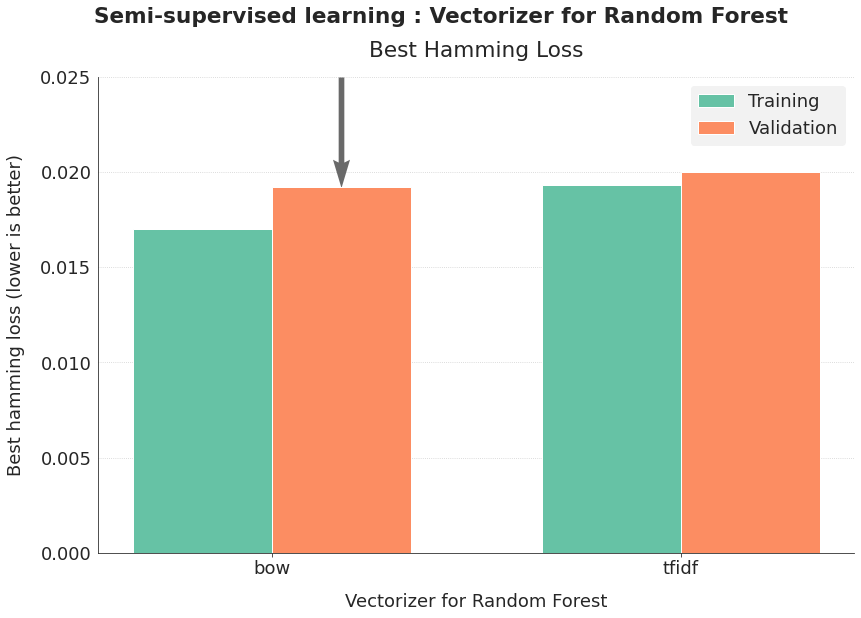

In [ ]:
fig, ax = graph_analysis(semi_rf, "vectorizer", "Vectorizer for Random Forest",
                         "Semi-supervised learning", isbar=True, ymax=0.025)

Vectorization with Bag of Words gets slightly better results.  I will test again those two options.

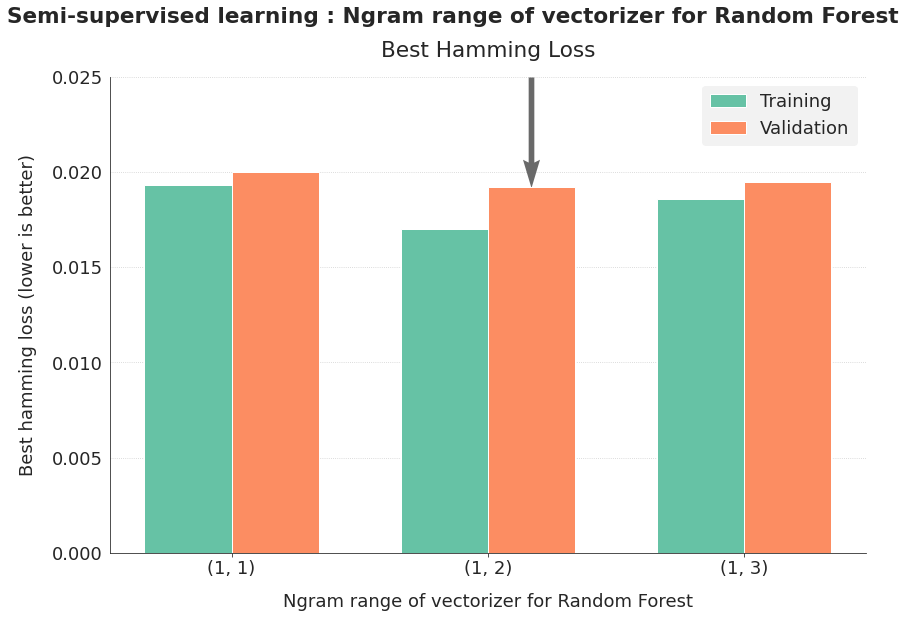

In [ ]:
fig, ax = graph_analysis(semi_rf, "vectorizer_ngrams",
                         "Ngram range of vectorizer for Random Forest",
                         "Semi-supervised learning", isbar=True, ymax=0.025)

Performance is close with the different tested ngram ranges.

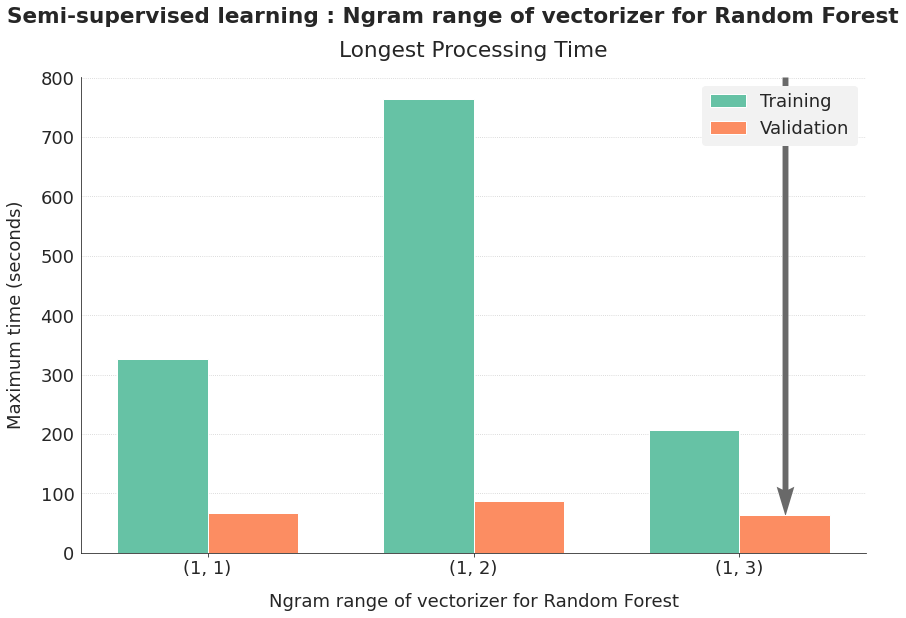

In [ ]:
fig, ax = graph_analysis(semi_rf, "vectorizer_ngrams",
                         "Ngram range of vectorizer for Random Forest",
                         "Semi-supervised learning", isbar=True, show_time=True)

Processing time doesn't seem to be directly impacted by the ngram range choice.

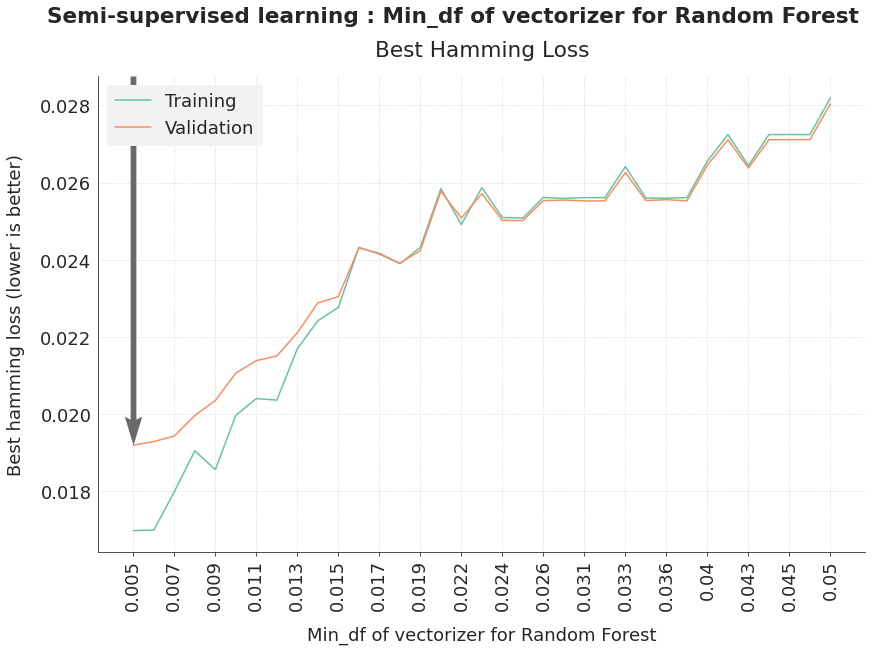

In [ ]:
fig, ax = graph_analysis(semi_rf, "vectorizer_mindf",
                         "Min_df of vectorizer for Random Forest",
                         "Semi-supervised learning",
                         isbar=False, tick_step=2, rotation=90)

Results are better with small min_df values. Performance increases when we keep more words. I will test lower values for min_df (from 0.001 to 0.01). Overfitting seems to increase when the setting of min_df decreases.

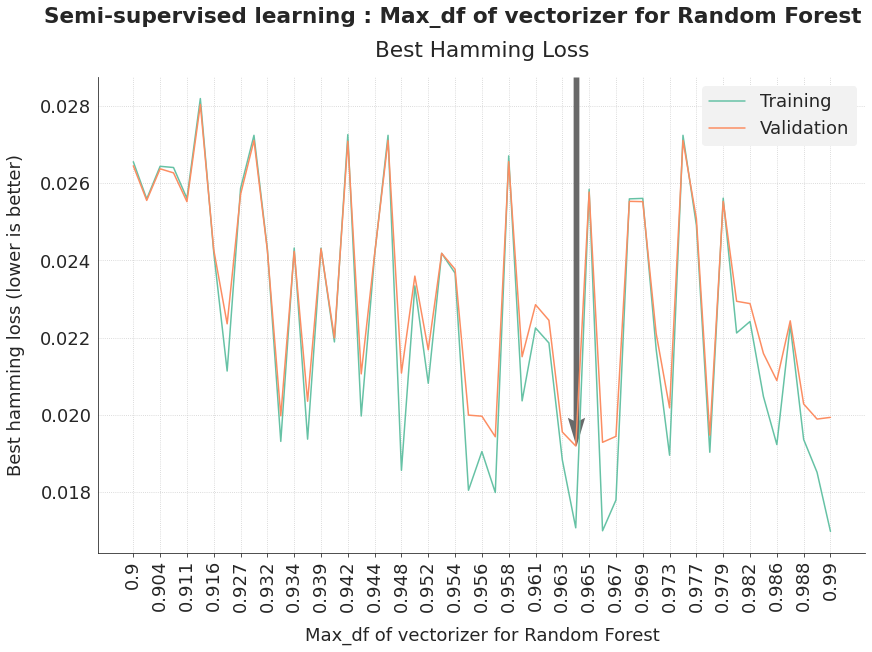

In [ ]:
fig, ax = graph_analysis(semi_rf, "vectorizer_maxdf",
                         "Max_df of vectorizer for Random Forest",
                         "Semi-supervised learning",
                         isbar=False, tick_step=2, rotation=90)

We need to remove the more common words to get better results. I will test values between 0.95 and 0.98.

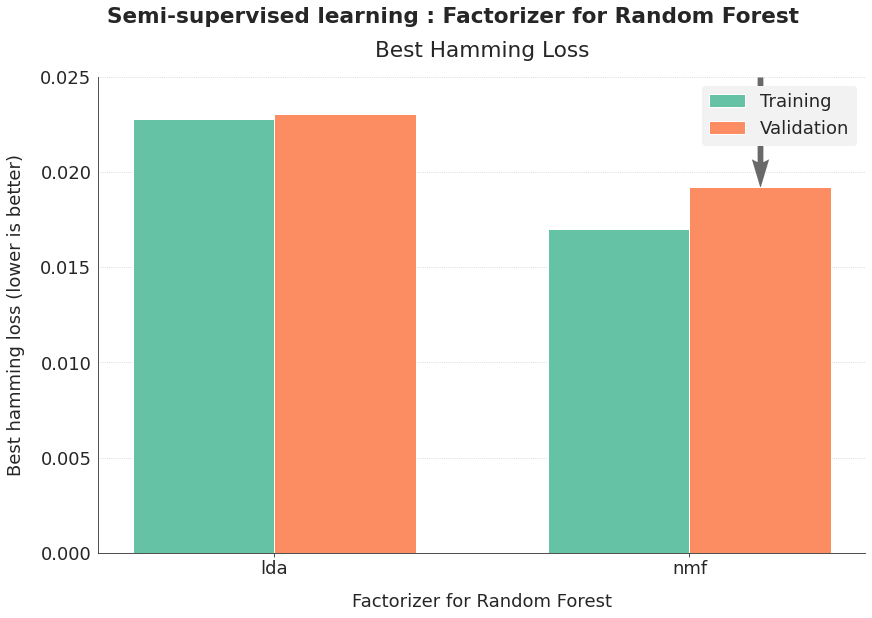

In [ ]:
fig, ax = graph_analysis(semi_rf, "factorizer", "Factorizer for Random Forest",
                         "Semi-supervised learning", isbar=True, ymax=0.025)

I keep the Non-Negative Matrix Factorization.

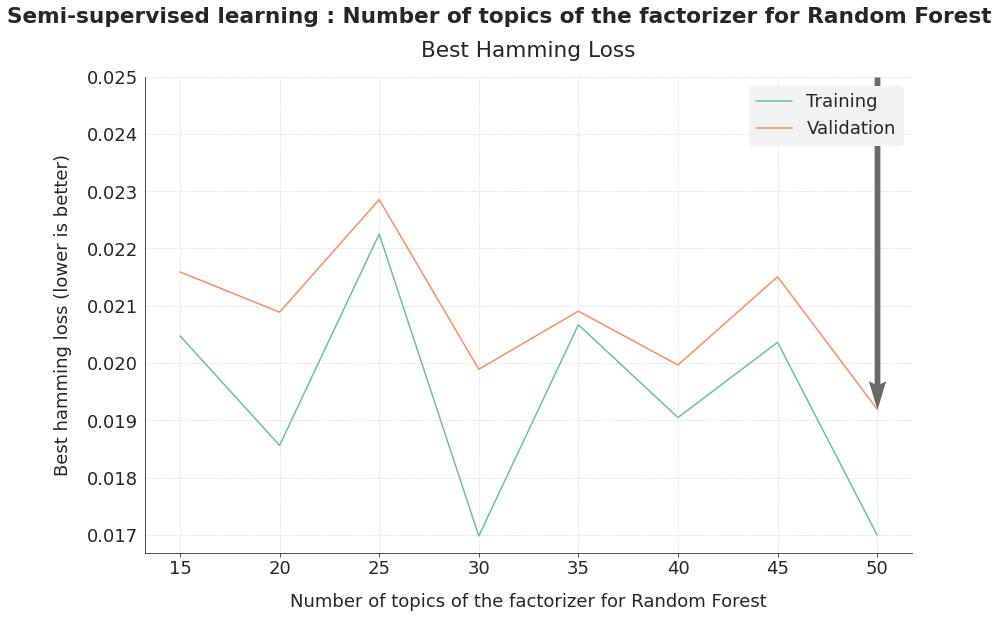

In [ ]:
fig, ax = graph_analysis(semi_rf, "factorizer_ntopics",
                         "Number of topics of the factorizer for Random Forest",
                         "Semi-supervised learning", ymax=0.025)

Performance increases with the number of topics. Our best performance is obtained with the maximum tested value. So I need to explore greater values. I will test from 30 to 100 topics.

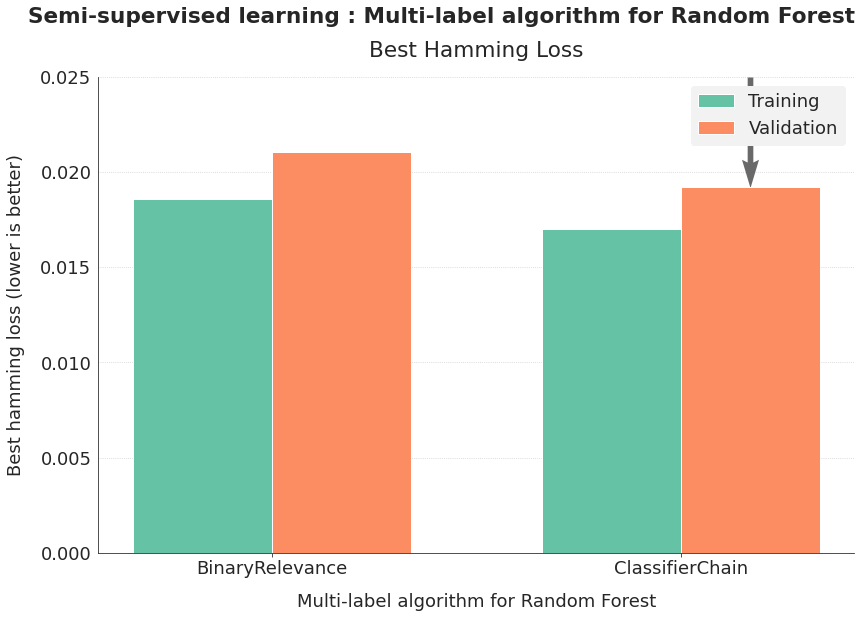

In [ ]:
fig, ax = graph_analysis(semi_rf, "multi",
                         "Multi-label algorithm for Random Forest",
                         "Semi-supervised learning", isbar=True, ymax=0.025)

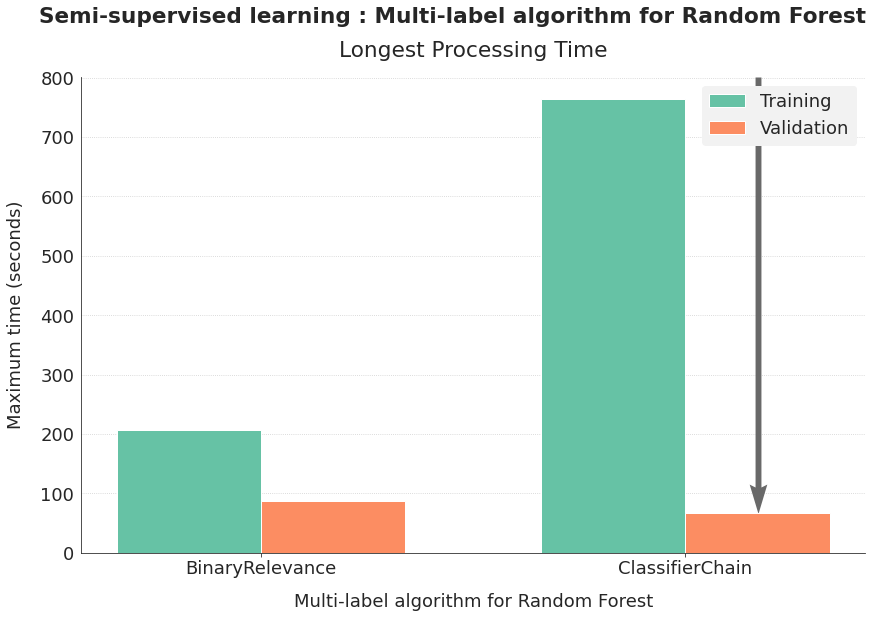

In [ ]:
fig, ax = graph_analysis(semi_rf, "multi",
                         "Multi-label algorithm for Random Forest",
                         "Semi-supervised learning", isbar=True, show_time=True)

Classifier Chain gets a better performance. It is longer for fitting but quicker for evaluating new values. So I keep Classifier Chain.

In [ ]:
rf_parameters = semi_rf[["validation_hamming_loss", "training_hamming_loss",
                         "fit_time", "test_time", "params_classifier"]].copy()

In [ ]:
rf_parameters["max_depth"] = \
    [np.int(param[param.find("max_depth")+12: param.find("max_features")-3])
     for param in rf_parameters.params_classifier]
rf_parameters["max_features"] = \
    [np.around(np.float(param[param.find("max_features")+15:
                              param.find("min_samples_leaf")-3]), 3)
     for param in rf_parameters.params_classifier]
rf_parameters["min_samples_leaf"] = \
    [np.int(param[param.find("min_samples_leaf")+19:
                  param.find("min_samples_split")-3])
     for param in rf_parameters.params_classifier]
rf_parameters["min_samples_split"] = \
    [np.int(param[param.find("min_samples_split")+20:
                  param.find("n_estimators")-3])
     for param in rf_parameters.params_classifier]
rf_parameters["n_estimators"] = \
    [np.int(param[param.find("n_estimators")+15: param.find("multi")-3])
     for param in rf_parameters.params_classifier]

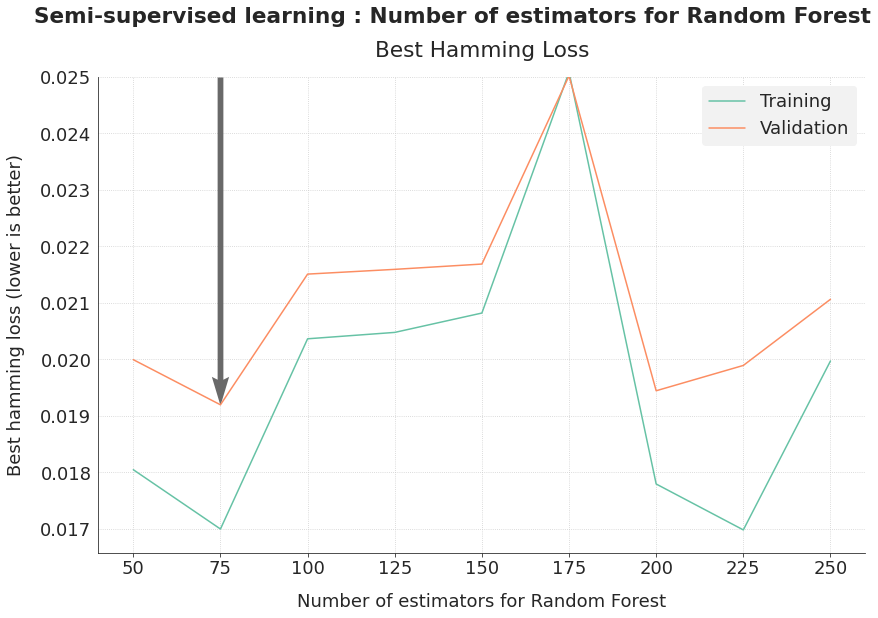

In [ ]:
fig, ax = graph_analysis(rf_parameters, "n_estimators",
                         "Number of estimators for Random Forest",
                         "Semi-supervised learning", ymax=0.025)

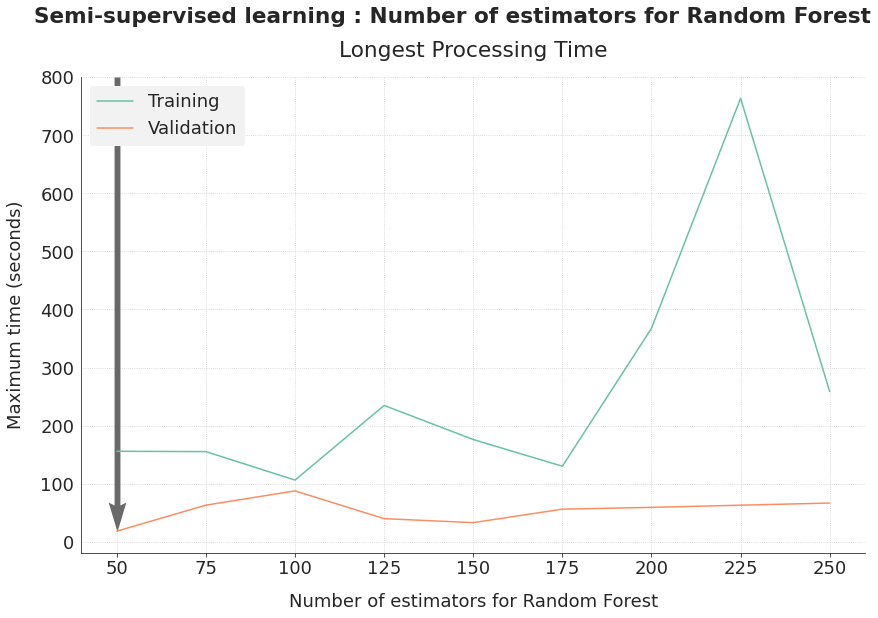

In [ ]:
fig, ax = graph_analysis(rf_parameters, "n_estimators",
                         "Number of estimators for Random Forest",
                         "Semi-supervised learning", show_time=True)

I begin the tests with 75 estimators.

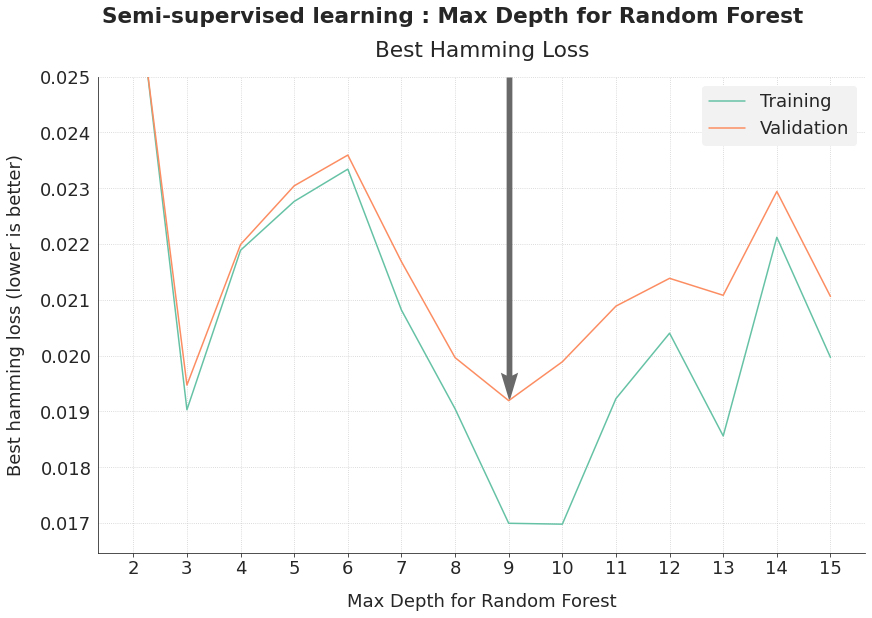

In [ ]:
fig, ax = graph_analysis(rf_parameters, "max_depth",
                         "Max Depth for Random Forest",
                         "Semi-supervised learning", ymax=0.025)

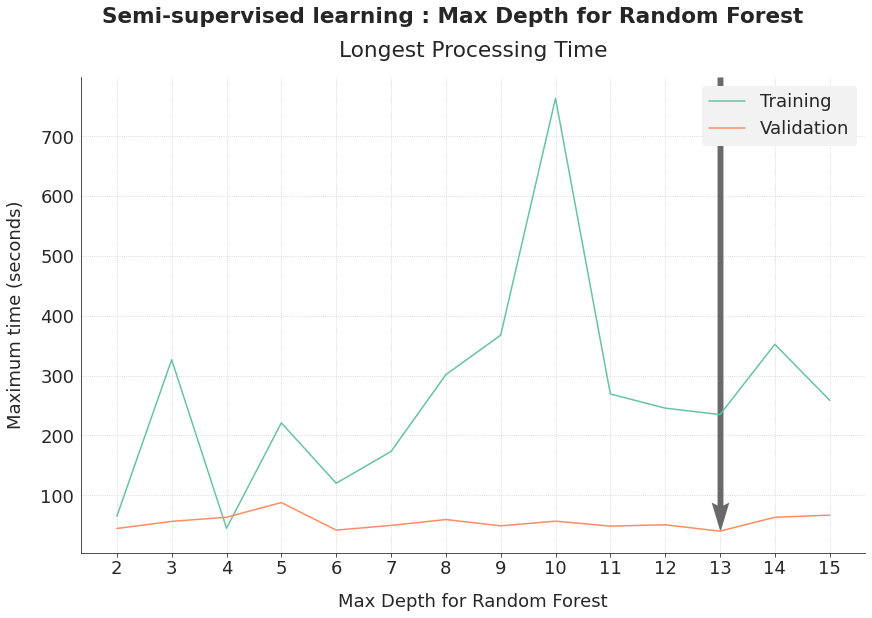

In [ ]:
fig, ax = graph_analysis(rf_parameters, "max_depth",
                         "Max Depth for Random Forest",
                         "Semi-supervised learning", show_time=True)

I keep the same range of max_depth.

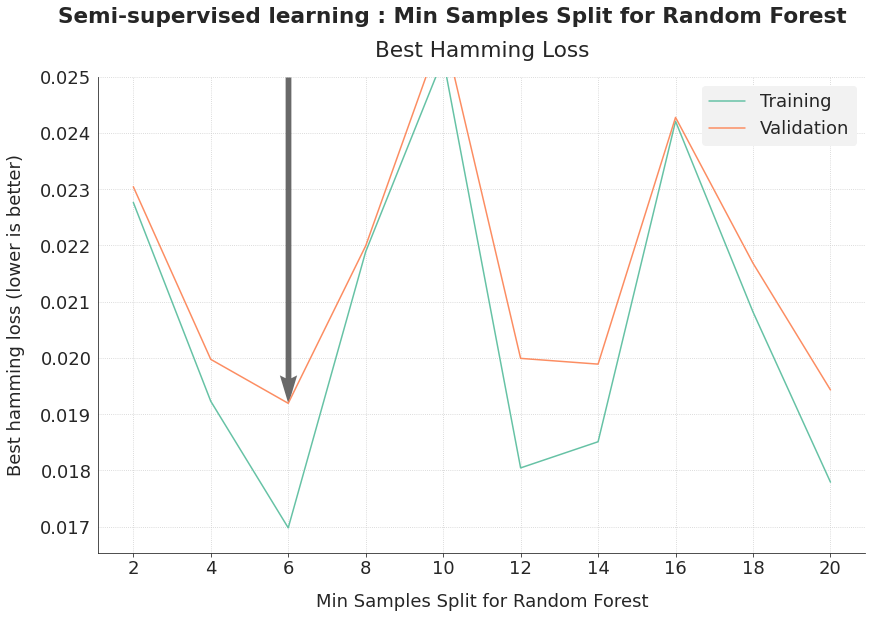

In [ ]:
fig, ax = graph_analysis(rf_parameters, "min_samples_split",
                         "Min Samples Split for Random Forest",
                         "Semi-supervised learning", ymax=0.025)

I extend the range of Min Samples Split up to 30.

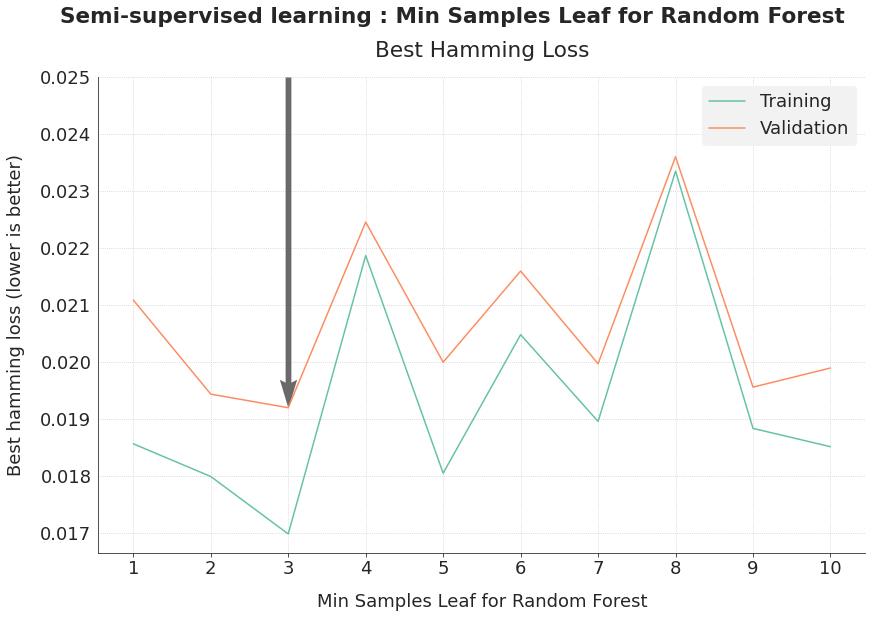

In [ ]:
fig, ax = graph_analysis(rf_parameters, "min_samples_leaf",
                         "Min Samples Leaf for Random Forest",
                         "Semi-supervised learning", ymax=0.025)

I keep the same range for min samples leaf.

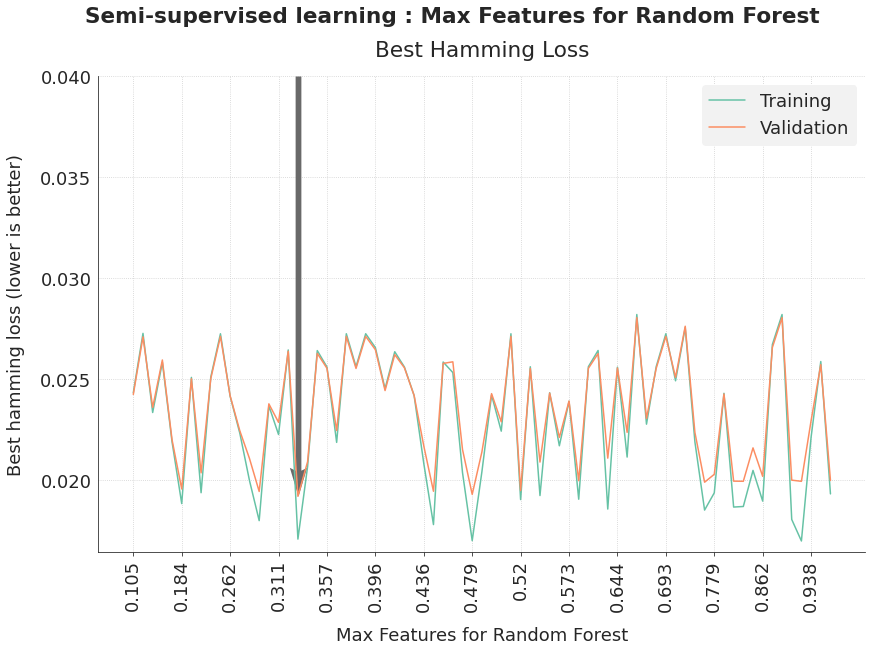

In [ ]:
fig, ax = graph_analysis(rf_parameters, "max_features",
                         "Max Features for Random Forest",
                         "Semi-supervised learning", ymax=0.04,
                         tick_step=5, rotation=90)

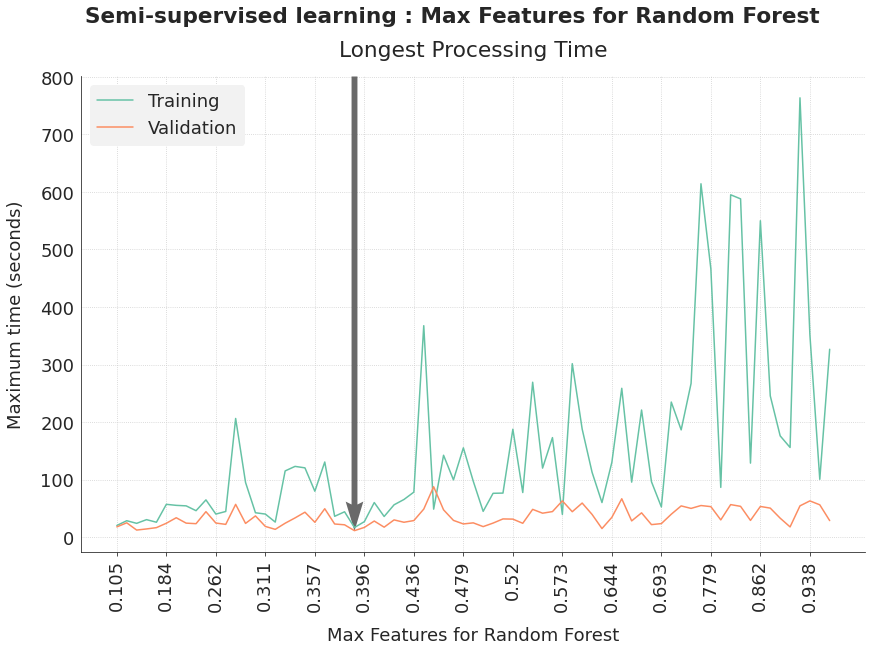

In [ ]:
fig, ax = graph_analysis(rf_parameters, "max_features",
                         "Max Features for Random Forest",
                         "Semi-supervised learning", show_time=True,
                         tick_step=5, rotation=90)

I keep the same range for max features, whose value doesn't seem very critical for the performance.

<a id="4_3"></a>

### 4.3. Model based on ML-kNN

In [ ]:
X_mlknn, y_mlknn, _, _ = \
    iterative_train_test_split(X_mini.values, 
                               y_mini.values, 
                               test_size=0.5)
X_mlknn = pd.DataFrame(X_mlknn, columns=X_mini.columns)
y_mlknn = pd.DataFrame(y_mlknn, columns=y_mini.columns)

In [ ]:
def run_mlknn(csv_file, max_evals=100):
    global OUT_FILE
    OUT_FILE = csv_file
    of_connection = open(OUT_FILE, "w")  # Write the headers to the file
    writer = csv.writer(of_connection)
    writer.writerow(["validation_hamming_loss", "training_hamming_loss",
                     "fit_time", "test_time", "params_data",
                     "params_vectorizer", "params_factorizer",
                     "params_classifier", "iteration"])
    of_connection.close()
    
    global ITERATION
    ITERATION = 0

    trials = Trials()
    
    best_param = fmin(objective_mlknn, space_mlknn,
                      algo=tpe.suggest, trials=trials,
                      max_evals=max_evals, rstate=np.random.RandomState(42))
    
    list_losses = [t["result"]["loss"] for t in trials.trials]
    idx_min = np.argmin(list_losses)

    print("Hyperparameters optimization done")
    print("Best hamming loss = {}"\
          .format(trials.trials[idx_min]["result"]["loss"]))
    print("Fit time = {}"\
          .format(trials.trials[idx_min]["result"]["fit_time"]))
    print("Test time = {}"\
          .format(trials.trials[idx_min]["result"]["test_time"]))
    print("Best hamming loss obtained after {} iterations"\
          .format(trials.trials[idx_min]["result"]["iteration"]))
    print("")

In [ ]:
def objective_mlknn(params):
    global ITERATION, OUT_FILE
    ITERATION += 1

    params_data = params.get("data")
    params_vect = params.get("vectorizer")
    params_fact = params.get("factorizer")
    params_model = params.get("model")
    
    t_vect = params_vect["type"]
    del params_vect["type"]
    if t_vect == "bow":
        vectorizer = CountVectorizer(token_pattern=my_regex,
                                     stop_words=full_stop_words)
    elif t_vect == "tfidf":
        vectorizer = TfidfVectorizer(token_pattern=my_regex,
                                     stop_words=full_stop_words)
    else:
        return 0
    vectorizer.set_params(**params_vect)

    t_fact = params_fact["type"]
    del params_fact["type"]
    if t_fact == "lda":
        factorizer = LatentDirichletAllocation(n_jobs=-1, random_state=42)
    elif t_fact == "nmf":
        factorizer = NMF(random_state=42)
    else:
        return 0
    factorizer.set_params(**params_fact)

    clf = MLkNN()
    clf.set_params(**params_model)
    
    my_pipeline = Pipeline([
        ("vectorizer", vectorizer),
        ("factorizer", factorizer),
        ("scaler", StandardScaler()),
        ("classifier", clf)])

    start_time = timer()
    my_pipeline.fit(X_mlknn[params_data], y_mlknn.values)
    fit_time = timer() - start_time
    train_predict = my_pipeline.predict(X_mlknn[params_data])
    train_score = hamming_loss(y_mlknn, train_predict)
    
    start_time = timer()
    valid_predict = my_pipeline.predict(X_valid[params_data])
    test_time = timer() - start_time
    valid_score = hamming_loss(y_valid, valid_predict)

    params_vect["vectorizer"] = t_vect
    params_fact["factorizer"] = t_fact
    of_connection = open(OUT_FILE, 'a')
    writer = csv.writer(of_connection)
    writer.writerow([valid_score, train_score, fit_time, test_time,
                     params_data, params_vect, params_fact,
                     params_model, ITERATION])
    of_connection.close()
    
    return {"loss": valid_score, "train_score": train_score,
            "fit_time": fit_time, "test_time": test_time,
            "params": params, "iteration": ITERATION, "status": STATUS_OK}

In [ ]:
space_mlknn = {
    "data": hp.choice("data", ["body", "title", "both"]),
    "vectorizer": hp.choice("vectorizer_type", [
        {"type": "bow",
         "ngram_range": hp.choice("bow_ngrams", [(1, 1), (1, 2), (1, 3)]),
         "min_df": hp.uniform("bow_mindf", 0.005, 0.05),
         "max_df": hp.uniform("bow_maxdf", 0.90, 0.99)},
        {"type": "tfidf",
         "ngram_range": hp.choice("tfidf_ngrams", [(1, 1), (1, 2), (1, 3)]),
         "min_df": hp.uniform("tfidf_mindf", 0.005, 0.05),
         "max_df": hp.uniform("tfidf_maxdf", 0.90, 0.99)}
        ]),
    "factorizer": hp.choice("factorizer_type", [
        {"type": "lda",
         "n_components":
            hp.choice("lda_topics", np.arange(15, 51, 5, dtype=int)),
         "doc_topic_prior":
            hp.loguniform("lda_alpha", np.log(0.001), np.log(100)),
         "topic_word_prior":
            hp.loguniform("lda_beta", np.log(0.001), np.log(100))},
        {"type": "nmf",
         "n_components":
            hp.choice("nmf_topics", np.arange(15, 51, 5, dtype=int))}
        ]),
    "model": {"k": hp.choice("knn_k", np.arange(3, 30, 2, dtype=int)),
              "s": hp.uniform("knn_s", 0, 1)}}

In [ ]:
mlknn_file = "hyperopt_mlknn.csv"
run_mlknn(mlknn_file, max_evals=100)

100%|██████████| 100/100 [4:08:26<00:00, 149.07s/it, best loss: 0.02231597705281916]
Hyperparameters optimization done
Best hamming loss = 0.02231597705281916
Fit time = 15.548976231999973
Test time = 113.78091921800001
Best hamming loss obtained after 2 iterations



Multi-label kNN gets a best hamming loss of 0.0223. This is a worse hamming loss than using a Classifier chain with a random forest model.  
So, I focus on the Random Forest classification used together with Classifier Chain.

<a id="4_4"></a>

### 4.4 Fine tuning of the Random Forest model

To speed up the calculation time, I keep only 50% of X_mini data in a dataframe called X_rf. The validation is still done on the same X_valid data. So only fitting is impacted.

In [ ]:
X_rf, y_rf, _, _ = \
    iterative_train_test_split(X_mini.values, 
                               y_mini.values, 
                               test_size=0.5)
X_rf = pd.DataFrame(X_rf, columns=X_mini.columns)
y_rf = pd.DataFrame(y_rf, columns=y_mini.columns)

In [ ]:
def run_semirf(fact_file, max_evals=100):
    global OUT_FILE
    OUT_FILE = fact_file
    of_connection = open(OUT_FILE, "w")  # Write the headers to the file
    writer = csv.writer(of_connection)
    writer.writerow(["validation_hamming_loss", "training_hamming_loss",
                     "fit_time", "test_time", "params_data",
                     "params_vectorizer", "params_factorizer",
                     "params_classifier", "iteration"])
    of_connection.close()
    
    global ITERATION
    ITERATION = 0

    trials = Trials()
    
    best_param = fmin(objective_semirf, space_semirf,
                      algo=tpe.suggest, trials=trials,
                      max_evals=max_evals, rstate=np.random.RandomState(42))
    
    list_losses = [t["result"]["loss"] for t in trials.trials]
    idx_min = np.argmin(list_losses)

    print("Hyperparameters optimization done")
    print("Best hamming loss = {}"\
          .format(trials.trials[idx_min]["result"]["loss"]))
    print("Fit time = {}"\
          .format(trials.trials[idx_min]["result"]["fit_time"]))
    print("Test time = {}"\
          .format(trials.trials[idx_min]["result"]["test_time"]))
    print("Best hamming loss obtained after {} iterations"\
          .format(trials.trials[idx_min]["result"]["iteration"]))
    print("")

In [ ]:
def objective_semirf(params):
    global ITERATION, OUT_FILE
    ITERATION += 1

    params_vect = params.get("vectorizer")
    params_fact = params.get("factorizer")
    params_model = params.get("model")
    
    t_vect = params_vect["type"]
    del params_vect["type"]
    if t_vect == "bow":
        vectorizer = CountVectorizer(token_pattern=my_regex,
                                     stop_words=full_stop_words)
    elif t_vect == "tfidf":
        vectorizer = TfidfVectorizer(token_pattern=my_regex,
                                     stop_words=full_stop_words)
    else:
        return 0
    vectorizer.set_params(**params_vect)
    params_vect["vectorizer"] = t_vect

    factorizer = NMF(random_state=42)
    factorizer.set_params(**params_fact)
    params_fact["factorizer"] = "nmf"

    model = RandomForestClassifier(n_jobs=-1, random_state=42)
    model.set_params(**params_model)
    params_model["multi"] = "ClassifierChain"
    params_model["classifier"] = "random_forest"
    clf = ClassifierChain(model)
    
    my_pipeline = Pipeline([
        ("vect", vectorizer),
        ("nmf", factorizer),
        ("scaler", StandardScaler()),
        ("clf", clf)])
    
    start_time = timer()
    my_pipeline.fit(X_rf.title, y_rf)
    fit_time = timer() - start_time
    train_predict = my_pipeline.predict(X_rf.title)
    train_score = hamming_loss(y_rf, train_predict)
    
    start_time = timer()
    valid_predict = my_pipeline.predict(X_valid.title)
    test_time = timer() - start_time
    valid_score = hamming_loss(y_valid, valid_predict)

    of_connection = open(OUT_FILE, 'a')
    writer = csv.writer(of_connection)
    writer.writerow([valid_score, train_score, fit_time, test_time,
                     "title", params_vect, params_fact,
                     params_model, ITERATION])
    of_connection.close()
    
    return {"loss": valid_score, "train_score": train_score,
            "fit_time": fit_time, "test_time": test_time,
            "params": params, "iteration": ITERATION, "status": STATUS_OK}

In [ ]:
space_semirf = {
    "vectorizer": hp.choice("vectorizer_type", [
        {"type": "bow",
         "ngram_range": hp.choice("bow_ngrams", [(1, 1), (1, 2), (1, 3)]),
         "min_df": hp.uniform("bow_mindf", 0.001, 0.01),
         "max_df": hp.uniform("bow_maxdf", 0.95, 0.98)},
        {"type": "tfidf",
         "ngram_range": hp.choice("tfidf_ngrams", [(1, 1), (1, 2), (1, 3)]),
         "min_df": hp.uniform("tfidf_mindf", 0.001, 0.01),
         "max_df": hp.uniform("tfidf_maxdf", 0.95, 0.98)}
        ]),
    "factorizer":
        {"n_components":
            hp.choice("nmf_topics", np.arange(30, 100, 5, dtype=int))},
    "model":
        {"n_estimators": 75,
         "max_depth": hp.choice("rf_max_depth", np.arange(2, 16, 1, dtype=int)),
         "min_samples_split":
            hp.choice("rf_min_samples_split", np.arange(2, 31, 2, dtype=int)),
         "min_samples_leaf":
            hp.choice("rf_min_samples_leaf", np.arange(1, 11, 1, dtype=int)),
         "max_features": hp.uniform("rf_max_features", 0.1, 1.0)}
}

In [ ]:
semirf_file = "hyperopt_semi_rf.csv"
run_semirf(semirf_file, max_evals=200)

100%|██████████| 200/200 [6:51:54<00:00, 123.57s/it, best loss: 0.018503118503118504]
Hyperparameters optimization done
Best hamming loss = 0.018503118503118504
Fit time = 143.64724834200024
Test time = 23.98357576499984
Best hamming loss obtained after 100 iterations



In [ ]:
essai = pd.read_csv("hyperopt_semi_rf.csv")
essai.head()

,validation_hamming_loss,training_hamming_loss,fit_time,test_time,params_data,params_vectorizer,params_factorizer,params_classifier,iteration
0,0.020463,0.019792,58.417112,17.883097,title,"{'max_df': 0.9520715402262081, 'min_df': 0.008...","{'n_components': 45, 'factorizer': 'nmf'}","{'max_depth': 10, 'max_features': 0.5366684736...",1
1,0.019149,0.016035,216.981613,19.016824,title,"{'max_df': 0.9792402789036031, 'min_df': 0.001...","{'n_components': 55, 'factorizer': 'nmf'}","{'max_depth': 11, 'max_features': 0.8707348588...",2
2,0.020655,0.019399,63.583315,19.275369,title,"{'max_df': 0.9518693882253221, 'min_df': 0.008...","{'n_components': 80, 'factorizer': 'nmf'}","{'max_depth': 11, 'max_features': 0.6739741837...",3
3,0.019222,0.017152,136.259121,19.987758,title,"{'max_df': 0.9636099603141889, 'min_df': 0.002...","{'n_components': 50, 'factorizer': 'nmf'}","{'max_depth': 14, 'max_features': 0.5688050821...",4
4,0.019862,0.018974,38.215319,14.406427,title,"{'max_df': 0.9679414123253638, 'min_df': 0.002...","{'n_components': 65, 'factorizer': 'nmf'}","{'max_depth': 5, 'max_features': 0.18691301409...",5


In [ ]:
semi_rf = get_semirf_summary("hyperopt_semi_rf.csv")
semi_rf.sort_values(by="validation_hamming_loss").head(10)

,validation_hamming_loss,training_hamming_loss,fit_time,test_time,iteration,vectorizer,vectorizer_maxdf,vectorizer_mindf,vectorizer_ngrams,factorizer,factorizer_ntopics,multi,classifier,rf_n_estimators,rf_max_depth,rf_min_samples_leaf,rf_min_samples_split,rf_max_features
99,0.018503,0.015792,143.647248,23.983576,100,bow,0.968,0.003,"(1, 1)",nmf,90,ClassifierChain,random_forest,75,15,5,6,0.391
96,0.018504,0.015223,191.397816,22.984611,97,bow,0.962,0.002,"(1, 1)",nmf,90,ClassifierChain,random_forest,75,15,5,6,0.464
147,0.018523,0.015972,144.731810,23.759789,148,bow,0.969,0.003,"(1, 1)",nmf,90,ClassifierChain,random_forest,75,12,5,6,0.455
28,0.018525,0.016758,162.398345,22.865976,29,bow,0.967,0.003,"(1, 1)",nmf,90,ClassifierChain,random_forest,75,15,6,22,0.472
95,0.018525,0.015402,158.797230,21.528495,96,bow,0.965,0.002,"(1, 1)",nmf,90,ClassifierChain,random_forest,75,12,5,6,0.461
145,0.018525,0.015648,150.751990,21.118700,146,bow,0.962,0.002,"(1, 1)",nmf,90,ClassifierChain,random_forest,75,12,5,6,0.448
110,0.018530,0.015849,179.892311,21.550836,111,bow,0.969,0.002,"(1, 1)",nmf,90,ClassifierChain,random_forest,75,13,5,14,0.527
148,0.018531,0.016170,111.797487,21.238948,149,bow,0.972,0.003,"(1, 1)",nmf,90,ClassifierChain,random_forest,75,12,5,6,0.339
66,0.018537,0.015581,152.950747,21.110885,67,tfidf,0.961,0.001,"(1, 2)",nmf,95,ClassifierChain,random_forest,75,8,3,12,0.563
150,0.018546,0.016205,112.055225,20.565374,151,bow,0.969,0.003,"(1, 1)",nmf,90,ClassifierChain,random_forest,75,11,5,6,0.370


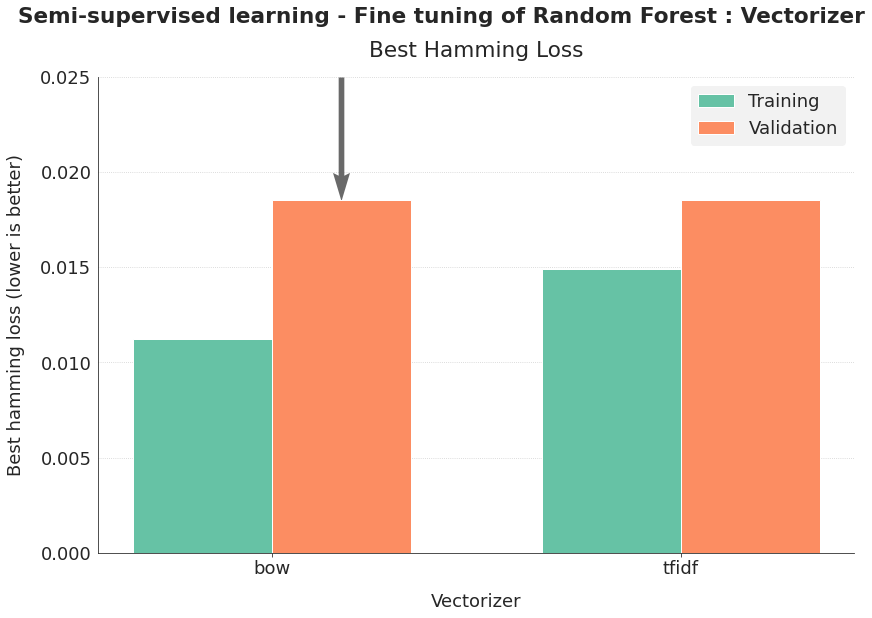

In [ ]:
fig, ax = graph_analysis(semi_rf, "vectorizer", "Vectorizer",
                         "Semi-supervised learning - Fine tuning of Random Forest",
                         isbar=True, ymax=0.025)

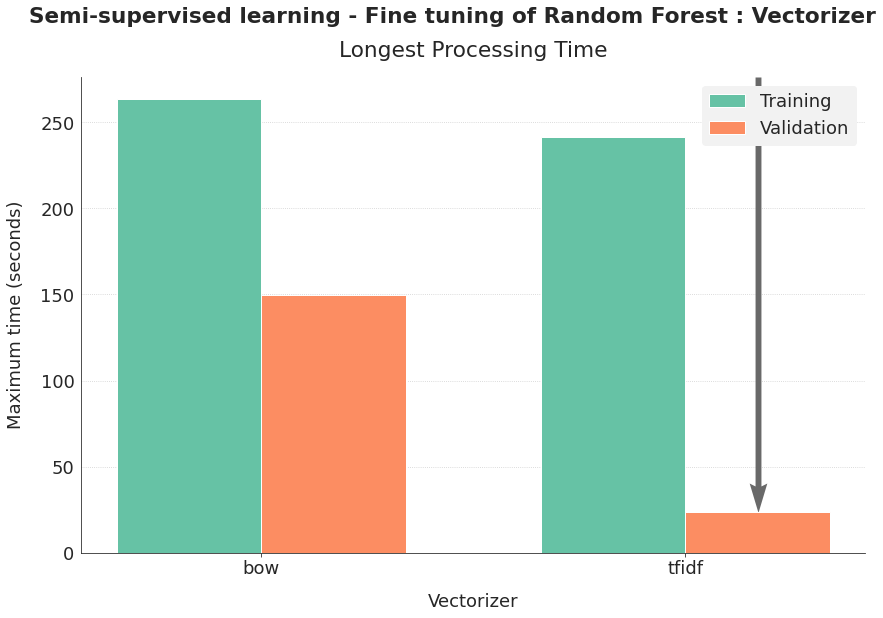

In [ ]:
fig, ax = graph_analysis(semi_rf, "vectorizer", "Vectorizer",
                         "Semi-supervised learning - Fine tuning of Random Forest",
                         isbar=True, show_time=True)

Best results are obtained with Bag of Words.  
The results based on Bag of Words and TF-IDF seem to be very close, but the processing time is faster with TF-IDF and TF-IFD suffers less from overfitting. So it is interesting to compare their performance.

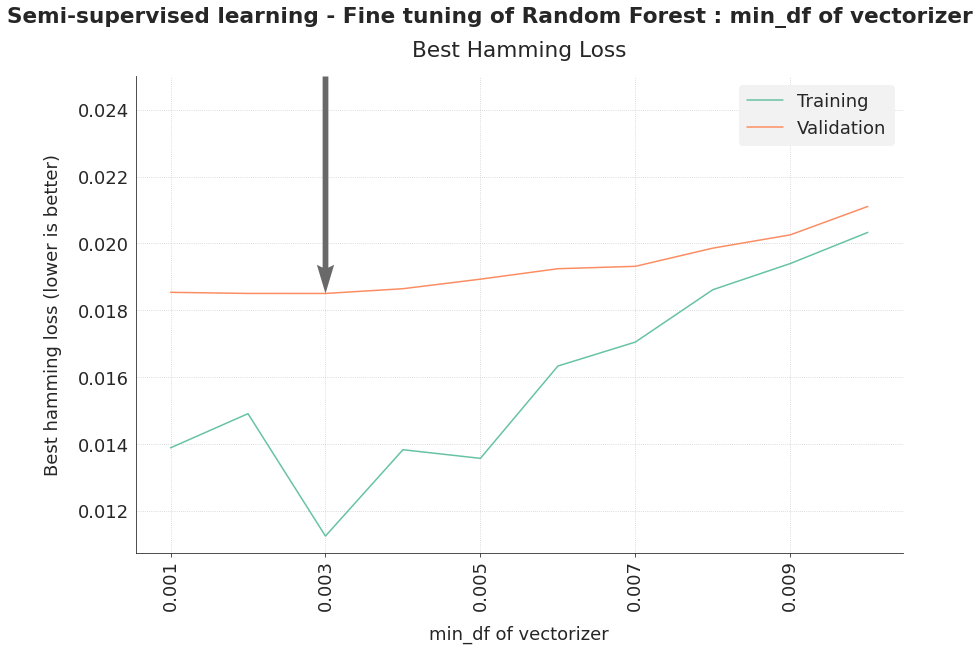

In [ ]:
fig, ax = graph_analysis(semi_rf, "vectorizer_mindf", "min_df of vectorizer",
                         "Semi-supervised learning - Fine tuning of Random Forest",
                         tick_step=2, rotation=90, ymax=0.025)

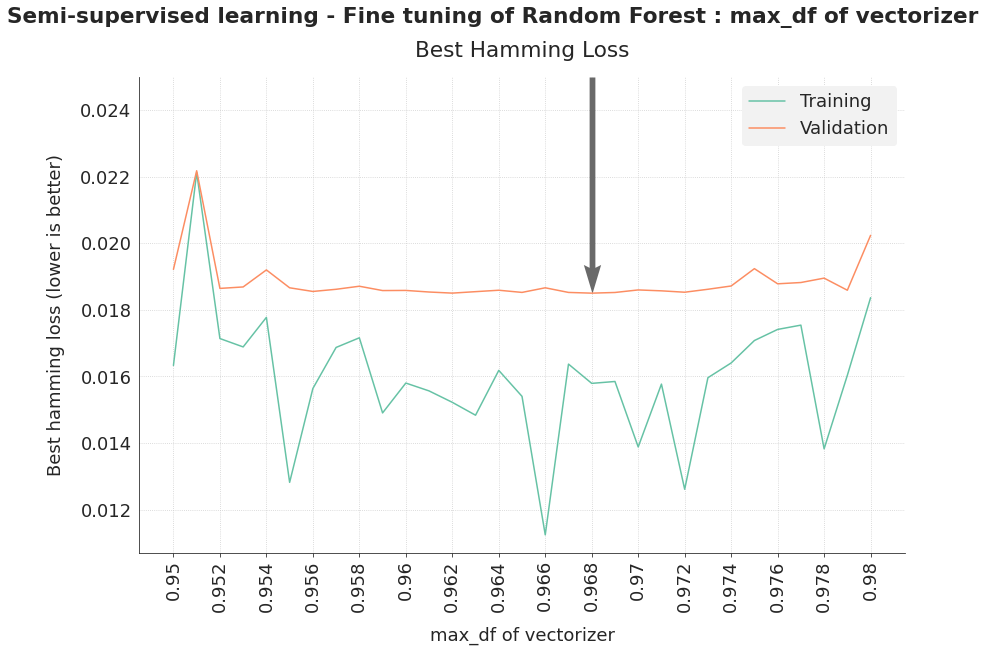

In [ ]:
fig, ax = graph_analysis(semi_rf, "vectorizer_maxdf", "max_df of vectorizer",
                         "Semi-supervised learning - Fine tuning of Random Forest",
                         tick_step=2, rotation=90, ymax=0.025)

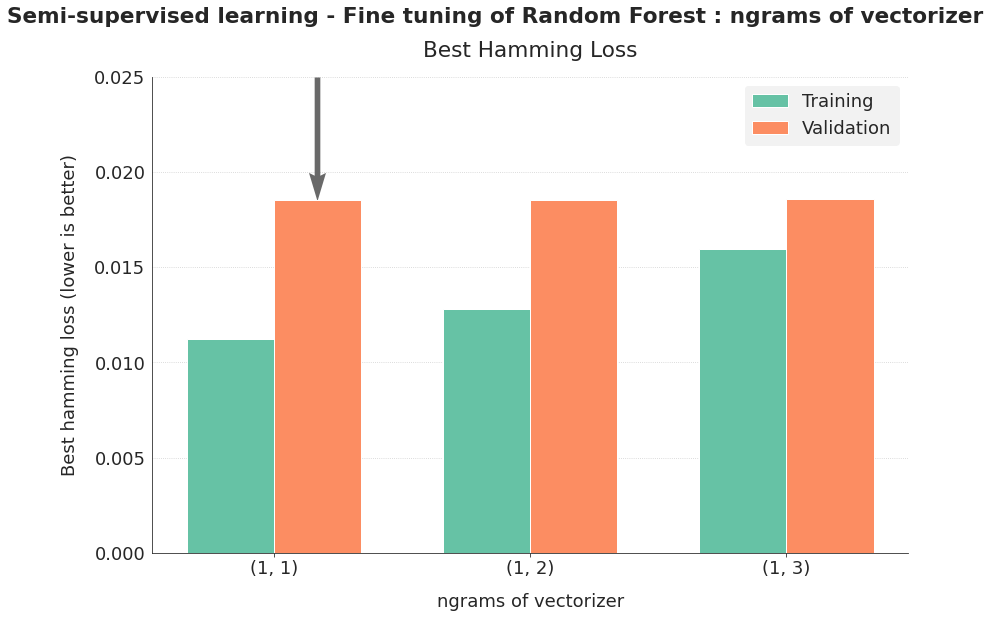

In [ ]:
fig, ax = graph_analysis(semi_rf, "vectorizer_ngrams", "ngrams of vectorizer",
                         "Semi-supervised learning - Fine tuning of Random Forest",
                         isbar=True, ymax=0.025)

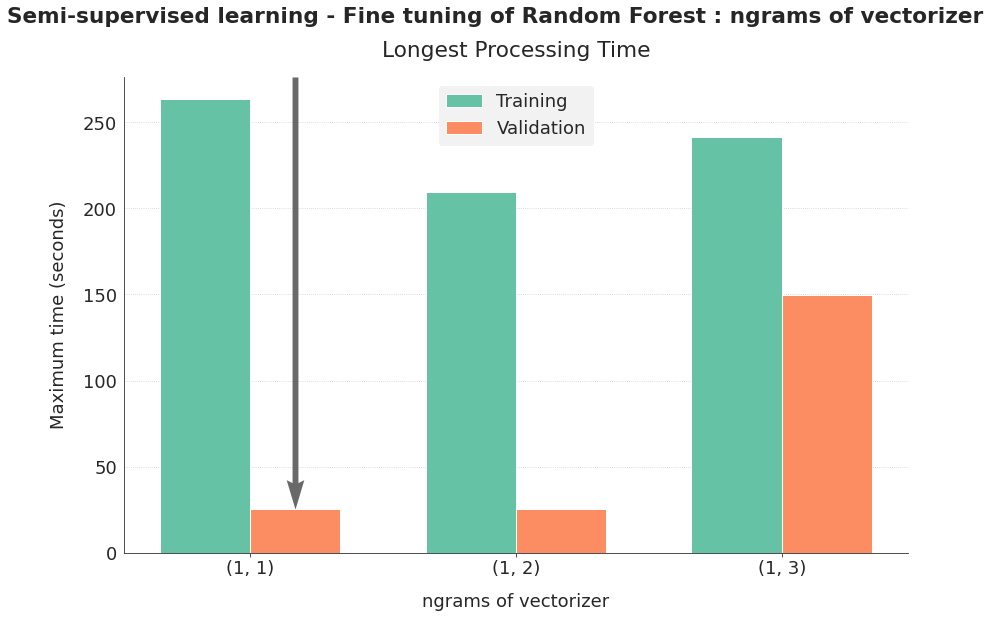

In [ ]:
fig, ax = graph_analysis(semi_rf, "vectorizer_ngrams", "ngrams of vectorizer",
                         "Semi-supervised learning - Fine tuning of Random Forest",
                         isbar=True, show_time=True)

Adding bigrams and trigrams doesn't improve the performance and doesn't seem to directly impact the processing time. However, it limits the overfitting of the model. So it is interesting to compare the 

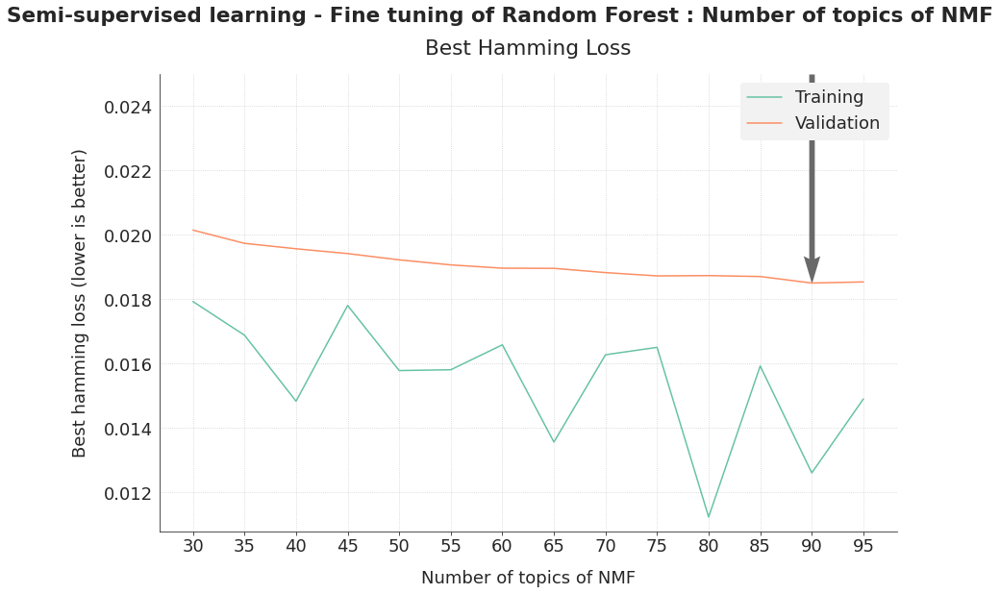

In [ ]:
fig, ax = graph_analysis(semi_rf, "factorizer_ntopics", "Number of topics of NMF",
                         "Semi-supervised learning - Fine tuning of Random Forest",
                         ymax=0.025)

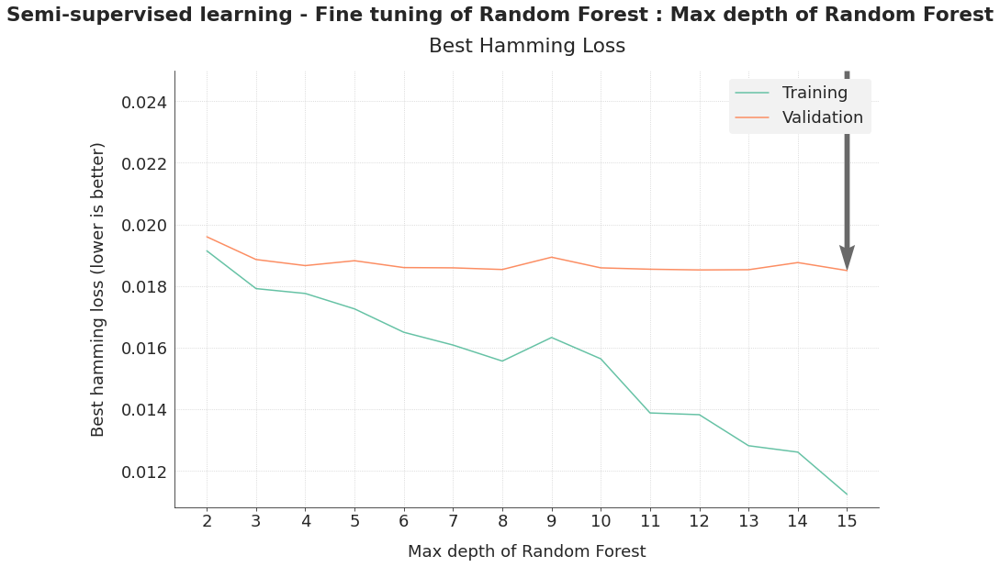

In [ ]:
fig, ax = graph_analysis(semi_rf, "rf_max_depth", "Max depth of Random Forest",
                         "Semi-supervised learning - Fine tuning of Random Forest",
                         ymax=0.025)

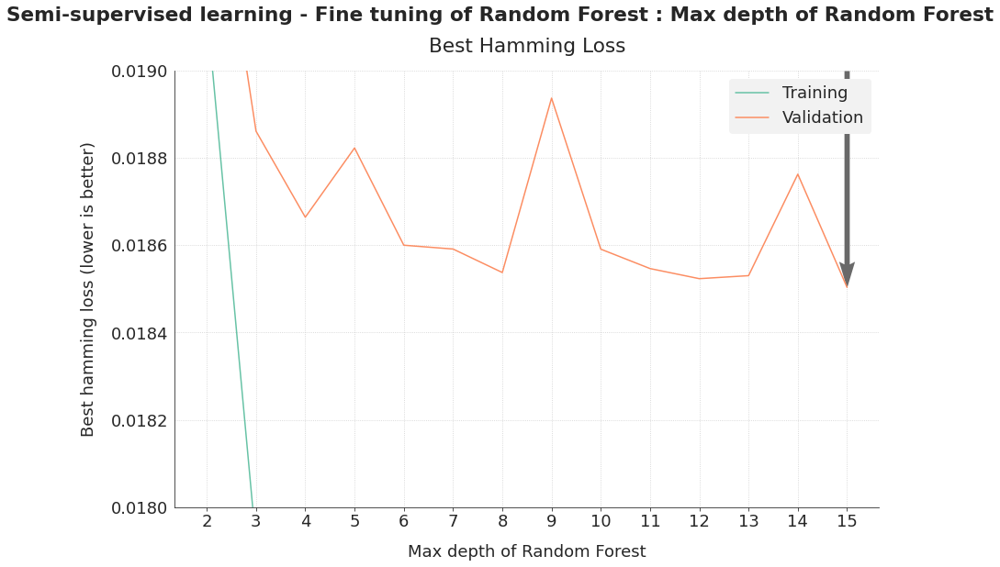

In [ ]:
fig, ax = graph_analysis(semi_rf, "rf_max_depth", "Max depth of Random Forest",
                         "Semi-supervised learning - Fine tuning of Random Forest",
                         ymin=0.018, ymax=0.019)

A max depth of 15 gets the best performance. However, a very close performance with a lower overfitting can be get with a setting of 12 or even 8. 

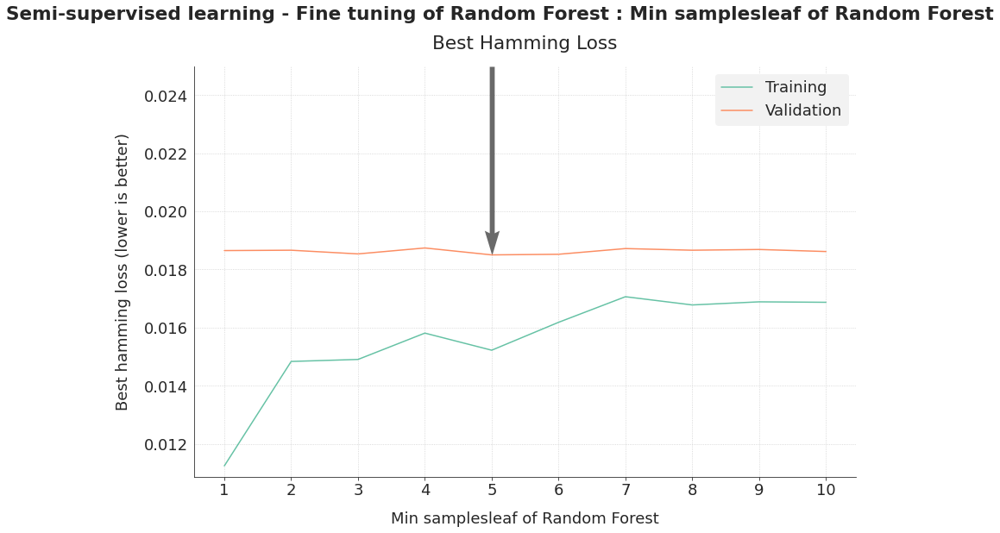

In [ ]:
fig, ax = graph_analysis(semi_rf, "rf_min_samples_leaf", "Min samples leaf of Random Forest",
                         "Semi-supervised learning - Fine tuning of Random Forest",
                         ymax=0.025)

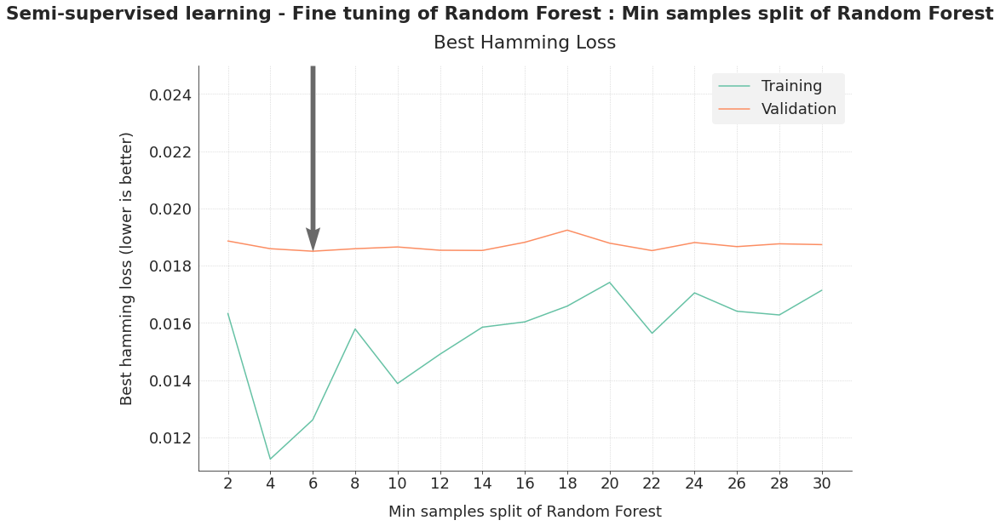

In [ ]:
fig, ax = graph_analysis(semi_rf, "rf_min_samples_split", "Min samples split of Random Forest",
                         "Semi-supervised learning - Fine tuning of Random Forest",
                         ymax=0.025)

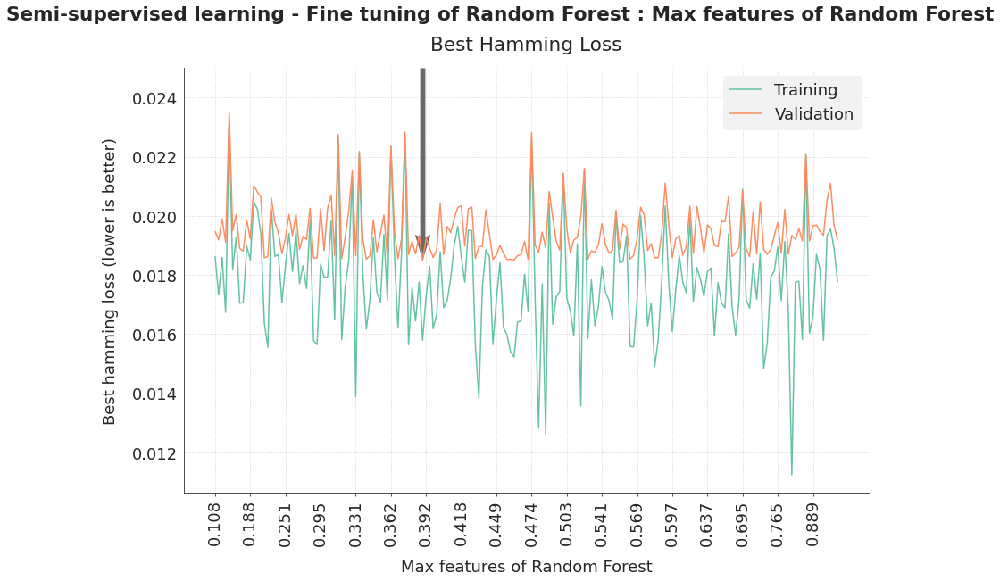

In [ ]:
fig, ax = graph_analysis(semi_rf, "rf_max_features", "Max features of Random Forest",
                         "Semi-supervised learning - Fine tuning of Random Forest",
                         ymax=0.025, tick_step=10, rotation=90)

rf_min_samples_leaf optimal value is 5, together with a rf_min_samples_split of 6.  
The value of max features doesn't seem really important. I opt for 0.4 (40%), close to the optimal value hyperopt found.

<a id="4_5"></a>

### 4.5. Performance analysis of the best model

I look at the performance of the optimal model. Then I run comparison by changing BOW by TF-IDF, the ngram range and the max depth. Finally I put all together, according to my observations.

In [ ]:
vectorizer = CountVectorizer(token_pattern=my_regex,
                             stop_words=full_stop_words,
                             min_df=0.003, max_df=0.968, ngram_range=(1,1))
factorizer = NMF(n_components=90, random_state=42)
model = RandomForestClassifier(n_estimators=75, max_depth=15,
                               min_samples_leaf=5, min_samples_split=6,
                               max_features=0.4, n_jobs=-1, random_state=42)
clf = ClassifierChain(model)
clf_pipeline = Pipeline([("vect", vectorizer),
                        ("nmf", factorizer),
                        ("scaler", StandardScaler()),
                        ("clf", clf)])

In [ ]:
clf_pipeline.fit(X_mini.title, y_mini)
predict_train = clf_pipeline.predict(X_mini.title)
predict_valid = clf_pipeline.predict(X_valid.title)

In [ ]:
print("Logistic training hamming loss = {}".format(hamming_loss(y_mini, predict_train)))
print("Logistic validation hamming loss = {}".format(hamming_loss(y_valid, predict_valid)))
print("")
print("Logistic training accuracy score = {}".format(accuracy_score(y_mini, predict_train)))
print("Logistic validation accuracy score = {}".format(accuracy_score(y_valid, predict_valid)))
print("")
print("Logistic training F1 score = {}".format(f1_score(y_mini, predict_train, average="micro")))
print("Logistic validation F1 score = {}".format(f1_score(y_valid, predict_valid, average="micro")))

Logistic training hamming loss = 0.015484834197705485
Logistic validation hamming loss = 0.018337736232473076

Logistic training accuracy score = 0.41843470061291843
Logistic validation accuracy score = 0.3267159582949057

Logistic training F1 score = 0.6357620790358952
Logistic validation F1 score = 0.5565233170023589


I replace BOW by TF-IDF and I look at the results.

In [ ]:
vectorizer = TfidfVectorizer(token_pattern=my_regex,
                             stop_words=full_stop_words,
                             min_df=0.003, max_df=0.968, ngram_range=(1,1))
factorizer = NMF(n_components=90, random_state=42)
model = RandomForestClassifier(n_estimators=75, max_depth=15,
                               min_samples_leaf=5, min_samples_split=6,
                               max_features=0.4, n_jobs=-1, random_state=42)
clf = ClassifierChain(model)
clf_pipeline = Pipeline([("vect", vectorizer),
                        ("nmf", factorizer),
                        ("scaler", StandardScaler()),
                        ("clf", clf)])

In [ ]:
clf_pipeline.fit(X_mini.title, y_mini)
predict_train = clf_pipeline.predict(X_mini.title)
predict_valid = clf_pipeline.predict(X_valid.title)

In [ ]:
print("Logistic training hamming loss = {}".format(hamming_loss(y_mini, predict_train)))
print("Logistic validation hamming loss = {}".format(hamming_loss(y_valid, predict_valid)))
print("")
print("Logistic training accuracy score = {}".format(accuracy_score(y_mini, predict_train)))
print("Logistic validation accuracy score = {}".format(accuracy_score(y_valid, predict_valid)))
print("")
print("Logistic training F1 score = {}".format(f1_score(y_mini, predict_train, average="micro")))
print("Logistic validation F1 score = {}".format(f1_score(y_valid, predict_valid, average="micro")))

Logistic training hamming loss = 0.015594845198805595
Logistic validation hamming loss = 0.018501242711769027

Logistic training accuracy score = 0.4164702184504165
Logistic validation accuracy score = 0.3243399559189033

Logistic training F1 score = 0.6321681432331245
Logistic validation F1 score = 0.5505881638201411


The use of TF-IDF slightly decreases the performance, without impact on overfitting.

Back to the original model (with BOW), I change the value of ngram_range to (1, 3) and I look at the results.

In [ ]:
vectorizer = CountVectorizer(token_pattern=my_regex,
                             stop_words=full_stop_words,
                             min_df=0.003, max_df=0.968, ngram_range=(1,3))
factorizer = NMF(n_components=90, random_state=42)
model = RandomForestClassifier(n_estimators=75, max_depth=15,
                               min_samples_leaf=5, min_samples_split=6,
                               max_features=0.4, n_jobs=-1, random_state=42)
clf = ClassifierChain(model)
clf_pipeline = Pipeline([("vect", vectorizer),
                        ("nmf", factorizer),
                        ("scaler", StandardScaler()),
                        ("clf", clf)])

In [ ]:
clf_pipeline.fit(X_mini.title, y_mini)
predict_train = clf_pipeline.predict(X_mini.title)
predict_valid = clf_pipeline.predict(X_valid.title)

In [ ]:
print("Logistic training hamming loss = {}".format(hamming_loss(y_mini, predict_train)))
print("Logistic validation hamming loss = {}".format(hamming_loss(y_valid, predict_valid)))
print("")
print("Logistic training accuracy score = {}".format(accuracy_score(y_mini, predict_train)))
print("Logistic validation accuracy score = {}".format(accuracy_score(y_valid, predict_valid)))
print("")
print("Logistic training F1 score = {}".format(f1_score(y_mini, predict_train, average="micro")))
print("Logistic validation F1 score = {}".format(f1_score(y_valid, predict_valid, average="micro")))

Logistic training hamming loss = 0.015525695426685526
Logistic validation hamming loss = 0.018368061525956263

Logistic training accuracy score = 0.41772748703441775
Logistic validation accuracy score = 0.3263251684304316

Logistic training F1 score = 0.633934857523993
Logistic validation F1 score = 0.5552956848853667


Same conclusion with ngram_range : changing it doesn't decrease overfitting.

One more time back to the original model (with BOW and without bigrams and trigrams), I change the value of max depth to 12 and then to 8, and I look at the results.

In [ ]:
vectorizer = CountVectorizer(token_pattern=my_regex,
                             stop_words=full_stop_words,
                             min_df=0.003, max_df=0.968, ngram_range=(1,1))
factorizer = NMF(n_components=90, random_state=42)
model = RandomForestClassifier(n_estimators=75, max_depth=12,
                               min_samples_leaf=5, min_samples_split=6,
                               max_features=0.4, n_jobs=-1, random_state=42)
clf = ClassifierChain(model)
clf_pipeline = Pipeline([("vect", vectorizer),
                        ("nmf", factorizer),
                        ("scaler", StandardScaler()),
                        ("clf", clf)])

In [ ]:
clf_pipeline.fit(X_mini.title, y_mini)
predict_train = clf_pipeline.predict(X_mini.title)
predict_valid = clf_pipeline.predict(X_valid.title)

In [ ]:
print("Logistic training hamming loss = {}".format(hamming_loss(y_mini, predict_train)))
print("Logistic validation hamming loss = {}".format(hamming_loss(y_valid, predict_valid)))
print("")
print("Logistic training accuracy score = {}".format(accuracy_score(y_mini, predict_train)))
print("Logistic validation accuracy score = {}".format(accuracy_score(y_valid, predict_valid)))
print("")
print("Logistic training F1 score = {}".format(f1_score(y_mini, predict_train, average="micro")))
print("Logistic validation F1 score = {}".format(f1_score(y_valid, predict_valid, average="micro")))

Logistic training hamming loss = 0.015747289014615747
Logistic validation hamming loss = 0.018348990980569926

Logistic training accuracy score = 0.4093195033789093
Logistic validation accuracy score = 0.3263251684304316

Logistic training F1 score = 0.6272044050896645
Logistic validation F1 score = 0.5556935002800951


In [ ]:
vectorizer = CountVectorizer(token_pattern=my_regex,
                             stop_words=full_stop_words,
                             min_df=0.003, max_df=0.968, ngram_range=(1,1))
factorizer = NMF(n_components=90, random_state=42)
model = RandomForestClassifier(n_estimators=75, max_depth=8,
                               min_samples_leaf=5, min_samples_split=6,
                               max_features=0.4, n_jobs=-1, random_state=42)
clf = ClassifierChain(model)
clf_pipeline = Pipeline([("vect", vectorizer),
                        ("nmf", factorizer),
                        ("scaler", StandardScaler()),
                        ("clf", clf)])

In [ ]:
clf_pipeline.fit(X_mini.title, y_mini)
predict_train = clf_pipeline.predict(X_mini.title)
predict_valid = clf_pipeline.predict(X_valid.title)

In [ ]:
print("Logistic training hamming loss = {}".format(hamming_loss(y_mini, predict_train)))
print("Logistic validation hamming loss = {}".format(hamming_loss(y_valid, predict_valid)))
print("")
print("Logistic training accuracy score = {}".format(accuracy_score(y_mini, predict_train)))
print("Logistic validation accuracy score = {}".format(accuracy_score(y_valid, predict_valid)))
print("")
print("Logistic training F1 score = {}".format(f1_score(y_mini, predict_train, average="micro")))
print("Logistic validation F1 score = {}".format(f1_score(y_valid, predict_valid, average="micro")))

Logistic training hamming loss = 0.01637120854942637
Logistic validation hamming loss = 0.018331796226533068

Logistic training accuracy score = 0.3874744617318875
Logistic validation accuracy score = 0.3251059040532725

Logistic training F1 score = 0.6062667724987716
Logistic validation F1 score = 0.5515643282680351


Decreasing max_depth to 8 doesn't impact the validation hamming loss but decreases the overfitting.  
The limitation of overfitting, that let us predict a better generalization, is at the reasonable price of a very small decrease in validation accuracy and F1 score.  
I look at the summary of the performance measures of this model with max_depth set to 8.

In [ ]:
train_hamming = hamming_loss(y_mini, predict_train)
valid_hamming = hamming_loss(y_valid, predict_valid)
train_accuracy = accuracy_score(y_mini, predict_train)
valid_accuracy = accuracy_score(y_valid, predict_valid)
train_f1_micro = f1_score(y_mini, predict_train, average="micro")
valid_f1_micro = f1_score(y_valid, predict_valid, average="micro")
train_f1_macro = f1_score(y_mini, predict_train, average="macro")
valid_f1_macro = f1_score(y_valid, predict_valid, average="macro")
train_f1_macroweighted = f1_score(y_mini, predict_train, average="weighted")
valid_f1_macroweighted = f1_score(y_valid, predict_valid, average="weighted")

In [ ]:
print("Training scores :")
print("Hamming loss = {:.4f}".format(train_hamming))
print("Accuracy score = {:.2%}".format(train_accuracy))
print("F1 micro score (overall calculation) = {:.2%}".format(train_f1_micro))
print("F1 macro score (average of f1 score for each label) = {:.2%}".format(train_f1_macro))
print("F1 macro weighted score (weighted average of f1 score for each label) = {:.2%}".format(train_f1_macroweighted))


Training scores :
Hamming loss = 0.0164
Accuracy score = 38.75%
F1 micro score (overall calculation) = 60.63%
F1 macro score (average of f1 score for each label) = 58.66%
F1 macro weighted score (weighted average of f1 score for each label) = 59.28%


In [ ]:
print("Validation scores :")
print("Hamming loss = {:.4f}".format(valid_hamming))
print("Accuracy score = {:.2%}".format(valid_accuracy))
print("F1 micro score (overall calculation) = {:.2%}".format(valid_f1_micro))
print("F1 macro score (average of f1 score for each label) = {:.2%}".format(valid_f1_macro))
print("F1 macro weighted score (weighted average of f1 score for each label) = {:.2%}".format(valid_f1_macroweighted))

Validation scores :
Hamming loss = 0.0183
Accuracy score = 32.51%
F1 micro score (overall calculation) = 55.16%
F1 macro score (average of f1 score for each label) = 52.34%
F1 macro weighted score (weighted average of f1 score for each label) = 53.60%


I have added the calculation of the coherence score of this model at the end of the notebook of part 2. Its coherence score is 50.56%. So the best semi-supervised model is not derived from the best factorization model (from the point of view of coherence score).

---
<a id='5_0'></a>

## <font color=blue>5. Supervised learning models - hyperparameter optimization</font>

For the supervised learning models, I add another vectorization option : the use of sentence embeddings with the Universal Sentence Encoder.

### 5.1. Models based on Binary Relevance or Classifier Chains

In [ ]:
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")
EMBED_BODY = np.array(embed(X_mini.body))
EMBED_TITLE = np.array(embed(X_mini.title))
EMBED_BOTH = np.array(embed(X_mini.both))
SCORE_HAMMING = make_scorer(hamming_loss, greater_is_better=True)

In [ ]:
def run_supervised(fact_file, max_evals=100):
    global OUT_FILE
    OUT_FILE = fact_file
    of_connection = open(OUT_FILE, "w")  # Write the headers to the file
    writer = csv.writer(of_connection)
    writer.writerow(["validation_hamming_loss", "training_hamming_loss",
                     "fit_time", "test_time", "params_data",
                     "params_vectorizer", "params_classifier",
                     "iteration"])
    of_connection.close()
    
    global ITERATION
    ITERATION = 0

    trials = Trials()
    
    best_param = fmin(objective_supervised, space_supervised,
                      algo=tpe.suggest, trials=trials,
                      max_evals=max_evals, rstate=np.random.RandomState(42))
    
    list_losses = [t["result"]["loss"] for t in trials.trials]
    idx_min = np.argmin(list_losses)

    print("Hyperparameters optimization done")
    print("Best hamming loss = {}"\
          .format(trials.trials[idx_min]["result"]["loss"]))
    print("Fit time = {}"\
          .format(trials.trials[idx_min]["result"]["fit_time"]))
    print("Test time = {}"\
          .format(trials.trials[idx_min]["result"]["test_time"]))
    print("Best hamming loss obtained after {} iterations"\
          .format(trials.trials[idx_min]["result"]["iteration"]))
    print("")

In [ ]:
def objective_supervised(params, use_body=EMBED_BODY, use_title=EMBED_TITLE,
                         use_both=EMBED_BOTH, my_score=SCORE_HAMMING):
    global ITERATION, OUT_FILE
    ITERATION += 1
    
    params_data = params.get("data")
    params_vect = params.get("vectorizer")
    params_multi = params.get("classifier")
    params_model = params.get("model")

    t_vect = params_vect["type"]
    del params_vect["type"]
    if t_vect == "bow":
        vectorizer = CountVectorizer(token_pattern=my_regex,
                                     stop_words=full_stop_words)
        vectorizer.set_params(**params_vect)
        X_data = X_mini[params_data]
    elif t_vect == "tfidf":
        vectorizer = TfidfVectorizer(token_pattern=my_regex,
                                     stop_words=full_stop_words)
        vectorizer.set_params(**params_vect)
        X_data = X_mini[params_data]
    elif t_vect == "use":
        if params_data == "body":
            X_data = use_body
        elif params_data == "title":
            X_data = use_title
        elif params_data == "both":
            X_data = use_both
        else:
            return 0
    else:
        return 0
    
    t_model = params_model["type"]
    del params_model["type"]
    if t_model == "logistic_regression":
        model = LogisticRegression(n_jobs=-1)
    elif t_model == "svm":
        model = LinearSVC(random_state=42)
    elif t_model == "naive_bayes":
        model = MultinomialNB()
    else:
        return 0
    model.set_params(**params_model)

    t_multi = params_multi
    if t_multi == "BinaryRelevance":
        clf = BinaryRelevance(model)
    elif t_multi == "ClassifierChain":
        clf = ClassifierChain(model)
    else:
        return 0
    
    if (t_vect == "use") & (t_model == "naive_bayes"):
        valid_score = 1
        train_score = 1
        valid_time = 1000
        train_time = 1000
    else:
        if t_vect == "use":
            my_pipeline = Pipeline([("scaler", StandardScaler()),
                                    ("clf", clf)])
        else:
            my_pipeline = Pipeline([("vectorizer", vectorizer),
                                    ("scaler", StandardScaler(with_mean=False)),
                                    ("clf", clf)])
        myshuffle = IterativeStratification(n_splits=5)
        cv_results = cross_validate(my_pipeline, X_data, y_mini,
                                    cv=myshuffle, scoring=my_score,
                                    return_train_score=True, n_jobs=-1)
        valid_score = cv_results["test_score"].mean()
        train_score = cv_results["train_score"].mean()
        valid_time = cv_results["score_time"].mean()
        train_time = cv_results["fit_time"].mean()

        params_vect["vectorizer"] = t_vect
        params_model["multi"] = t_multi
        params_model["classifier"] = t_model
        of_connection = open(OUT_FILE, 'a')
        writer = csv.writer(of_connection)
        writer.writerow([valid_score, train_score, train_time, valid_time,
                        params_data, params_vect, params_model, ITERATION])
        of_connection.close()
    
    return {"loss": valid_score, "train_score": train_score,
            "fit_time": train_time, "test_time": valid_time,
            "params": params, "iteration": ITERATION, "status": STATUS_OK}

In [ ]:
space_supervised = {
    "data": hp.choice("data", ["body", "title", "both"]),
    "vectorizer": hp.choice("vectorizer_type", [
        {"type": "bow",
         "ngram_range": hp.choice("bow_ngrams", [(1, 1), (1, 2), (1, 3)]),
         "min_df": hp.uniform("bow_mindf", 0.01, 0.05),
         "max_df": hp.uniform("bow_maxdf", 0.95, 0.99)},
        {"type": "tfidf",
         "ngram_range": hp.choice("tfidf_ngrams", [(1, 1), (1, 2), (1, 3)]),
         "min_df": hp.uniform("tfidf_mindf", 0.01, 0.05),
         "max_df": hp.uniform("tfidf_maxdf", 0.95, 0.99)},
        {"type": "use"}
        ]),
    "classifier": hp.choice("multi_type",
                            ["BinaryRelevance", "ClassifierChain"]),
    "model": hp.choice("clf_type", [
        {"type": "logistic_regression",
         "C": hp.loguniform("log_C", np.log(0.01), np.log(100))},
        {"type": "svm",
         "C": hp.loguniform("svm_C", np.log(0.01), np.log(100))},
        {"type": "naive_bayes",
         "alpha": hp.uniform("nb_alpha", 0.0, 2.0)}
        ])}

In [ ]:
supervised_file = "hyperopt_supervised_full.csv"
run_supervised(supervised_file, max_evals=200)

  0%|          | 1/200 [01:11<3:56:33, 71.32s/it, best loss: 0.022633231528764192]

/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning



 15%|█▌        | 30/200 [1:07:20<8:36:47, 182.40s/it, best loss: 0.015138797572282186] 

/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning



100%|██████████| 200/200 [8:11:09<00:00, 147.35s/it, best loss: 0.014963251852389331]
Hyperparameters optimization done
Best hamming loss = 0.014963251852389331
Fit time = 28.234712076187133
Test time = 0.4077460289001465
Best hamming loss obtained after 84 iterations



In [ ]:
supervised_full = get_supervised_summary("hyperopt_supervised_full.csv")
supervised_full.head()

,validation_hamming_loss,training_hamming_loss,fit_time,test_time,iteration,data,vectorizer,vectorizer_maxdf,vectorizer_mindf,vectorizer_ngrams,multi,classifier,clf_parameter
0,0.022633,0.021880,21.293692,0.536297,1,both,tfidf,0.953,0.035,"(1, 3)",ClassifierChain,logistic_regression,0.156
1,0.028788,0.011266,133.601391,0.932241,2,title,use,NaN,NaN,NaN,ClassifierChain,svm,58.160
2,0.039098,0.031028,34.732559,0.386253,4,body,bow,0.953,0.015,"(1, 1)",BinaryRelevance,svm,47.303
3,0.025594,0.019437,53.026620,0.561326,5,body,tfidf,0.974,0.017,"(1, 3)",BinaryRelevance,logistic_regression,0.909
4,0.029925,0.029776,30.723501,0.124615,6,title,tfidf,0.971,0.028,"(1, 3)",ClassifierChain,svm,41.249


In [ ]:
supervised_full.sort_values(by="validation_hamming_loss").head(10)

,validation_hamming_loss,training_hamming_loss,fit_time,test_time,iteration,data,vectorizer,vectorizer_maxdf,vectorizer_mindf,vectorizer_ngrams,multi,classifier,clf_parameter
75,0.014963,0.011401,28.234712,0.407746,84,both,use,NaN,NaN,NaN,BinaryRelevance,logistic_regression,0.010
69,0.015003,0.011324,35.851059,0.998198,78,both,use,NaN,NaN,NaN,ClassifierChain,logistic_regression,0.010
83,0.015029,0.010639,31.659893,0.411600,92,both,use,NaN,NaN,NaN,BinaryRelevance,logistic_regression,0.016
67,0.015032,0.008941,49.760764,0.924075,76,both,use,NaN,NaN,NaN,ClassifierChain,svm,0.010
151,0.015038,0.010453,41.406924,0.971705,167,both,use,NaN,NaN,NaN,ClassifierChain,logistic_regression,0.017
87,0.015039,0.010209,35.024184,0.411306,96,both,use,NaN,NaN,NaN,BinaryRelevance,logistic_regression,0.020
115,0.015041,0.010875,37.248463,0.971135,128,both,use,NaN,NaN,NaN,ClassifierChain,logistic_regression,0.013
103,0.015042,0.011388,28.784062,0.424847,114,both,use,NaN,NaN,NaN,BinaryRelevance,logistic_regression,0.010
77,0.015046,0.010225,36.900036,0.435253,86,both,use,NaN,NaN,NaN,BinaryRelevance,logistic_regression,0.020
86,0.015048,0.011350,28.116694,0.384723,95,both,use,NaN,NaN,NaN,BinaryRelevance,logistic_regression,0.010


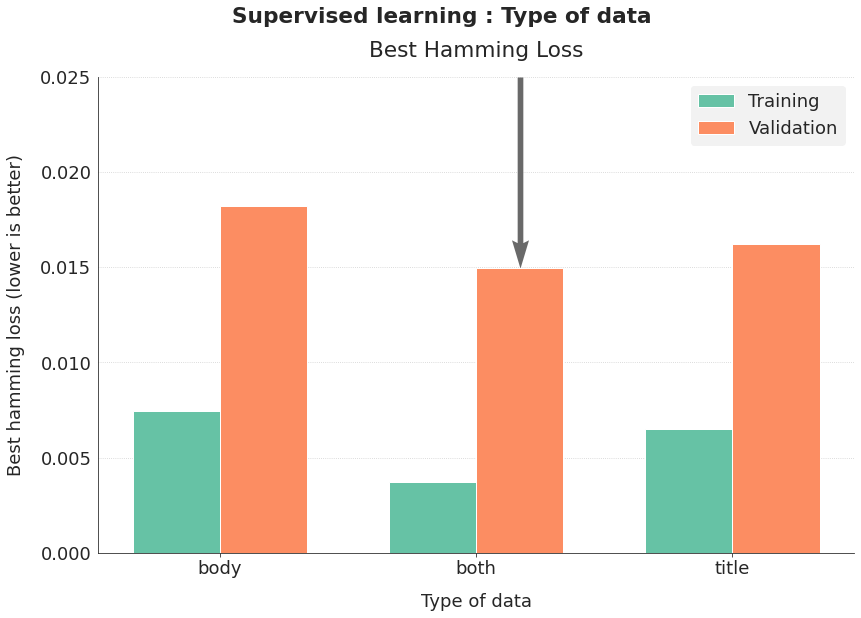

In [ ]:
fig, ax = graph_analysis(supervised_full, "data", "Type of data",
                         "Supervised learning", isbar=True, ymax=0.025)

The use of both body and title text results in the best results for supervised learning.

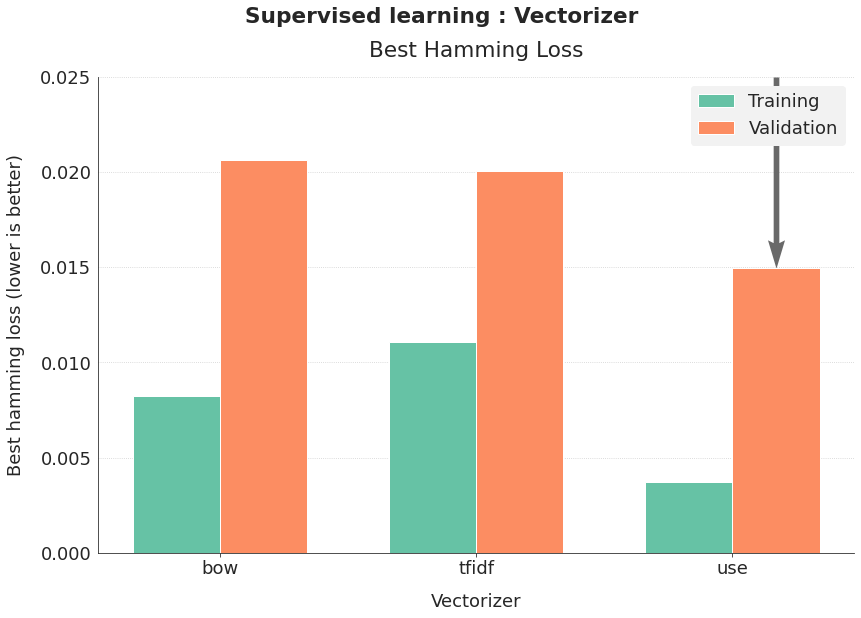

In [ ]:
fig, ax = graph_analysis(supervised_full, "vectorizer", "Vectorizer",
                         "Supervised learning", isbar=True, ymax=0.025)

The use of a sentence embedder (Universal Sentence Encoder) gets a better performance than the use of a vectorizer (BOW or TI-IDF).

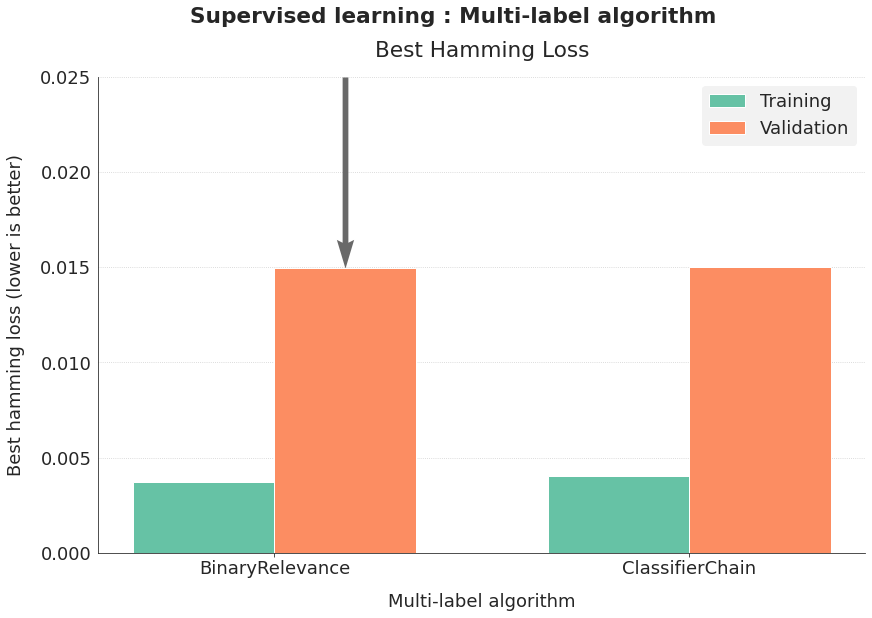

In [ ]:
fig, ax = graph_analysis(supervised_full, "multi", "Multi-label algorithm",
                         "Supervised learning", isbar=True, ymax=0.025)

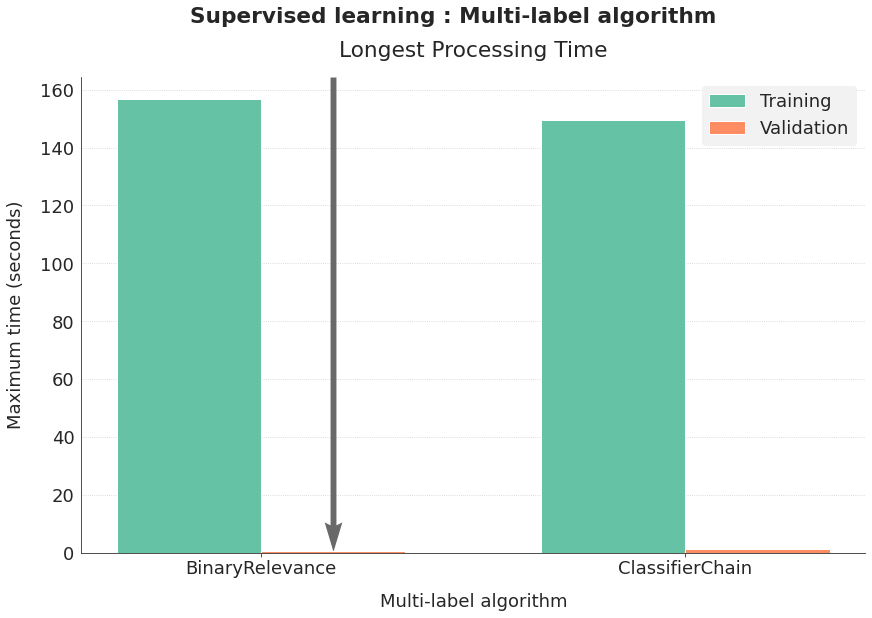

In [ ]:
fig, ax = graph_analysis(supervised_full, "multi", "Multi-label algorithm",
                         "Supervised learning", isbar=True, show_time=True)

Results are very close for Binary Relevance and Classifier Chain. Binary Relevance gets a slight advantage, with a smaller hamming loss and a faster prediction time.

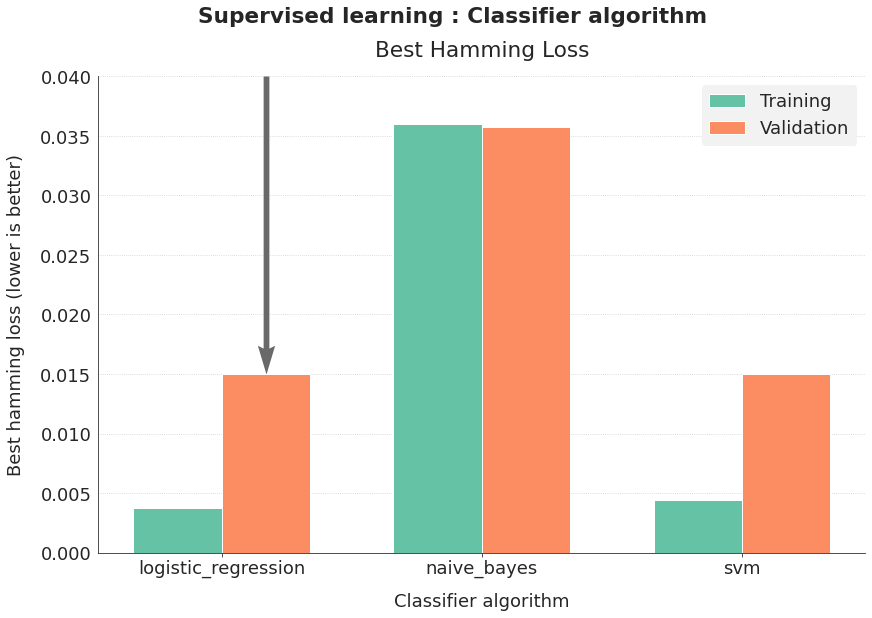

In [ ]:
fig, ax = graph_analysis(supervised_full, "classifier", "Classifier algorithm",
                         "Supervised learning", isbar=True, ymax=0.04)

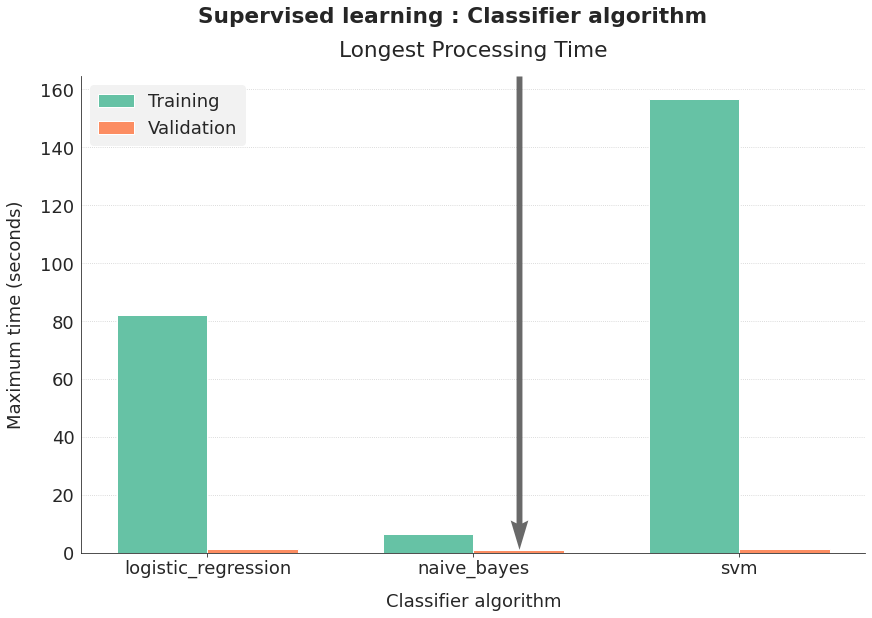

In [ ]:
fig, ax = graph_analysis(supervised_full, "classifier", "Classifier algorithm",
                         "Supervised learning", isbar=True, show_time=True)

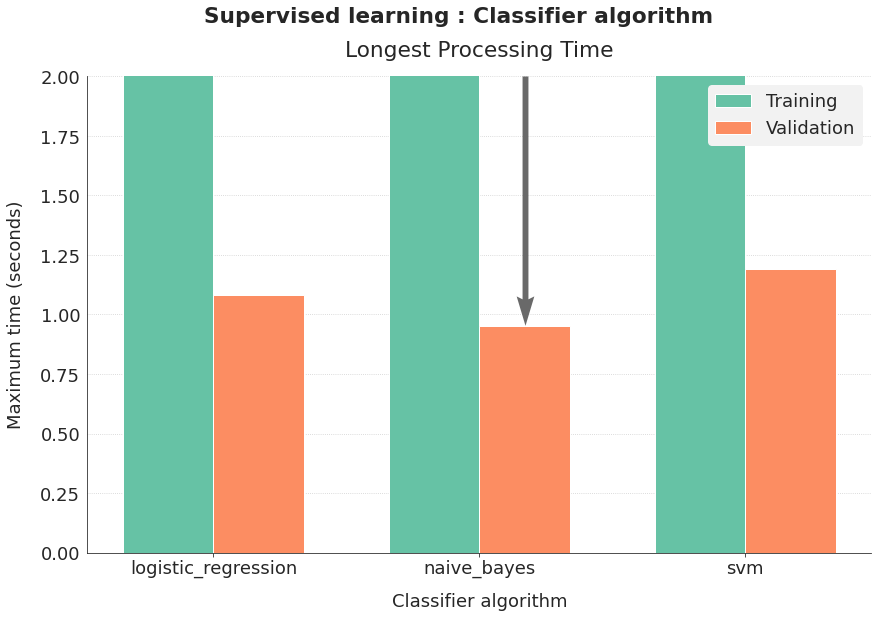

In [ ]:
fig, ax = graph_analysis(supervised_full, "classifier", "Classifier algorithm",
                         "Supervised learning", isbar=True, ymax=2, show_time=True)

The performance is really close for SVM and Logistic Regression. But Logistic Regression is slightly better and benefits from a faster processing time, both for fitting and prediction.

I choose the Logistic Regression and look at the more promising C hyperparameter.

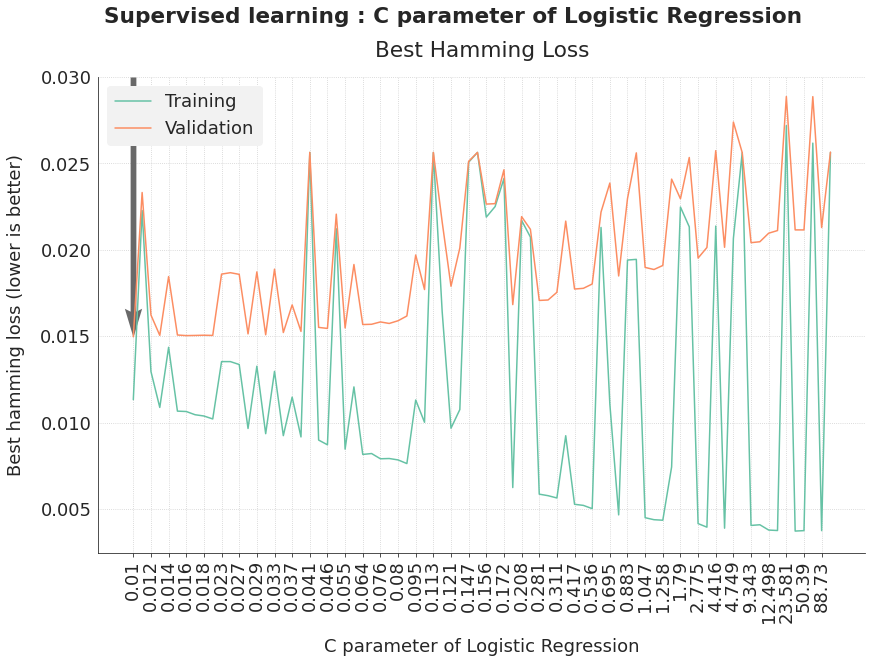

In [ ]:
fig, ax = graph_analysis(
    supervised_full[supervised_full.classifier == "logistic_regression"],
    "clf_parameter", "C parameter of Logistic Regression", "Supervised learning",
    ymax=0.03, tick_step=2, rotation=90)

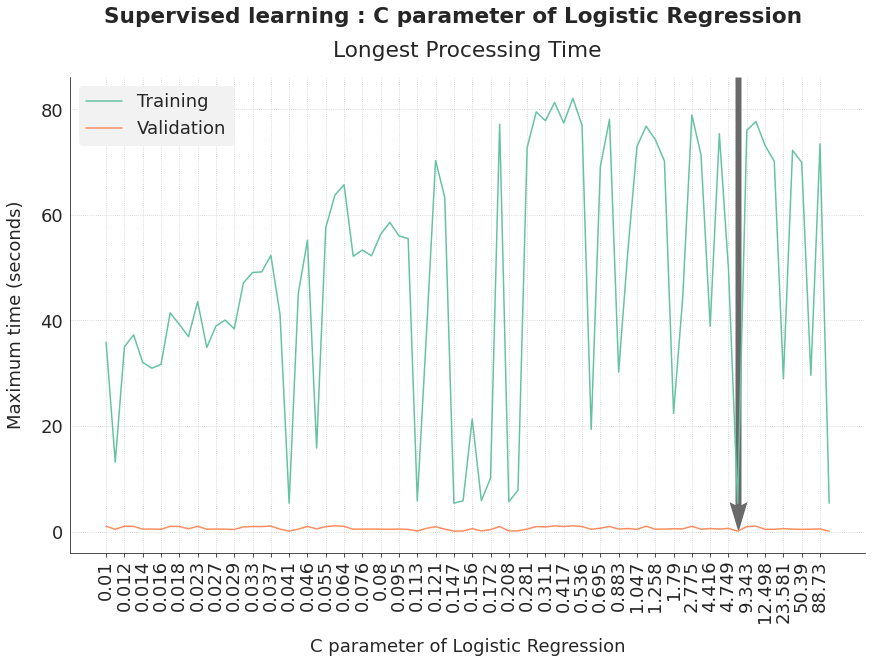

In [ ]:
fig, ax = graph_analysis(
    supervised_full[supervised_full.classifier == "logistic_regression"],
    "clf_parameter", "C parameter of Logistic Regression", "Supervised learning",
    tick_step=2, rotation=90, show_time=True)

I get my best results with a C value of 0.01. I should focus on C values between 0.001 and 0.1.

<a id="5_2"></a>

### 5.2. Model based on ML-kNN

In [ ]:
X_mlknn, y_mlknn, _, _ = \
    iterative_train_test_split(X_mini.values, 
                               y_mini.values, 
                               test_size=0.5)
X_mlknn = pd.DataFrame(X_mlknn, columns=X_mini.columns)
y_mlknn = pd.DataFrame(y_mlknn, columns=y_mini.columns)

In [ ]:
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")
EMBED_BODY = np.array(embed(X_mlknn.body))
EMBED_TITLE = np.array(embed(X_mlknn.title))
EMBED_BOTH = np.array(embed(X_mlknn.both))
SCORE_HAMMING = make_scorer(hamming_loss, greater_is_better=True)

In [ ]:
def run_mlknn2(csv_file, max_evals=100):
    global OUT_FILE
    OUT_FILE = csv_file
    of_connection = open(OUT_FILE, "w")  # Write the headers to the file
    writer = csv.writer(of_connection)
    writer.writerow(["validation_hamming_loss", "training_hamming_loss",
                     "fit_time", "test_time", "params_data",
                     "params_vectorizer",
                     "params_classifier", "iteration"])
    of_connection.close()
    
    global ITERATION
    ITERATION = 0

    trials = Trials()
    
    best_param = fmin(objective_mlknn2, space_mlknn2,
                      algo=tpe.suggest, trials=trials,
                      max_evals=max_evals, rstate=np.random.RandomState(42))
    
    list_losses = [t["result"]["loss"] for t in trials.trials]
    idx_min = np.argmin(list_losses)

    print("Hyperparameters optimization done")
    print("Best hamming loss = {}"\
          .format(trials.trials[idx_min]["result"]["loss"]))
    print("Fit time = {}"\
          .format(trials.trials[idx_min]["result"]["fit_time"]))
    print("Test time = {}"\
          .format(trials.trials[idx_min]["result"]["test_time"]))
    print("Best hamming loss obtained after {} iterations"\
          .format(trials.trials[idx_min]["result"]["iteration"]))
    print("")

In [ ]:
def objective_mlknn2(params, use_body=EMBED_BODY, use_title=EMBED_TITLE,
                         use_both=EMBED_BOTH, my_score=SCORE_HAMMING):
    global ITERATION, OUT_FILE
    ITERATION += 1

    params_data = params.get("data")
    params_vect = params.get("vectorizer")
    params_model = params.get("model")
    
    t_vect = params_vect["type"]
    del params_vect["type"]
    if t_vect == "bow":
        vectorizer = CountVectorizer(token_pattern=my_regex,
                                     stop_words=full_stop_words)
        vectorizer.set_params(**params_vect)
        X_data = X_mlknn[params_data]
    elif t_vect == "tfidf":
        vectorizer = TfidfVectorizer(token_pattern=my_regex,
                                     stop_words=full_stop_words)
        vectorizer.set_params(**params_vect)
        X_data = X_mlknn[params_data]
    elif t_vect == "use":
        if params_data == "body":
            X_data = use_body
        elif params_data == "title":
            X_data = use_title
        elif params_data == "both":
            X_data = use_both
        else:
            return 0
    else:
        return 0

    clf = MLkNN()
    clf.set_params(**params_model)
    
    if t_vect == "use":
        my_pipeline = Pipeline([("scaler", StandardScaler()),
                                ("clf", clf)])
    else:
        my_pipeline = Pipeline([("vectorizer", vectorizer),
                                ("scaler", StandardScaler(with_mean=False)),
                                ("clf", clf)])
    myshuffle = IterativeStratification(n_splits=5)
    cv_results = cross_validate(my_pipeline, X_data, y_mlknn.values,
                                cv=myshuffle, scoring=my_score,
                                return_train_score=True, n_jobs=-1)
    valid_score = cv_results["test_score"].mean()
    train_score = cv_results["train_score"].mean()
    valid_time = cv_results["score_time"].mean()
    train_time = cv_results["fit_time"].mean()

    params_vect["vectorizer"] = t_vect
    of_connection = open(OUT_FILE, 'a')
    writer = csv.writer(of_connection)
    writer.writerow([valid_score, train_score, train_time, valid_time,
                     params_data, params_vect,
                     params_model, ITERATION])
    of_connection.close()
    
    return {"loss": valid_score, "train_score": train_score,
            "fit_time": train_time, "test_time": valid_time,
            "params": params, "iteration": ITERATION, "status": STATUS_OK}

In [ ]:
space_mlknn2 = {
    "data": hp.choice("data", ["body", "title", "both"]),
    "vectorizer": hp.choice("vectorizer_type", [
        {"type": "bow",
         "ngram_range": hp.choice("bow_ngrams", [(1, 1), (1, 2), (1, 3)]),
         "min_df": hp.uniform("bow_mindf", 0.01, 0.05),
         "max_df": hp.uniform("bow_maxdf", 0.95, 0.99)},
        {"type": "tfidf",
         "ngram_range": hp.choice("tfidf_ngrams", [(1, 1), (1, 2), (1, 3)]),
         "min_df": hp.uniform("tfidf_mindf", 0.01, 0.05),
         "max_df": hp.uniform("tfidf_maxdf", 0.95, 0.99)},
        {"type": "use"}
        ]),
    "model": {"k": hp.choice("knn_k", np.arange(3, 30, 2, dtype=int)),
              "s": hp.uniform("knn_s", 0, 1)}}

In [ ]:
mlknn_file = "hyperopt_supervised_mlknn.csv"
run_mlknn2(mlknn_file, max_evals=100)

100%|██████████| 100/100 [7:13:15<00:00, 259.96s/it, best loss: 0.018234996293113672]
Hyperparameters optimization done
Best hamming loss = 0.018234996293113672
Fit time = 59.4178964138031
Test time = 13.065496826171875
Best hamming loss obtained after 32 iterations



In [ ]:
supervised_mlknn = get_mlknn_summary("hyperopt_supervised_mlknn.csv")
supervised_mlknn.sort_values(by="validation_hamming_loss").head(10)

,validation_hamming_loss,training_hamming_loss,fit_time,test_time,iteration,data,vectorizer,vectorizer_maxdf,vectorizer_mindf,vectorizer_ngrams,mlknn_k,mlknn_s
31,0.018235,0.015807,59.417896,13.065497,32,title,use,NaN,NaN,NaN,27,0.756
20,0.018292,0.015788,59.473866,13.209273,21,title,use,NaN,NaN,NaN,27,0.979
94,0.018293,0.015763,58.980476,13.385302,95,title,use,NaN,NaN,NaN,23,0.684
1,0.018306,0.015720,57.769934,13.167012,2,title,use,NaN,NaN,NaN,17,0.601
79,0.018328,0.015653,57.753610,13.313808,80,title,use,NaN,NaN,NaN,15,0.925
32,0.018347,0.015828,59.995596,13.086184,33,title,use,NaN,NaN,NaN,27,0.954
67,0.018371,0.015673,57.162888,13.194262,68,title,use,NaN,NaN,NaN,17,0.612
30,0.018376,0.015683,57.657547,13.443299,31,title,use,NaN,NaN,NaN,17,0.597
26,0.018383,0.015826,59.220683,13.197041,27,title,use,NaN,NaN,NaN,25,0.914
28,0.018399,0.015707,57.466931,13.282763,29,title,use,NaN,NaN,NaN,17,0.268


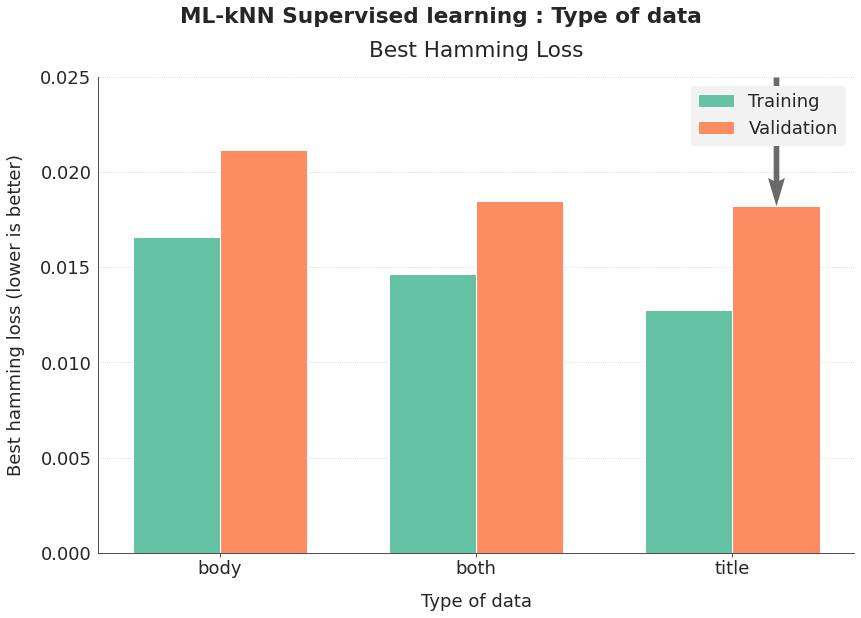

In [ ]:
fig, ax = graph_analysis(
    supervised_mlknn, "data", "Type of data", "ML-kNN Supervised learning",
    isbar=True, ymax=0.025)

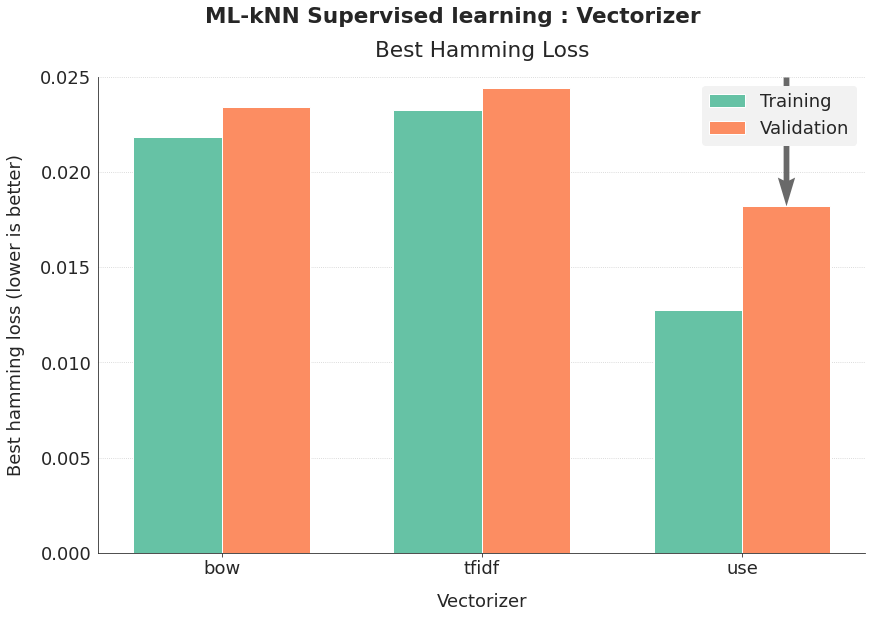

In [ ]:
fig, ax = graph_analysis(
    supervised_mlknn, "vectorizer", "Vectorizer", "ML-kNN Supervised learning",
    isbar=True, ymax=0.025)

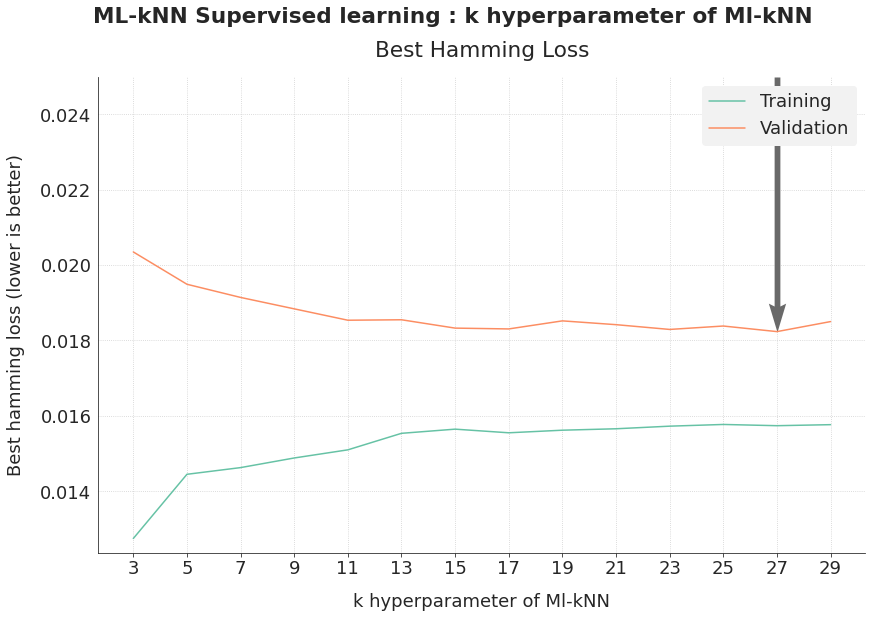

In [ ]:
fig, ax = graph_analysis(
    supervised_mlknn, "mlknn_k", "k hyperparameter of Ml-kNN", "ML-kNN Supervised learning",
    ymax=0.025)

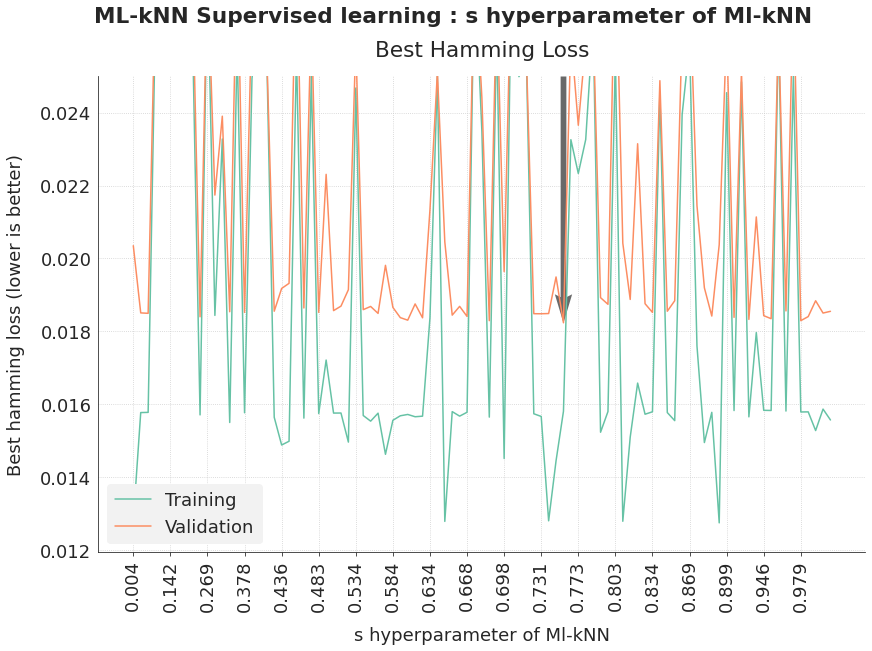

In [ ]:
fig, ax = graph_analysis(
    supervised_mlknn, "mlknn_s", "s hyperparameter of Ml-kNN", "ML-kNN Supervised learning",
    ymax=0.025, tick_step=5, rotation=90)

ML-kNN algorithm doesn't reach the performance of Logistic Regression, with a supervised approach. So I focus on Logistic Regression to find the best setting for this algorithm.

<a id="5_3"></a>

### 5.3. Fine tuning of the Logistic Regression model

In [ ]:
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")
EMBED_BODY = np.array(embed(X_mini.body))
EMBED_TITLE = np.array(embed(X_mini.title))
EMBED_BOTH = np.array(embed(X_mini.both))
SCORE_HAMMING = make_scorer(hamming_loss, greater_is_better=True)

In [ ]:
space_supervised = {
    "data": "both",
    "vectorizer": {"type": "use"},
    "classifier": "BinaryRelevance",
    "model": {"type": "logistic_regression",
              "C": hp.loguniform("log_C", np.log(0.001), np.log(0.1))}}

In [ ]:
logistic_file = "hyperopt_supervised_logistic.csv"
run_supervised(logistic_file, max_evals=50)

100%|██████████| 50/50 [1:23:24<00:00, 100.08s/it, best loss: 0.014937259286321572]
Hyperparameters optimization done
Best hamming loss = 0.014937259286321572
Fit time = 31.124638414382936
Test time = 0.36240229606628416
Best hamming loss obtained after 16 iterations



In [ ]:
logistic_summary =  pd.read_csv("hyperopt_supervised_logistic.csv")
logistic_summary["C"] = [np.around(np.float(param[param.find("C")+4:
        param.find("multi")-3]), 3) for param in logistic_summary.params_classifier]
logistic_summary.drop(columns=["params_data", "params_vectorizer", "params_classifier"],
                      inplace=True)
logistic_summary.sort_values(by="validation_hamming_loss").head(10)

,validation_hamming_loss,training_hamming_loss,fit_time,test_time,iteration,C
15,0.014937,0.010802,31.124638,0.362402,16,0.015
49,0.014943,0.011277,28.798143,0.370012,50,0.011
7,0.014964,0.010503,32.968112,0.362694,8,0.017
43,0.015003,0.010915,30.626303,0.346791,44,0.013
8,0.015006,0.011116,29.741730,0.347976,9,0.012
39,0.015012,0.011036,29.765040,0.360746,40,0.012
28,0.015018,0.010799,30.531919,0.370125,29,0.014
16,0.015018,0.011311,28.266636,0.358306,17,0.011
13,0.015022,0.011223,28.755768,0.361019,14,0.011
3,0.015035,0.011849,25.524224,0.332285,4,0.008


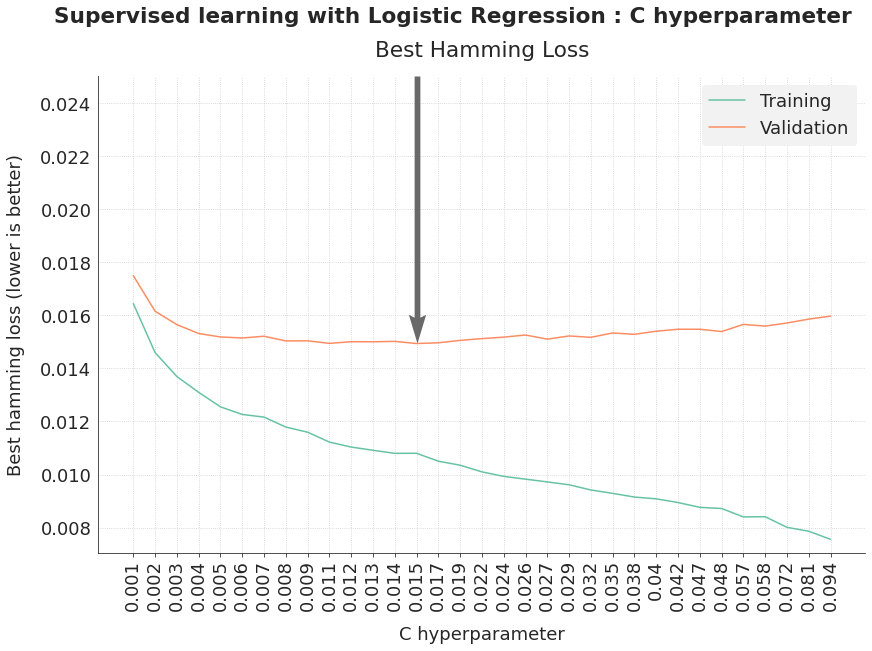

In [ ]:
fig, ax = graph_analysis(
    logistic_summary, "C", "C hyperparameter", "Supervised learning with Logistic Regression",
    ymax=0.025, rotation=90)

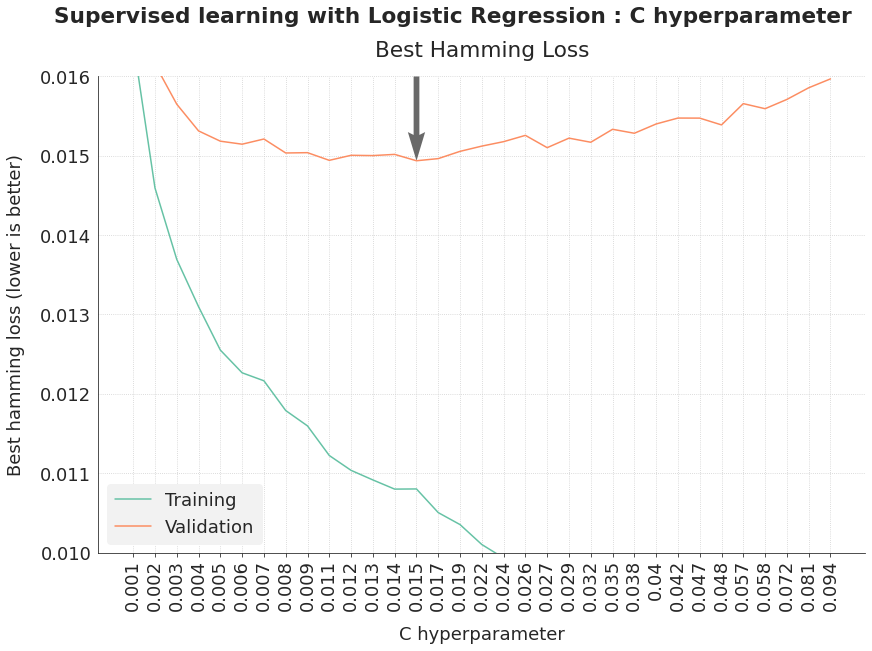

In [ ]:
fig, ax = graph_analysis(
    logistic_summary, "C", "C hyperparameter", "Supervised learning with Logistic Regression",
    ymin=0.010, ymax=0.016, rotation=90)

We have a very similar performance with a C value between 0.008 and 0.020.  
Opting for a value of 0.008 allows us to get a hamming loss closed to the best value (with a C of 0.015) and limits the overfitting of the model. Thus, a setting of 0.008 should be better for generalization.

<a id="5_4"></a>

### 5.4. Performance analysis of the best model

I compare performance I get with C=0.015 (optimal) and C=0.008 (less overfitting).

In [ ]:
myshuffle = IterativeStratification(n_splits=5)
model = LogisticRegression(n_jobs=-1, C=0.015)
clf = BinaryRelevance(model)
my_pipeline = Pipeline([("scaler", StandardScaler()),
                        ("clf", clf)])

In [ ]:
cv_results = cross_validate(my_pipeline, EMBED_BOTH, y_mini.values, cv=myshuffle,
                            scoring={"hamming": SCORE_HAMMING,
                                     "accuracy": "accuracy",
                                     "f1_micro": "f1_micro",
                                     "f1_macro": "f1_macro",
                                     "f1_weighted": "f1_weighted"},
                            return_train_score=True, n_jobs=-1)

In [ ]:
print("Training scores :")
print("Hamming loss = {:.4f}".format(cv_results["train_hamming"].mean()))
print("Accuracy score = {:.2%}".format(cv_results["train_accuracy"].mean()))
print("F1 micro score (overall calculation) = {:.2%}"\
      .format(cv_results["train_f1_micro"].mean()))
print("F1 macro score (average of f1 score for each label) = {:.2%}"\
      .format(cv_results["train_f1_macro"].mean()))
print("F1 macro weighted score (weighted average of f1 score for each label) = {:.2%}"\
      .format(cv_results["train_f1_weighted"].mean()))

Training scores :
Hamming loss = 0.0107
Accuracy score = 58.14%
F1 micro score (overall calculation) = 78.82%
F1 macro score (average of f1 score for each label) = 75.51%
F1 macro weighted score (weighted average of f1 score for each label) = 77.97%


In [ ]:
print("Validation scores :")
print("Hamming loss = {:.4f}".format(cv_results["test_hamming"].mean()))
print("Accuracy score = {:.2%}".format(cv_results["test_accuracy"].mean()))
print("F1 micro score (overall calculation) = {:.2%}"\
      .format(cv_results["test_f1_micro"].mean()))
print("F1 macro score (average of f1 score for each label) = {:.2%}"\
      .format(cv_results["test_f1_macro"].mean()))
print("F1 macro weighted score (weighted average of f1 score for each label) = {:.2%}"\
      .format(cv_results["test_f1_weighted"].mean()))

Validation scores :
Hamming loss = 0.0149
Accuracy score = 46.80%
F1 micro score (overall calculation) = 69.92%
F1 macro score (average of f1 score for each label) = 62.97%
F1 macro weighted score (weighted average of f1 score for each label) = 68.58%


In [ ]:
myshuffle = IterativeStratification(n_splits=5)
model = LogisticRegression(n_jobs=-1, C=0.008)
clf = BinaryRelevance(model)
my_pipeline = Pipeline([("scaler", StandardScaler()),
                        ("clf", clf)])

In [ ]:
cv_results = cross_validate(my_pipeline, EMBED_BOTH, y_mini.values, cv=myshuffle,
                            scoring={"hamming": SCORE_HAMMING,
                                     "accuracy": "accuracy",
                                     "f1_micro": "f1_micro",
                                     "f1_macro": "f1_macro",
                                     "f1_weighted": "f1_weighted",
                                     "jaccard": "jaccard_samples"},
                            return_train_score=True, n_jobs=-1)

In [ ]:
print("Training scores :")
print("Hamming loss = {:.4f}".format(cv_results["train_hamming"].mean()))
print("Accuracy score = {:.2%}".format(cv_results["train_accuracy"].mean()))
print("F1 micro score (overall calculation) = {:.2%}"\
      .format(cv_results["train_f1_micro"].mean()))
print("F1 macro score (average of f1 score for each label) = {:.2%}"\
      .format(cv_results["train_f1_macro"].mean()))
print("F1 macro weighted score (weighted average of f1 score for each label) = {:.2%}"\
      .format(cv_results["train_f1_weighted"].mean()))
print("Jaccard similarity score = {:.2%}"\
      .format(cv_results["train_jaccard"].mean()))

Training scores :
Hamming loss = 0.0118
Accuracy score = 54.73%
F1 micro score (overall calculation) = 76.12%
F1 macro score (average of f1 score for each label) = 71.23%
F1 macro weighted score (weighted average of f1 score for each label) = 74.98%
Jaccard similarity score = 67.24%


In [ ]:
print("Validation scores :")
print("Hamming loss = {:.4f}".format(cv_results["test_hamming"].mean()))
print("Accuracy score = {:.2%}".format(cv_results["test_accuracy"].mean()))
print("F1 micro score (overall calculation) = {:.2%}"\
      .format(cv_results["test_f1_micro"].mean()))
print("F1 macro score (average of f1 score for each label) = {:.2%}"\
      .format(cv_results["test_f1_macro"].mean()))
print("F1 macro weighted score (weighted average of f1 score for each label) = {:.2%}"\
      .format(cv_results["test_f1_weighted"].mean()))
print("Jaccard similarity score = {:.2%}"\
      .format(cv_results["test_jaccard"].mean()))

Validation scores :
Hamming loss = 0.0150
Accuracy score = 46.03%
F1 micro score (overall calculation) = 69.23%
F1 macro score (average of f1 score for each label) = 61.50%
F1 macro weighted score (weighted average of f1 score for each label) = 67.67%
Jaccard similarity score = 59.44%


I opt for a C of 0.008, as performance is very similar but benefits from less overfitting.

---
<a id='6_0'></a>

## <font color=blue>6. Final evaluation : generalization performance</font>

My final and best model to predict the labels of a new question is composed of :  
- a sentence embedding with Universal Sentence Embedder ;
- a Binary Relevance based on Logistic Regression, with a C of 0.008.  
  
I do a new cross validation, with this setting, on all training data, to check I get similar results.

In [ ]:
class UseBoth(BaseEstimator, TransformerMixin):

    def __init__(self, embed, max_lines_per_round=10000):
        self.embed = embed
        self.max_lines_per_round = max_lines_per_round

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X_both = X["title"].fillna(" ") + " " + X["body"].fillna(" ")
        nb_lin = len(X_both)
        transformed = np.array(self.embed(X_both.iloc[:self.max_lines_per_round]))
        sum_lines = self.max_lines_per_round
        while sum_lines < nb_lin:
            transformed = np.concatenate(
                (transformed, 
                 np.array(self.embed(X_both.iloc[sum_lines:
                                                sum_lines + self.max_lines_per_round]))))
            sum_lines += self.max_lines_per_round
        return transformed

In [ ]:
X_mytrain, y_mytrain, _, _ = \
    iterative_train_test_split(X_fulltrain.values, 
                               y_fulltrain.values, 
                               test_size=0.5)
X_mytrain = pd.DataFrame(X_mytrain, columns=X_fulltrain.columns)
y_mytrain = pd.DataFrame(y_mytrain, columns=y_fulltrain.columns)

In [ ]:
X_test = pd.read_csv("X_test.csv", index_col=0, lineterminator='\n')
y_test = pd.read_csv("y_test.csv", index_col=0)

In [ ]:
emb = UseBoth(embed)
X_data_train = emb.fit_transform(X_mytrain)
X_data_test = emb.fit_transform(X_test)

In [ ]:
model = LogisticRegression(n_jobs=-1, C=0.008)
clf = BinaryRelevance(model)
my_pipeline = Pipeline([("scaler", StandardScaler()),
                        ("clf", clf)])

In [ ]:
my_pipeline.fit(X_data_train, y_mytrain)
predict_test = my_pipeline.predict(X_data_test)

In [ ]:
test_hamming = hamming_loss(y_test, predict_test)
test_accuracy = accuracy_score(y_test, predict_test)
test_f1_micro = f1_score(y_test, predict_test, average="micro")
test_f1_macro = f1_score(y_test, predict_test, average="macro")
test_f1_macroweighted = f1_score(y_test, predict_test, average="weighted")

In [ ]:
print("Generalization scores on test data :")
print("Hamming loss = {:.4f}".format(test_hamming))
print("Accuracy score = {:.2%}".format(test_accuracy))
print("F1 micro score (overall calculation) = {:.2%}".format(test_f1_micro))
print("F1 macro score (average of f1 score for each label) = {:.2%}".format(test_f1_macro))
print("F1 macro weighted score (weighted average of f1 score for each label) = {:.2%}"\
      .format(test_f1_macroweighted))

Generalization scores on test data :
Hamming loss = 0.0137
Accuracy score = 49.98%
F1 micro score (overall calculation) = 72.82%
F1 macro score (average of f1 score for each label) = 67.53%
F1 macro weighted score (weighted average of f1 score for each label) = 71.71%


I also look at the Jaccard Similarity score to know the average proportion of correctly predicted labels.

In [ ]:
test_jaccard = jaccard_score(y_test, predict_test, average="samples")
print("Jaccard similarity score = {:.2%}".format(test_jaccard))

Jaccard similarity score = 64.34%


The generalization give similar results to cross-validation, with every metric beeing in the middle of training and validation results.  
With a multi-label accuracy score of 50% and a micro F1 score of 0.728, this model seems pretty satisfying.

---
<a id='7_0'></a>

## <font color=blue>7. Saving the final model to use within an API</font>

I need to save the Pipeline and the name of the labels (in the right order) with joblib.

In [ ]:
joblib.dump(my_pipeline, "ml05_pipeline.joblib")

In [ ]:
list_of_labels = np.array(y_fulltrain.columns)
list_of_labels

array(['java', 'c#', 'javascript', 'python', 'android', 'c++', 'ios',
       'php', 'html', 'dot.net', 'jquery', 'css', 'c', 'git',
       'objective-c', 'sql', 'ruby-on-rails', 'iphone', 'mysql',
       'node.js', 'r', 'ruby', 'swift', 'asp.net', 'linux', 'django',
       'string', 'arrays', 'sql-server', 'xcode', 'asp.net-mvc',
       'angularjs', 'json', 'angular', 'performance', 'windows',
       'eclipse', 'bash', 'c++11', 'visual-studio', 'regex', 'spring',
       'scala', 'algorithm', 'wpf', 'macos', 'reactjs', 'multithreading',
       'unit-testing', 'database'], dtype=object)

In [ ]:
joblib.dump(list_of_labels, "ml05_labels.joblib")

['ml05_labels.joblib']

I also need to save the version of sklearn, pandas, numpy and skmultilearn. I don't use pip freeze because I don't want to save the entire environment, but only the version of those libraries.

In [ ]:
np.__version__

'1.18.5'

In [ ]:
pd.__version__

'1.0.5'

In [ ]:
import sklearn
sklearn.__version__

'0.22.2.post1'

In [ ]:
requirement_file = open("joblib_requirements.txt", "w")
requirement_file.write("Numpy v 1.18.5")
requirement_file.write("Pandas v 1.0.5")
requirement_file.write("sklearn v 0.22.2")
requirement_file.write("skmutlilearn v 0.2.0")
requirement_file.close

<function TextIOWrapper.close>

---
<a id='7_0'></a>

## <font color=blue>8. Annex : Graphs for presentation</font>

**Semi supervised graphs**

In [ ]:
semi_binary_logistic = get_semi_logistic("hyperopt_semi_binary_logistic.csv")
semi_binary_logistic["multi"] = "Binary Relevance"
semi_chain_logistic = get_semi_logistic("hyperopt_semi_chain_logistic.csv")
semi_chain_logistic["multi"] = "Classifier Chain"
semi_powerset_logistic = get_semi_logistic("hyperopt_semi_powerset_logistic.csv")
semi_powerset_logistic["multi"] = "Label Powerset"

In [ ]:
best_binary = semi_binary_logistic.sort_values(by="validation_hamming_loss").head(1)
best_chain = semi_chain_logistic.sort_values(by="validation_hamming_loss").head(1)
best_powerset = semi_powerset_logistic.sort_values(by="validation_hamming_loss").head(1)
best_comparison = pd.concat([best_binary, best_chain, best_powerset])

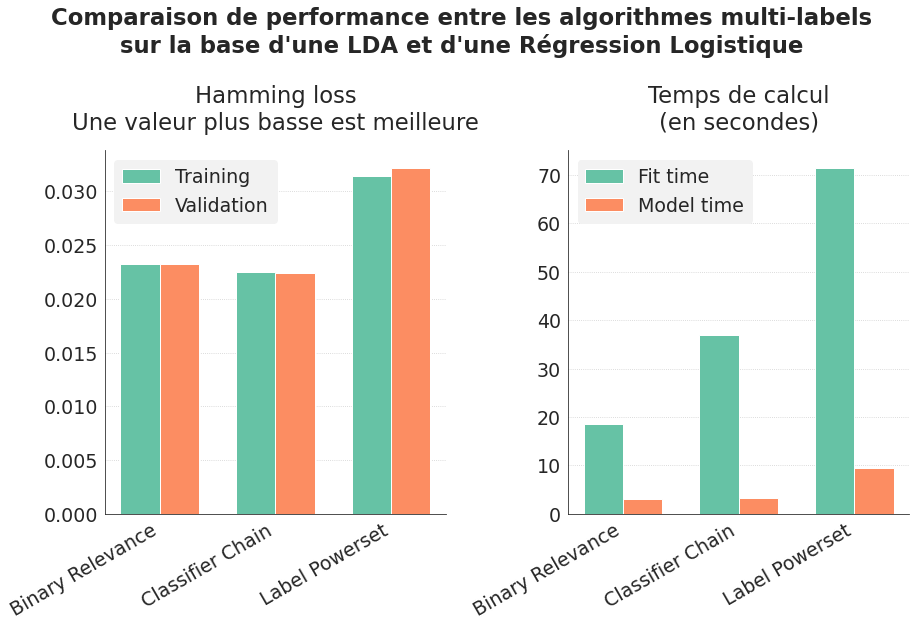

In [ ]:
graph = sfg.MyGraph("Comparaison de performance entre les algorithmes multi-labels\nsur la base d'une LDA et d'une Régression Logistique",
                    y_title=1.1, nblin=1, nbcol=2, figsize=(13, 8))
x_values = np.arange(len(best_comparison))
graph.add_barv(x_values - 0.17, best_comparison.training_hamming_loss, bar_width=0.34,
               label="Training", multi_index=1)
graph.add_barv(x_values + 0.17, best_comparison.validation_hamming_loss, bar_width=0.34,
               label="Validation", legend=True,
               subtitle="Hamming loss\nUne valeur plus basse est meilleure", multi_index=1)
graph.add_barv(x_values - 0.17, best_comparison.fit_time, bar_width=0.34,
               label="Fit time", multi_index=2)
graph.add_barv(x_values + 0.17, best_comparison.test_time, bar_width=0.34,
               label="Model time", legend=True,
               subtitle="Temps de calcul\n(en secondes)", multi_index=2)
graph.set_axe_x(tick_min=0, tick_max=len(best_comparison)-1, tick_step=1, tick_labels=best_comparison.multi,
                rotation=30, ha="right", multi_index=1)
graph.set_axe_x(tick_min=0, tick_max=len(best_comparison)-1, tick_step=1, tick_labels=best_comparison.multi,
                rotation=30, ha="right", multi_index=2)
save_fig("ml05_03_semi_first_comparison")
plt.show()

In [ ]:
semi_full = get_semifull_summary("hyperopt_semi_full.csv")
semi_mlknn = get_semifull_summary("hyperopt_mlknn.csv", is_mlknn=True)
best_comparison = semi_mlknn.sort_values(by="validation_hamming_loss").head(1)
for multi in semi_full.multi.unique():
    best_comparison = pd.concat([best_comparison, semi_full[semi_full.multi == multi]\
                           .sort_values(by="validation_hamming_loss").head(1)])

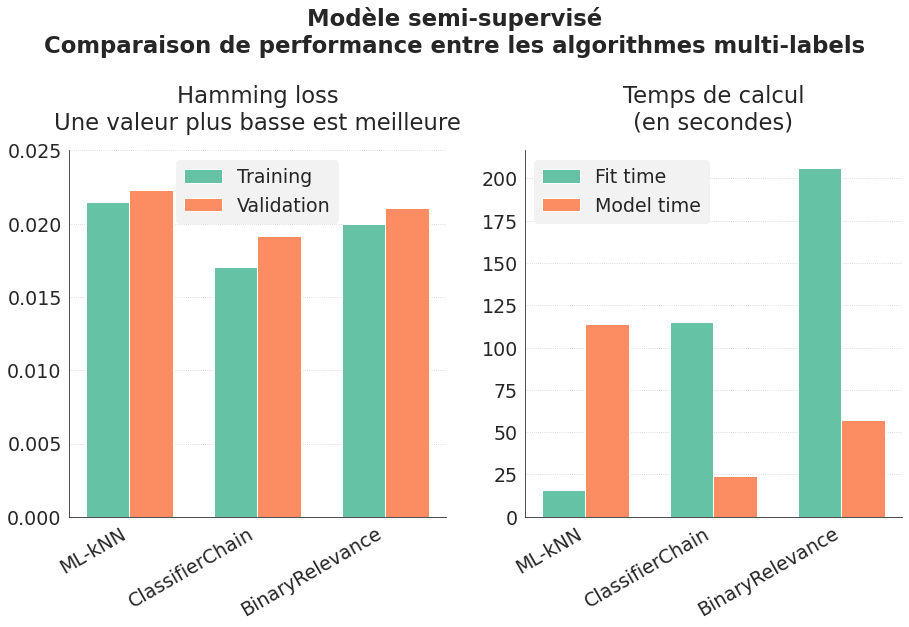

In [ ]:
graph = sfg.MyGraph("Modèle semi-supervisé\nComparaison de performance entre les algorithmes multi-labels",
                    y_title=1.1, nblin=1, nbcol=2, figsize=(13, 8))
x_values = np.arange(len(best_comparison))
graph.add_barv(x_values - 0.17, best_comparison.training_hamming_loss, bar_width=0.34,
               label="Training", multi_index=1)
graph.add_barv(x_values + 0.17, best_comparison.validation_hamming_loss, bar_width=0.34,
               label="Validation", legend=True,
               subtitle="Hamming loss\nUne valeur plus basse est meilleure", multi_index=1)
graph.add_barv(x_values - 0.17, best_comparison.fit_time, bar_width=0.34,
               label="Fit time", multi_index=2)
graph.add_barv(x_values + 0.17, best_comparison.test_time, bar_width=0.34,
               label="Model time", legend=True,
               subtitle="Temps de calcul\n(en secondes)", multi_index=2)
graph.set_axe_x(tick_min=0, tick_max=len(best_comparison)-1, tick_step=1, tick_labels=best_comparison.multi,
                rotation=30, ha="right", multi_index=1)
graph.set_axe_y(tick_max=0.025)
graph.set_axe_x(tick_min=0, tick_max=len(best_comparison)-1, tick_step=1, tick_labels=best_comparison.multi,
                rotation=30, ha="right", multi_index=2)
save_fig("ml05_03_semi_comparison_multi")
plt.show()

In [ ]:
best_comparison = semi_mlknn.sort_values(by="validation_hamming_loss").head(1)
for classifier in semi_full.classifier.unique():
    best_comparison = pd.concat([best_comparison, semi_full[semi_full.classifier == classifier]\
                                 .sort_values(by="validation_hamming_loss").head(1)])

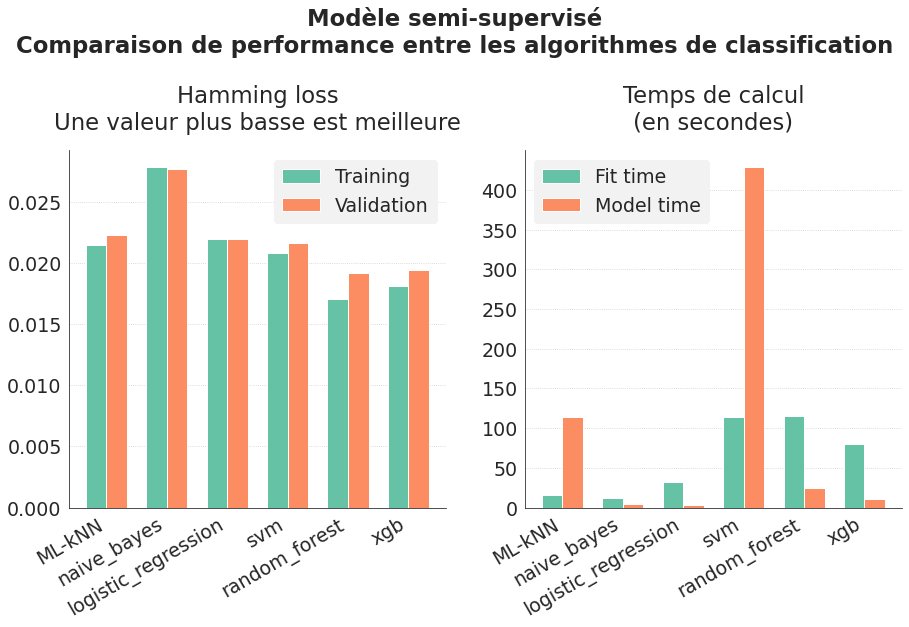

In [ ]:
graph = sfg.MyGraph("Modèle semi-supervisé\nComparaison de performance entre les algorithmes de classification",
                    y_title=1.1, nblin=1, nbcol=2, figsize=(13, 8))
x_values = np.arange(len(best_comparison))
graph.add_barv(x_values - 0.17, best_comparison.training_hamming_loss, bar_width=0.34,
               label="Training", multi_index=1)
graph.add_barv(x_values + 0.17, best_comparison.validation_hamming_loss, bar_width=0.34,
               label="Validation", legend=True,
               subtitle="Hamming loss\nUne valeur plus basse est meilleure", multi_index=1)
graph.add_barv(x_values - 0.17, best_comparison.fit_time, bar_width=0.34,
               label="Fit time", multi_index=2)
graph.add_barv(x_values + 0.17, best_comparison.test_time, bar_width=0.34,
               label="Model time", legend=True,
               subtitle="Temps de calcul\n(en secondes)", multi_index=2)
graph.set_axe_x(tick_min=0, tick_max=len(best_comparison)-1, tick_step=1, tick_labels=best_comparison.classifier,
                rotation=30, ha="right", multi_index=1)
graph.set_axe_x(tick_min=0, tick_max=len(best_comparison)-1, tick_step=1, tick_labels=best_comparison.classifier,
                rotation=30, ha="right", multi_index=2)
save_fig("ml05_03_semi_comparison_classifier")
plt.show()

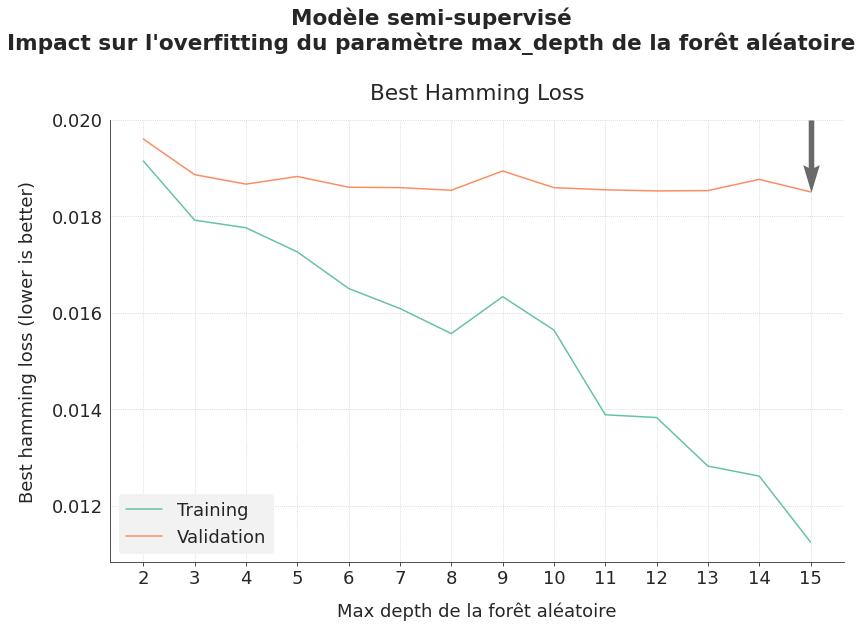

In [ ]:
fig, ax = graph_analysis(semi_rf, "rf_max_depth", "Max depth de la forêt aléatoire",
                         "Modèle semi-supervisé", ymax=0.02)
fig.suptitle("Modèle semi-supervisé\nImpact sur l'overfitting du paramètre max_depth de la forêt aléatoire",
             y=1.10)
save_fig("ml05_03_semi_rf_optimization")
plt.show()

**Supervised graphs**

In [ ]:
supervised_full = get_supervised_summary("hyperopt_supervised_full.csv")
supervised_full.drop(columns=["clf_parameter"], inplace=True)
supervised_full.head()

,validation_hamming_loss,training_hamming_loss,fit_time,test_time,iteration,data,vectorizer,vectorizer_maxdf,vectorizer_mindf,vectorizer_ngrams,multi,classifier
0,0.022633,0.021880,21.293692,0.536297,1,both,tfidf,0.953,0.035,"(1, 3)",ClassifierChain,logistic_regression
1,0.028788,0.011266,133.601391,0.932241,2,title,use,NaN,NaN,NaN,ClassifierChain,svm
2,0.039098,0.031028,34.732559,0.386253,4,body,bow,0.953,0.015,"(1, 1)",BinaryRelevance,svm
3,0.025594,0.019437,53.026620,0.561326,5,body,tfidf,0.974,0.017,"(1, 3)",BinaryRelevance,logistic_regression
4,0.029925,0.029776,30.723501,0.124615,6,title,tfidf,0.971,0.028,"(1, 3)",ClassifierChain,svm


In [ ]:
supervised_mlknn = get_mlknn_summary("hyperopt_supervised_mlknn.csv")
supervised_mlknn["multi"] = "ML-kNN"
supervised_mlknn["classifier"] = "ML-kNN"
supervised_mlknn.drop(columns=["mlknn_k", "mlknn_s"], inplace=True)
supervised_mlknn.head()

,validation_hamming_loss,training_hamming_loss,fit_time,test_time,iteration,data,vectorizer,vectorizer_maxdf,vectorizer_mindf,vectorizer_ngrams,multi,classifier
0,0.027326,0.026025,19.827207,3.362036,1,body,tfidf,0.953,0.035,"(1, 3)",ML-kNN,ML-kNN
1,0.018306,0.015720,57.769934,13.167012,2,title,use,NaN,NaN,NaN,ML-kNN,ML-kNN
2,0.018595,0.015690,56.990166,13.139697,3,title,use,NaN,NaN,NaN,ML-kNN,ML-kNN
3,0.027560,0.025178,18.316444,3.216353,4,body,bow,0.953,0.015,"(1, 1)",ML-kNN,ML-kNN
4,0.028902,0.025588,17.785656,3.343670,5,body,tfidf,0.974,0.017,"(1, 3)",ML-kNN,ML-kNN


In [ ]:
best_comparison = supervised_mlknn.sort_values(by="validation_hamming_loss").head(1)
for multi in supervised_full.multi.unique():
    best_comparison = pd.concat([best_comparison, supervised_full[supervised_full.multi == multi]\
                           .sort_values(by="validation_hamming_loss").head(1)])

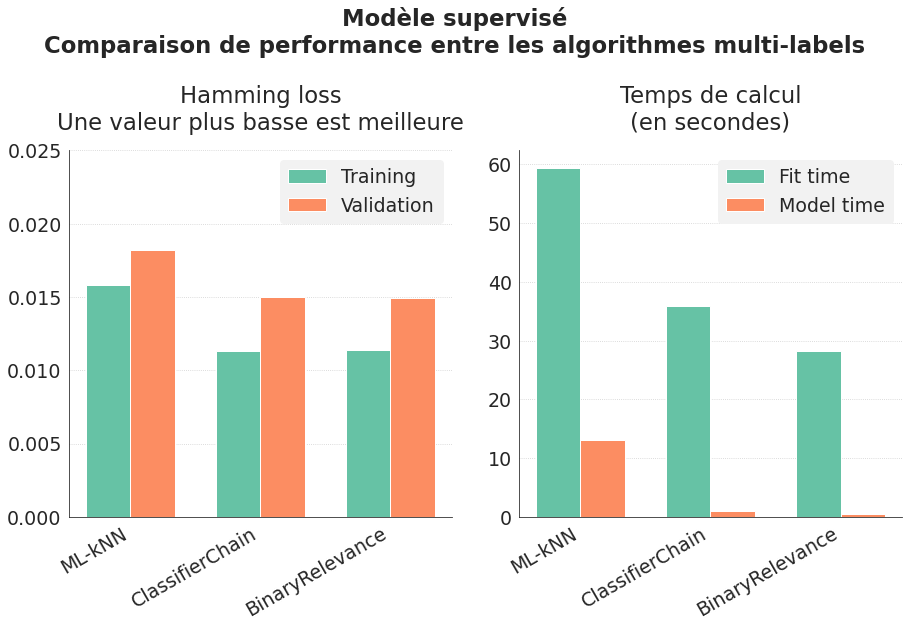

In [ ]:
graph = sfg.MyGraph("Modèle supervisé\nComparaison de performance entre les algorithmes multi-labels",
                    y_title=1.1, nblin=1, nbcol=2, figsize=(13, 8))
x_values = np.arange(len(best_comparison))
graph.add_barv(x_values - 0.17, best_comparison.training_hamming_loss, bar_width=0.34,
               label="Training", multi_index=1)
graph.add_barv(x_values + 0.17, best_comparison.validation_hamming_loss, bar_width=0.34,
               label="Validation", legend=True,
               subtitle="Hamming loss\nUne valeur plus basse est meilleure", multi_index=1)
graph.add_barv(x_values - 0.17, best_comparison.fit_time, bar_width=0.34,
               label="Fit time", multi_index=2)
graph.add_barv(x_values + 0.17, best_comparison.test_time, bar_width=0.34,
               label="Model time", legend=True,
               subtitle="Temps de calcul\n(en secondes)", multi_index=2)
graph.set_axe_x(tick_min=0, tick_max=len(best_comparison)-1, tick_step=1, tick_labels=best_comparison.multi,
                rotation=30, ha="right", multi_index=1)
graph.set_axe_y(tick_max=0.025)
graph.set_axe_x(tick_min=0, tick_max=len(best_comparison)-1, tick_step=1, tick_labels=best_comparison.multi,
                rotation=30, ha="right", multi_index=2)
save_fig("ml05_03_supervised_comparison_multi")
plt.show()

In [ ]:
best_comparison = supervised_mlknn.sort_values(by="validation_hamming_loss").head(1)
for classifier in supervised_full.classifier.unique():
    best_comparison = pd.concat([best_comparison, supervised_full[supervised_full.classifier == classifier]\
                                 .sort_values(by="validation_hamming_loss").head(1)])

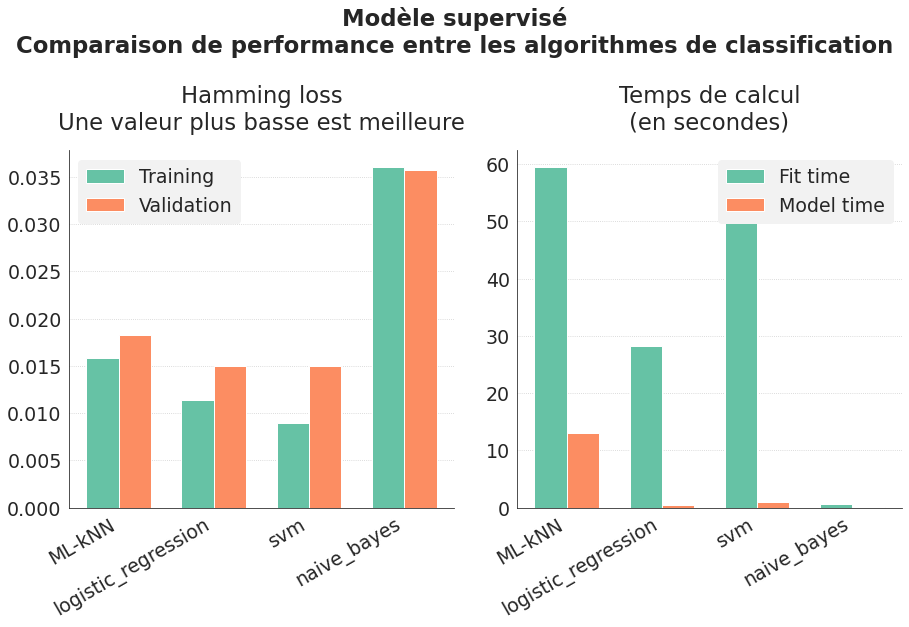

In [ ]:
graph = sfg.MyGraph("Modèle supervisé\nComparaison de performance entre les algorithmes de classification",
                    y_title=1.1, nblin=1, nbcol=2, figsize=(13, 8))
x_values = np.arange(len(best_comparison))
graph.add_barv(x_values - 0.17, best_comparison.training_hamming_loss, bar_width=0.34,
               label="Training", multi_index=1)
graph.add_barv(x_values + 0.17, best_comparison.validation_hamming_loss, bar_width=0.34,
               label="Validation", legend=True,
               subtitle="Hamming loss\nUne valeur plus basse est meilleure", multi_index=1)
graph.add_barv(x_values - 0.17, best_comparison.fit_time, bar_width=0.34,
               label="Fit time", multi_index=2)
graph.add_barv(x_values + 0.17, best_comparison.test_time, bar_width=0.34,
               label="Model time", legend=True,
               subtitle="Temps de calcul\n(en secondes)", multi_index=2)
graph.set_axe_x(tick_min=0, tick_max=len(best_comparison)-1, tick_step=1, tick_labels=best_comparison.classifier,
                rotation=30, ha="right", multi_index=1)
graph.set_axe_x(tick_min=0, tick_max=len(best_comparison)-1, tick_step=1, tick_labels=best_comparison.classifier,
                rotation=30, ha="right", multi_index=2)
save_fig("ml05_03_supervised_comparison_classifier")
plt.show()

In [ ]:
data_graph = pd.concat([supervised_full, supervised_mlknn])

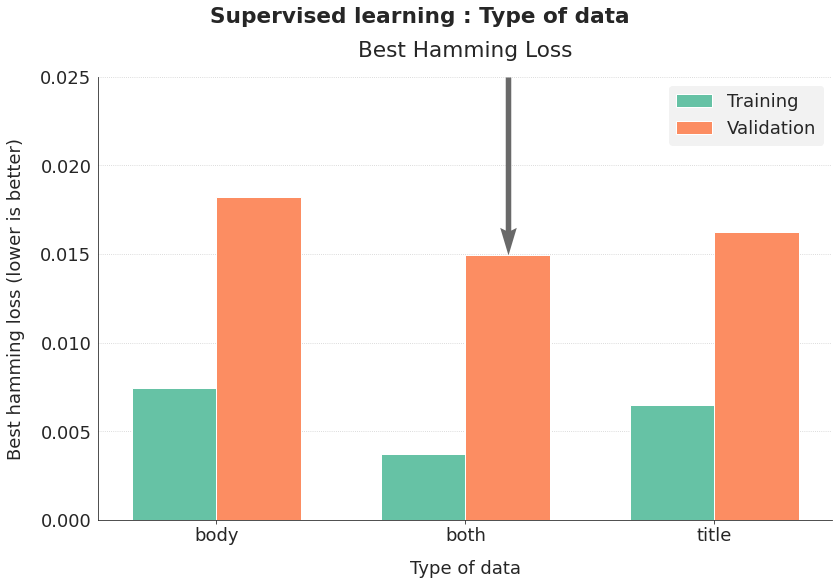

In [ ]:
fig, ax = graph_analysis(data_graph, "data", "Type of data",
                         "Supervised learning", isbar=True, ymax=0.025)
save_fig("ml05_03_supervised_data")
plt.show()

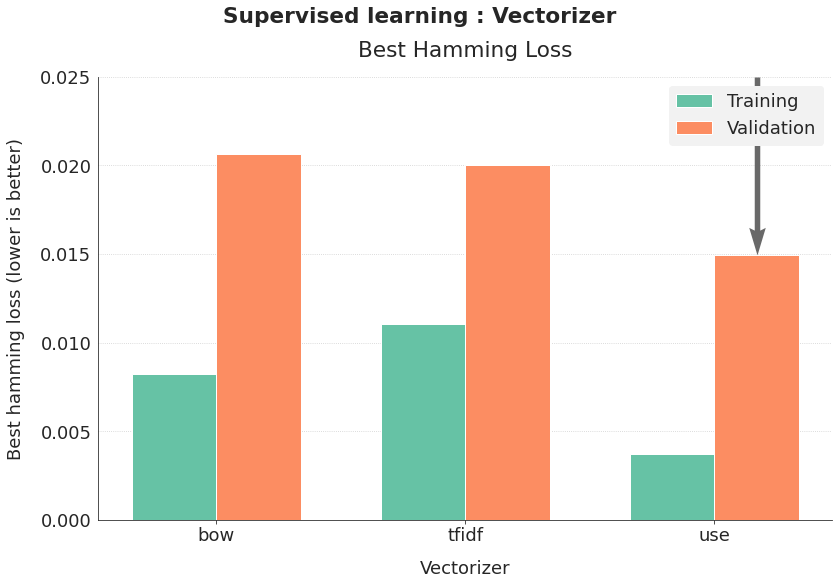

In [ ]:
fig, ax = graph_analysis(data_graph, "vectorizer", "Vectorizer",
                         "Supervised learning", isbar=True, ymax=0.025)
save_fig("ml05_03_supervised_vectorizer")
plt.show()

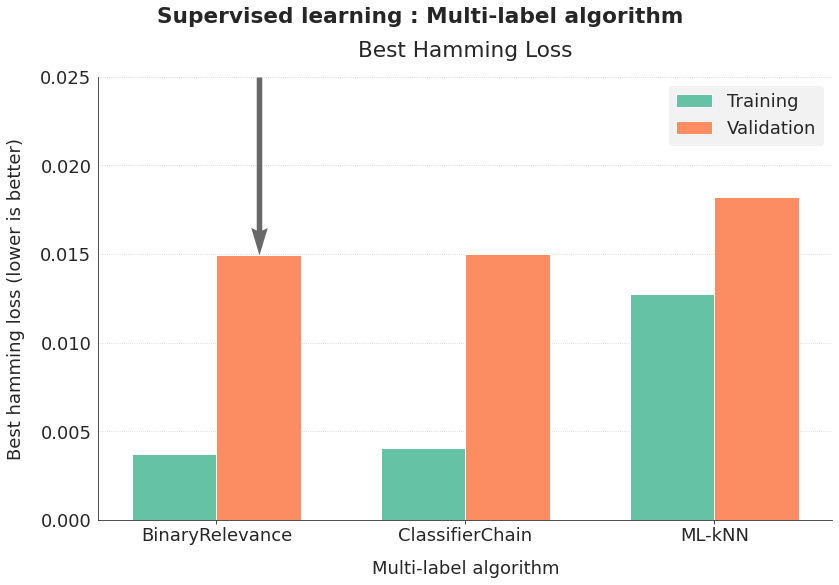

In [ ]:
fig, ax = graph_analysis(data_graph, "multi", "Multi-label algorithm",
                         "Supervised learning", isbar=True, ymax=0.025)
save_fig("ml05_03_supervised_multi")
plt.show()

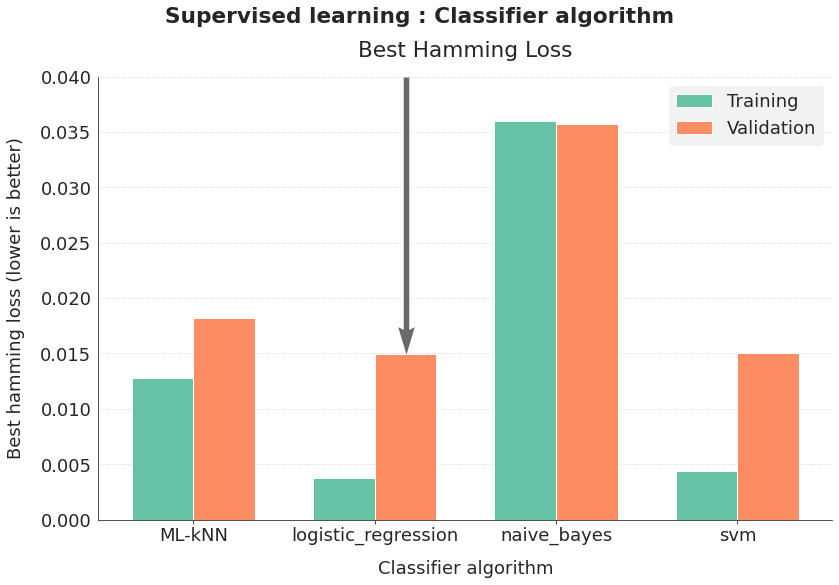

In [ ]:
fig, ax = graph_analysis(data_graph, "classifier", "Classifier algorithm",
                         "Supervised learning", isbar=True, ymax=0.04)
save_fig("ml05_03_supervised_classifier")
plt.show()

In [ ]:
logistic_summary =  pd.read_csv("hyperopt_supervised_logistic.csv")
logistic_summary["C"] = [np.around(np.float(param[param.find("C")+4:
        param.find("multi")-3]), 3) for param in logistic_summary.params_classifier]
logistic_summary.drop(columns=["params_data", "params_vectorizer", "params_classifier"],
                      inplace=True)
logistic_summary.sort_values(by="validation_hamming_loss").head(10)

,validation_hamming_loss,training_hamming_loss,fit_time,test_time,iteration,C
15,0.014937,0.010802,31.124638,0.362402,16,0.015
49,0.014943,0.011277,28.798143,0.370012,50,0.011
7,0.014964,0.010503,32.968112,0.362694,8,0.017
43,0.015003,0.010915,30.626303,0.346791,44,0.013
8,0.015006,0.011116,29.741730,0.347976,9,0.012
39,0.015012,0.011036,29.765040,0.360746,40,0.012
28,0.015018,0.010799,30.531919,0.370125,29,0.014
16,0.015018,0.011311,28.266636,0.358306,17,0.011
13,0.015022,0.011223,28.755768,0.361019,14,0.011
3,0.015035,0.011849,25.524224,0.332285,4,0.008


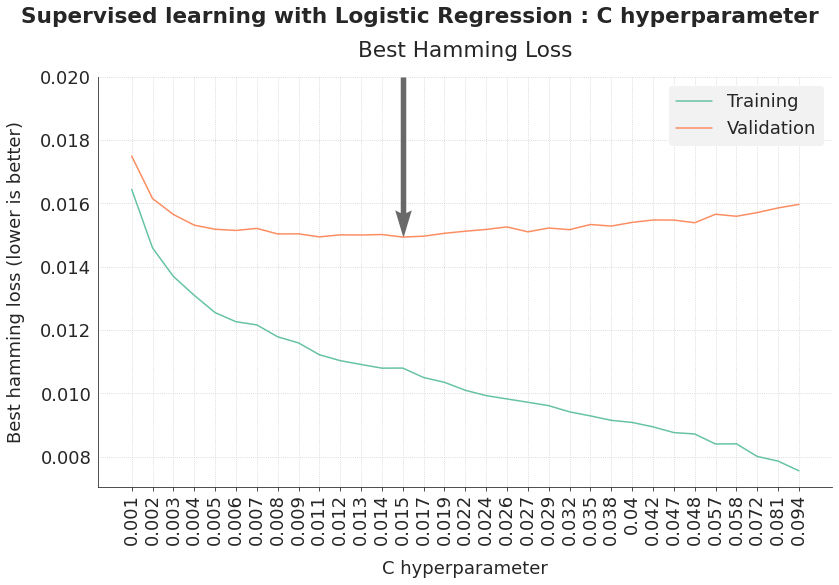

In [ ]:
fig, ax = graph_analysis(logistic_summary, "C", "C hyperparameter",
                         "Supervised learning with Logistic Regression",
                         ymax=0.020, rotation=90)
save_fig("ml05_03_logistic_regression_optimisation")
plt.show()